# Question 3
Group Members:

*   Yap Mou En - 1191301106
*   Lim Ying Shen - 1191301089
*   Aw Yew Lim - 1171103827

**Link to Heroku: https://data-mining-assignment-1.herokuapp.com/**


In [ ]:
from google.colab import drive
drive.mount('/content/drive') 

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
path = '/content/drive/Shareddrives/Data Mining/Question 3/'

In [ ]:
# Please install boruata and catboost by running the following code
!pip install boruta
!pip install catboost
!pip install lightgbm

In [ ]:
#Import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
from scipy.stats import zscore
from scipy import stats
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import Lasso, LinearRegression
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error as mse, mean_absolute_error, roc_curve, accuracy_score, classification_report, roc_auc_score
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn import svm
from sklearn.svm import SVC, SVR
from sklearn.neural_network import MLPClassifier, MLPRegressor
from sklearn import metrics
from boruta import BorutaPy
from lightgbm import LGBMRegressor
from xgboost.sklearn import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_curve
from lightgbm import LGBMClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
import warnings
import pickle
warnings.filterwarnings('ignore')

# 1.0 Exploratory Data Analysis

**Question 1** <br/>
Discuss the exploratory data analysis steps you have conducted including detection of outliers and missing values?  [2marks]

## 1.1 Cases and Testing


In [ ]:
cases_malaysia = pd.read_csv(path + 'cases_malaysia.csv')
tests_malaysia = pd.read_csv(path + 'tests_malaysia.csv')
#Missing Value Detection
print(cases_malaysia.isnull().sum(), "\n")
print(tests_malaysia.isnull().sum())

date                         0
cases_new                    0
cases_import                 0
cases_recovered              0
cluster_import             342
cluster_religious          342
cluster_community          342
cluster_highRisk           342
cluster_education          342
cluster_detentionCentre    342
cluster_workplace          342
dtype: int64 

date      0
rtk-ag    0
pcr       0
dtype: int64


We first used nation level data to visualize the cases and tests done. There are some NaN values in the cluster-related columns in cases_malaysia.csv but we are not going to use them. Therefore, we only pick 'date', 'cases_new' and 'cases_recovered' to do the visualization. We also dropped 'cases_import' because it has been included in cases_new.

For tests_malaysia.csv, we created a new column called 'total_tests' to sum up the total tests(rtk-ag + pcr) done in each day.

Outliers Detection for cases_malaysia.csv

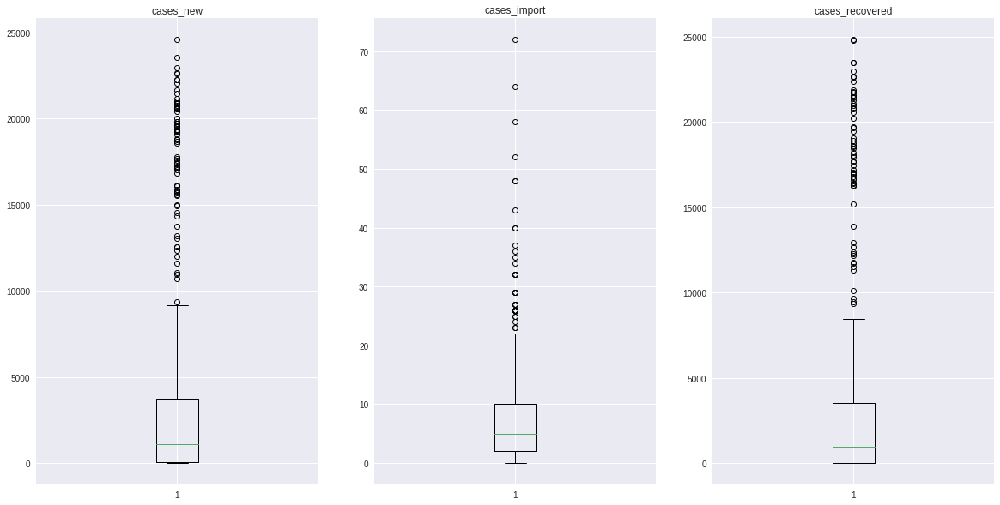

In [ ]:
cases_malaysia_boxplot = cases_malaysia.drop(columns=['date'])
plt.figure(figsize=(20,10))
plt.subplot(131),plt.boxplot(cases_malaysia_boxplot.cases_new),plt.title('cases_new')
plt.subplot(132),plt.boxplot(cases_malaysia_boxplot.cases_import),plt.title('cases_import')
plt.subplot(133),plt.boxplot(cases_malaysia_boxplot.cases_recovered),plt.title('cases_recovered')
plt.show()

From the boxplots above, we can observe that both cases_new and cases_recovered have a lot of outliers because of the sudden significant increase in the number of positive cases in certain periods. There are only a few outliers in cases_import because Malaysia has restrictions on entry of foreigners since the outbreak of Covid-19. However, we did not remove these outliers as the nation level data are not used in this assignment and training model.

Outliers Detection for tests_malaysia.csv

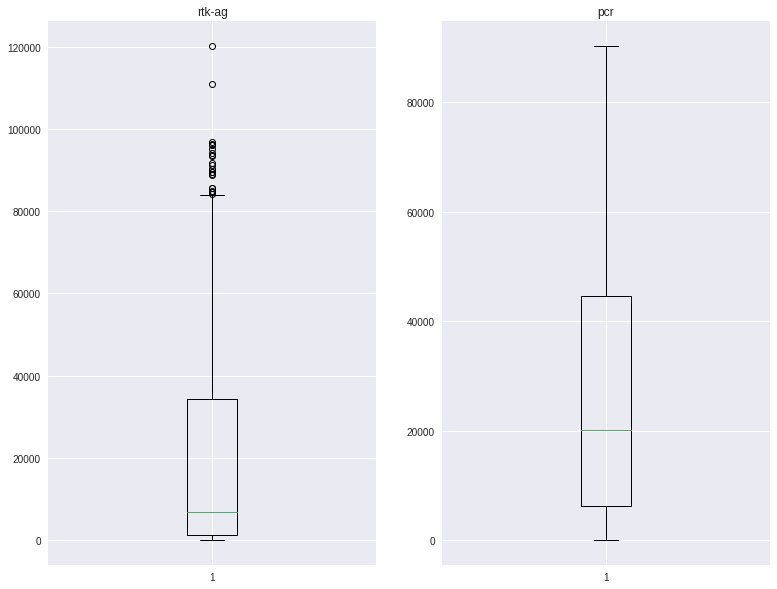

In [ ]:
tests_malaysia_boxplot = tests_malaysia.drop(columns=['date'])
plt.figure(figsize=(20,10))
plt.subplot(131),plt.boxplot(tests_malaysia_boxplot['rtk-ag']),plt.title('rtk-ag')
plt.subplot(132),plt.boxplot(tests_malaysia_boxplot.pcr),plt.title('pcr')
plt.show()

From the boxplots above, we can see that there are quite a lot of outliers in rtk-ag while there is no outlier in pcr as pcr has been widely used to test for the positiveness of Covid-19 from the very early stage of this pandemic. However, we did not remove these outliers as the nation level data are not used in this assignment and training model.

In [ ]:
cases_malaysia = cases_malaysia[['date', 'cases_new', 'cases_recovered']]
tests_malaysia['total_tests'] = tests_malaysia['rtk-ag'] + tests_malaysia['pcr']
df_malaysia = cases_malaysia.merge(tests_malaysia, how='left')
df_malaysia['date'] = pd.to_datetime(df_malaysia['date'])
df_malaysia.dropna(inplace=True)

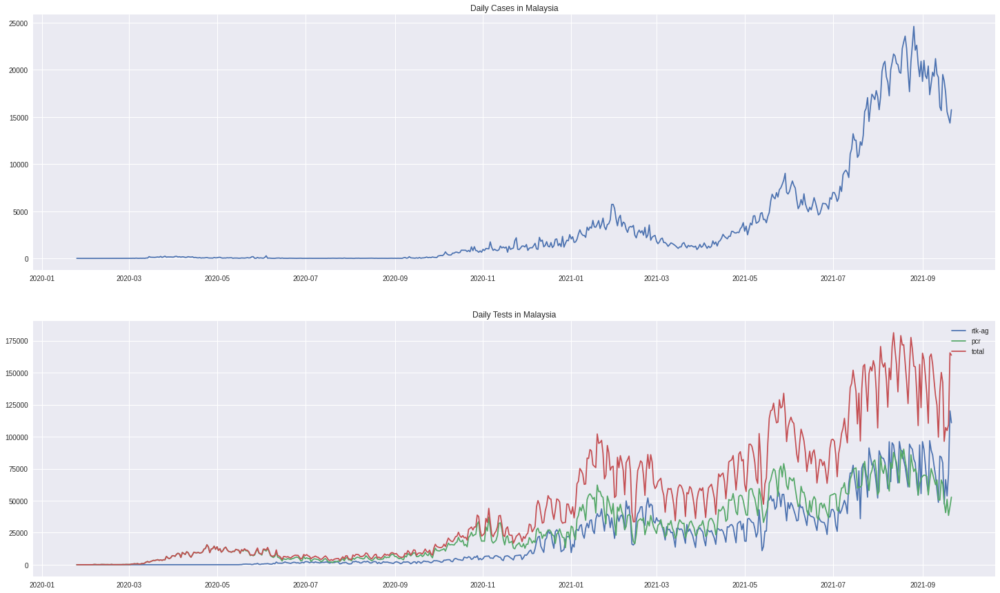

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(25,15))
ax1.plot(df_malaysia['date'], df_malaysia['cases_new'])
ax1.set_title('Daily Cases in Malaysia')
ax2.plot(df_malaysia['date'], df_malaysia['rtk-ag'], df_malaysia['date'], df_malaysia['pcr'], df_malaysia['date'], df_malaysia['total_tests'])
ax2.set_title('Daily Tests in Malaysia')
ax2.legend(['rtk-ag','pcr','total'],loc="upper right")
plt.show()

From the cases graph above, it is obvious to see that there are three waves of outbreaks occurred during this 21 months. Especially after the second waves, the cases increase significantly in July 2021 and the number of cases breaks through five-digit figure.

From the tests graph above, we can see that pcr test is mostly conducted at the very start of pandemic because the rtk-ag has not been developed yet. Since there are more and more cases arising, rtk-ag is developed to solve the understaffed issue of conducting pcr test.

For state level data, there is a problem in tests_state.csv. It only consists of data from July 2021 onwards. However, we still decided to join the cases_state dataframe and tests_state dataframe by left first to avoid loss of cases data for visualization purpose. We will drop the NaN values after done visualizing.

Besides, we also created a new column 'positivity_rate' to see if there is any correlation with other attributes. We also convert the datatype of 'date' for visualizing purpose as well.

We did not drop any attributes here because there will be a feature selection section after this. We therefore tried to keep all the attributes and let the feature selection algorithm choose the top attributes for us.

In [ ]:
#Cases and Testing - Aw

cases_state = pd.read_csv(path + 'cases_state.csv')
tests_state = pd.read_csv(path + 'tests_state.csv')
print(cases_state.isnull().sum(), "\n")
print(tests_state.isnull().sum(), "\n")


date               0
state              0
cases_import       0
cases_new          0
cases_recovered    0
dtype: int64 

date      0
state     0
rtk-ag    0
pcr       0
dtype: int64 



Outliers Detection for cases_state.csv

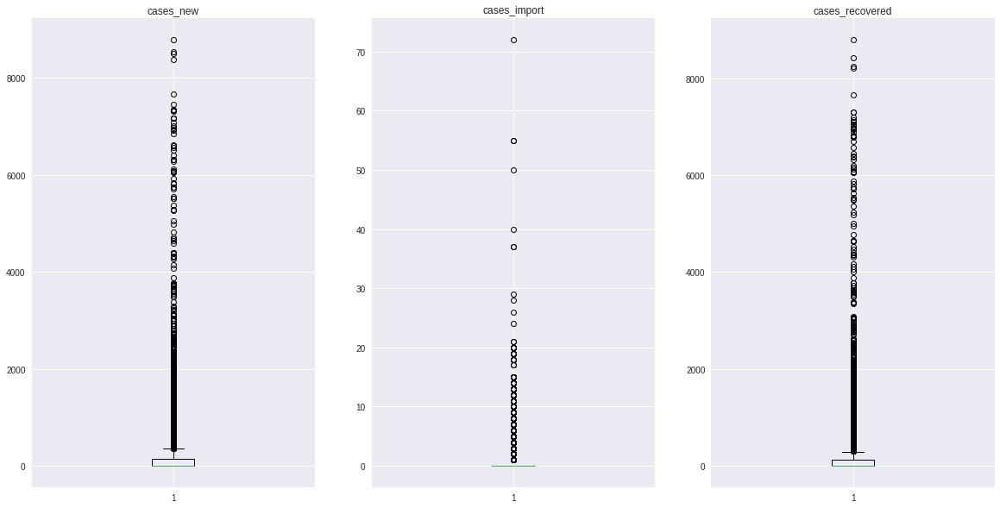

In [ ]:
cases_state_boxplot = cases_state.drop(columns=['date','state'])
plt.figure(figsize=(20,10))
plt.subplot(131),plt.boxplot(cases_state_boxplot.cases_new),plt.title('cases_new')
plt.subplot(132),plt.boxplot(cases_state_boxplot.cases_import),plt.title('cases_import')
plt.subplot(133),plt.boxplot(cases_state_boxplot.cases_recovered),plt.title('cases_recovered')
plt.show()

From the boxplots above, we can observe that there are a lot of outliers in cases_new and cases_recovered while there are fewer outliers in cases_import. It is similar to the reason mentioned in the boxplots of nation level dataset. However, we decided to not remove these outliers as the data are crucial to this assignment and training model.

Outliers Detection for tests_state.csv

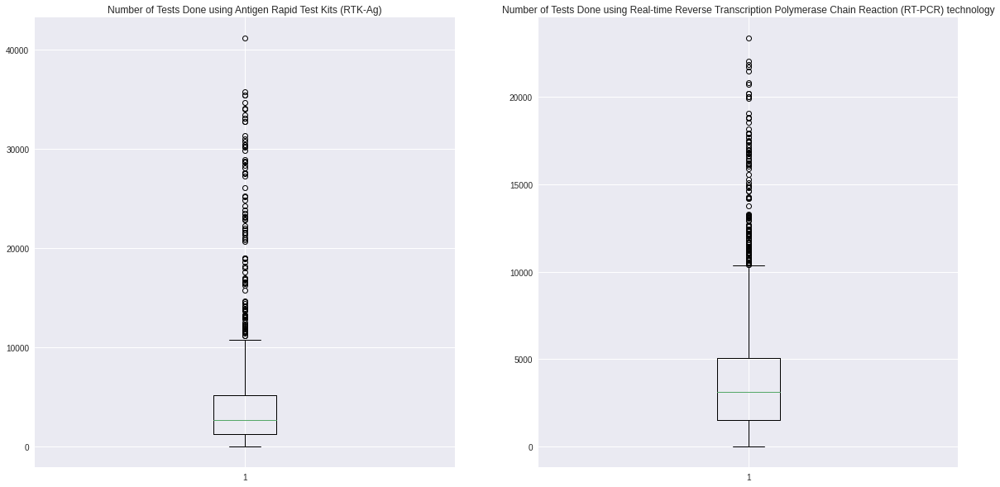

In [ ]:
tests_state_boxplot = tests_state.drop(columns=['date','state'])
plt.figure(figsize=(20,10))
plt.subplot(121),plt.boxplot(tests_state_boxplot['rtk-ag']),plt.title('Number of Tests Done using Antigen Rapid Test Kits (RTK-Ag)')
plt.subplot(122),plt.boxplot(tests_state_boxplot.pcr),plt.title('Number of Tests Done using Real-time Reverse Transcription Polymerase Chain Reaction (RT-PCR) technology')
plt.show()

From the boxplots above, we can see that there are quite a lot of outliers in both rtk-ag and pcr. This is because the distribution of the number of tests done in each state is not normal. Some states with more populations will conduct more tests while state with less population like Perlis conducted only a few tests in each month. Therefore, some states with extremely less tests and more tests will be treated as outliers. However, we did not remove these outliers as the nation level data are not used in this assignment and training model.

In [ ]:
tests_state['total_tests'] = tests_state['rtk-ag'] + tests_state['pcr']
df = cases_state.merge(tests_state, on=['date','state'], how='left')
df['positivity_rate'] = df['cases_new'] / df['total_tests']
#change to datetime
df['date']= pd.to_datetime(df['date'])
print(df.isnull().sum())

# Highest tests by states
#tests_state.groupby(['state']).sum().sort_values(['total_tests'], ascending=False)

date                  0
state                 0
cases_import          0
cases_new             0
cases_recovered       0
rtk-ag             8400
pcr                8400
total_tests        8400
positivity_rate    8400
dtype: int64


In [ ]:
df

,date,state,cases_import,cases_new,cases_recovered,rtk-ag,pcr,total_tests,positivity_rate
0,2020-01-25,Johor,4,4,0,NaN,NaN,NaN,NaN
1,2020-01-25,Kedah,0,0,0,NaN,NaN,NaN,NaN
2,2020-01-25,Kelantan,0,0,0,NaN,NaN,NaN,NaN
3,2020-01-25,Melaka,0,0,0,NaN,NaN,NaN,NaN
4,2020-01-25,Negeri Sembilan,0,0,0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
9723,2021-09-23,Selangor,0,1985,2627,NaN,NaN,NaN,NaN
9724,2021-09-23,Terengganu,0,664,707,NaN,NaN,NaN,NaN
9725,2021-09-23,W.P. Kuala Lumpur,1,383,474,NaN,NaN,NaN,NaN
9726,2021-09-23,W.P. Labuan,0,8,8,NaN,NaN,NaN,NaN


Check correlation between each attribute. Also check every attributes' correlation with 'cases_new' since it is the attribute we want to predict at the end.

In [ ]:
df.corr()
#cases_new,cases_recovered,rtk-ag,pcr

,cases_import,cases_new,cases_recovered,rtk-ag,pcr,total_tests,positivity_rate
cases_import,1.000000,0.210583,0.189857,0.327592,0.326117,0.344838,0.004081
cases_new,0.210583,1.000000,0.893134,0.851944,0.820278,0.884710,0.440980
cases_recovered,0.189857,0.893134,1.000000,0.771407,0.668236,0.768727,0.395397
rtk-ag,0.327592,0.851944,0.771407,1.000000,0.791779,0.964187,0.136254
pcr,0.326117,0.820278,0.668236,0.791779,1.000000,0.925424,0.136860
total_tests,0.344838,0.884710,0.768727,0.964187,0.925424,1.000000,0.143957
positivity_rate,0.004081,0.440980,0.395397,0.136254,0.136860,0.143957,1.000000


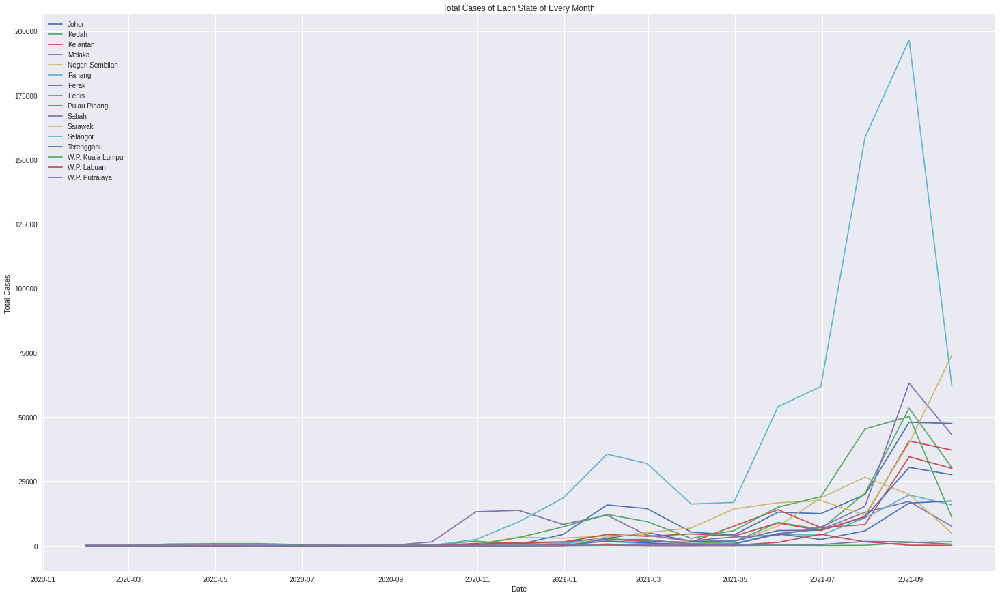

In [ ]:
plt.figure(figsize=(25,15))
for state in pd.unique(df['state']):
    data = df[df['state'] == state]
    cases = data.groupby([pd.Grouper(key='date', axis=0, freq='M')]).agg('sum')
    plt.plot(cases.index.values, cases['cases_new'], label = state)

plt.xlabel('Date')
plt.ylabel('Total Cases')
plt.title('Total Cases of Each State of Every Month')
plt.legend()
plt.show()

From the graph above, it is obvious to see that Selangor has the highest number of cases since December 2020. This might be related to the population as Selangor has the highest population in Malaysia. Before the outbreak in Selangor, the number of cases in Sabah is the highest.

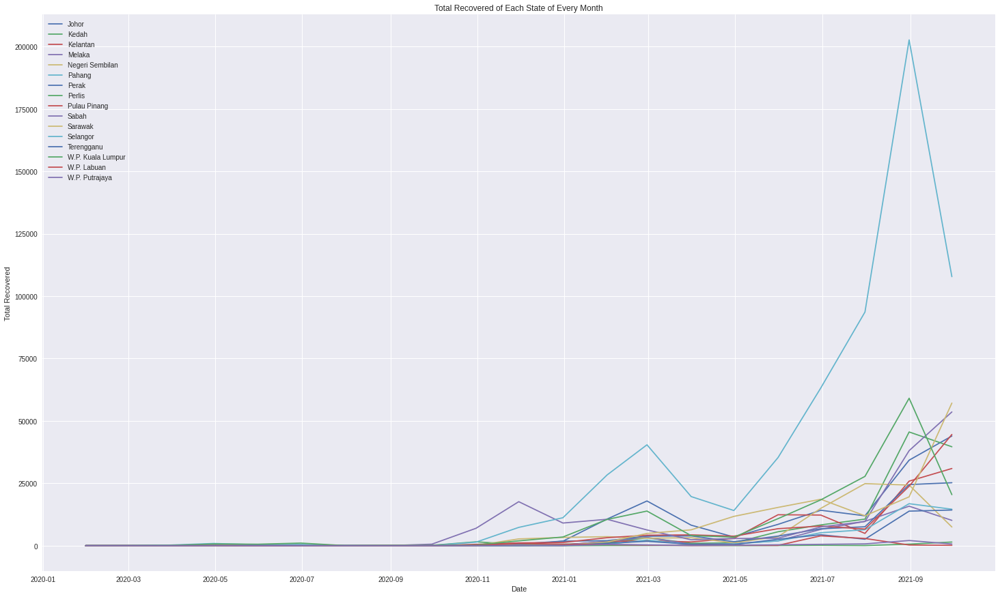

In [ ]:
plt.figure(figsize=(25,15))
for state in pd.unique(df['state']):
    data = df[df['state'] == state]
    recover = data.groupby([pd.Grouper(key='date', axis=0, freq='M')]).agg('sum')
    plt.plot(recover.index.values, recover['cases_recovered'], label = state)

plt.xlabel('Date')
plt.ylabel('Total Recovered')
plt.title('Total Recovered of Each State of Every Month')
plt.legend()
plt.show()

From the graph above, it is also obvious to see that Selangor has the highest number of recovered cases in overall because Selangor has the highest cases. With the same reason, Perlis has the lowest recovered cases because they have the lowest new cases every month.

Due to the missing data from the start of this Covid-19 pandemic until July 2021, we temporarily drop all the NaN values to visualize only the available data regarding to the number of tests conducted every day. However, we visualize the data by weekly due to lack of data. 

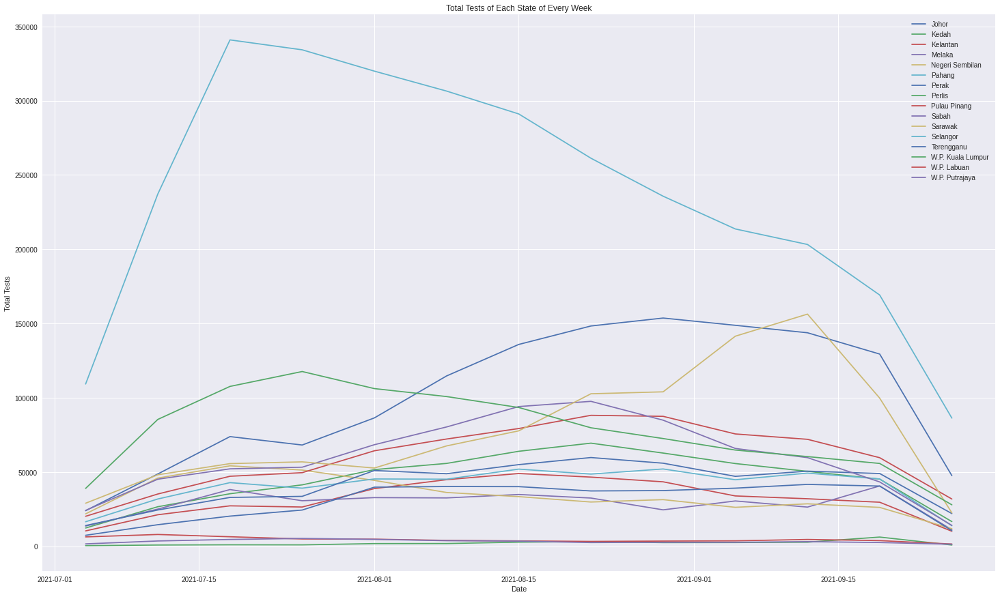

In [ ]:
plt.figure(figsize=(25,15))
for state in pd.unique(df['state']):
    data = df[df['state'] == state].dropna()
    tests = data.groupby([pd.Grouper(key='date', axis=0, freq='W')]).agg('sum')
    plt.plot(tests.index.values, tests['total_tests'], label = state)

plt.xlabel('Date')
plt.ylabel('Total Tests')
plt.title('Total Tests of Each State of Every Week')
plt.legend()
plt.show()

From the graph above, we can see that Selangor has conducted more tests compared to other states. This is because the new cases of Selangor is high and the number of medical centres in Selangor is higher than other states.

We also visualize the number of rtk-ag and pcr tests conducted in each state.

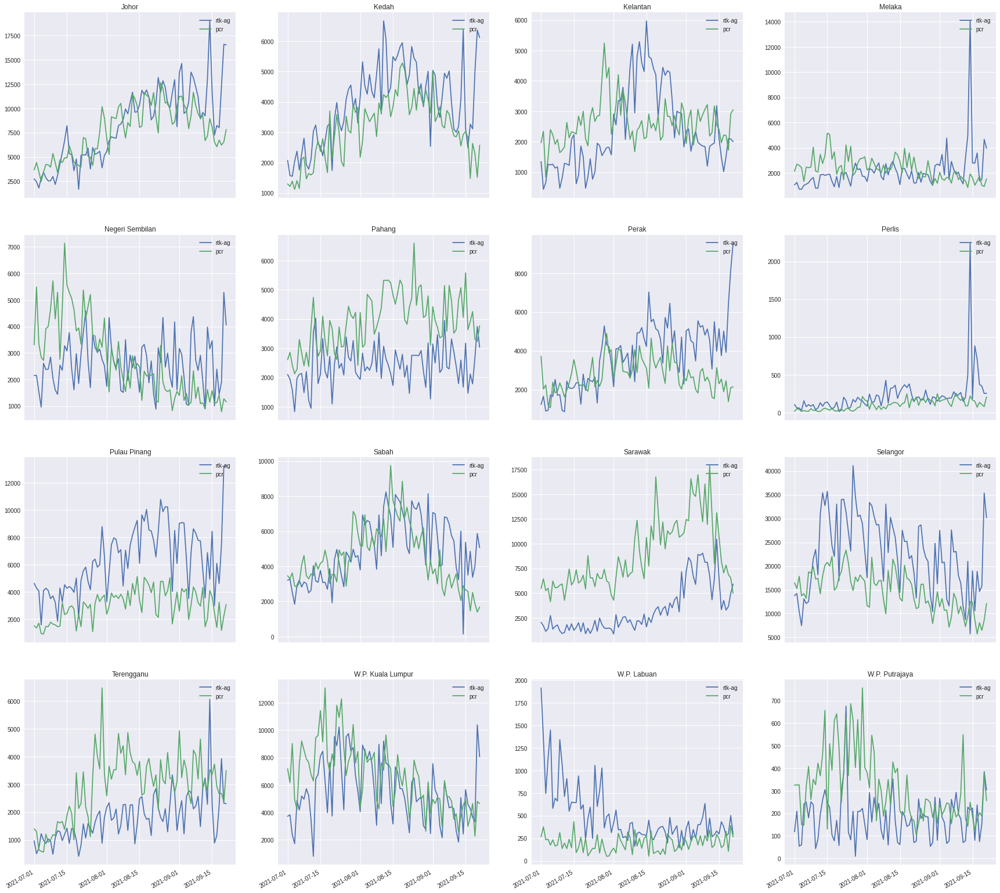

In [ ]:
fig, ax = plt.subplots(4, 4, figsize=(30,30))
for i, state in enumerate(pd.unique(df['state'])):
    df_state = df[df['state'] == state]
    ax[i//4][i%4].plot(df_state['date'], df_state['rtk-ag'], df_state['date'], df_state['pcr'])
    ax[i//4][i%4].set_title(state)
    ax[i//4][i%4].legend(['rtk-ag', 'pcr'], loc="upper right")
    fig.autofmt_xdate()

plt.show()

The graphs above are the number of rtk-ag and pcr conducted every month. Overall, we can observe that Sarawak and Pahang has conducted more pcr tests than rtk-ag while Pulau Pinang and W.P. Labuan conducted more rtk-ag than pcr tests.

We only drop the rows of data with NaN value after visualizing the data because dropping the NaN values will remove all the data before 07/2021 due to the missing value in column 'rtk-ag' and 'pcr'.

In [ ]:
df.dropna(inplace=True)
df

,date,state,cases_import,cases_new,cases_recovered,rtk-ag,pcr,total_tests,positivity_rate
8368,2021-07-01,Johor,1,270,361,2749.0,3670.0,6419.0,0.042063
8369,2021-07-01,Kedah,0,250,186,2073.0,1297.0,3370.0,0.074184
8370,2021-07-01,Kelantan,0,108,208,1348.0,1966.0,3314.0,0.032589
8371,2021-07-01,Melaka,0,311,317,1049.0,2132.0,3181.0,0.097768
8372,2021-07-01,Negeri Sembilan,0,692,883,2151.0,3306.0,5457.0,0.126810
...,...,...,...,...,...,...,...,...,...
9691,2021-09-21,Selangor,8,1934,2463,30167.0,12133.0,42300.0,0.045721
9692,2021-09-21,Terengganu,0,592,218,2306.0,3495.0,5801.0,0.102051
9693,2021-09-21,W.P. Kuala Lumpur,8,359,604,8056.0,4643.0,12699.0,0.028270
9694,2021-09-21,W.P. Labuan,9,12,7,293.0,267.0,560.0,0.021429


## 1.2 Deaths



In [ ]:
#Death

raw_death = pd.read_csv(path + 'deaths_state.csv')

month = {'2020-03-31 00:00:00':'March', '2020-04-30 00:00:00':'April','2020-05-31 00:00:00':'May','2020-06-30 00:00:00':'June','2020-07-31 00:00:00':'July','2020-08-31 00:00:00':'August','2020-09-30 00:00:00':'September','2020-10-31 00:00:00':'October','2020-11-30 00:00:00':'November','2020-12-31 00:00:00':'December',
         '2021-01-31 00:00:00':'January','2021-02-28 00:00:00':'February','2021-03-31 00:00:00':'March','2021-04-30 00:00:00':'April','2021-05-31 00:00:00':'May','2021-06-30 00:00:00':'June','2021-07-31 00:00:00':'July','2021-08-31 00:00:00':'August','2021-09-30 00:00:00':'September',}

m_state = {'Johor','Kedah','Kelantan','Melaka','Negeri Sembilan','Pahang','Pulau Pinang','Perak','Perlis','Selangor','Terengganu','Sabah','Sarawak','W.P. Kuala Lumpur','W.P. Labuan','W.P. Putrajaya'}
#Missing Value Detection
print(raw_death.isna().sum())
raw_death['date']= pd.to_datetime(raw_death['date'])
final_death = raw_death.copy()

group_death = final_death.groupby([pd.Grouper(key='date', axis=0, freq='M'),"state"]).agg('sum')
death_state = final_death.groupby(['state']).sum()
death_month = final_death.groupby(pd.Grouper(key='date', axis=0, freq='M')).sum()
maxMonth = str(death_month['deaths_new'].idxmax())
display(group_death)

date              0
state             0
deaths_new        0
deaths_new_dod    0
deaths_bid        0
deaths_bid_dod    0
dtype: int64


deaths_new  ...  deaths_bid_dod
date       state                          ...                
2020-03-31 Johor                      12  ...               0
           Kedah                       1  ...               0
           Kelantan                    2  ...               0
           Melaka                      2  ...               0
           Negeri Sembilan             2  ...               0
...                                  ...  ...             ...
2021-09-30 Selangor                 2973  ...             101
           Terengganu                 98  ...               6
           W.P. Kuala Lumpur         336  ...              37
           W.P. Labuan                 0  ...               0
           W.P. Putrajaya              0  ...               0

[304 rows x 4 columns]

We decided to use deaths_state.csv as our death dataset because it contains the state info compared to deaths_malaysia.csv. We found out that there are no NaN values in the dataframe. Then, we group the dataframe by time and state for further exploration

Outliers Detection for death_state.csv

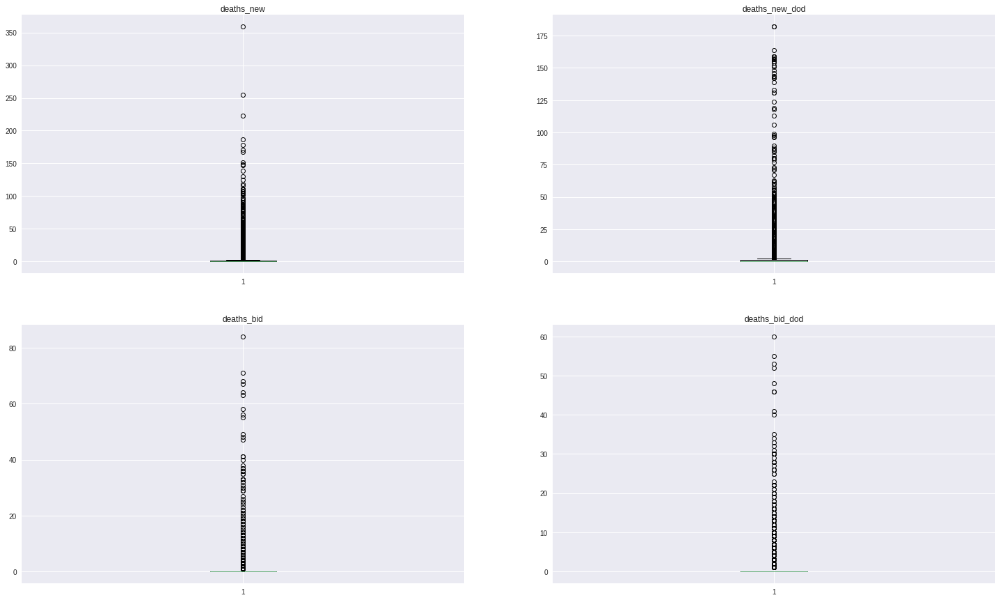

In [ ]:
raw_death_boxplot = raw_death.drop(columns=['date','state'])
plt.figure(figsize=(25,15))
plt.subplot(221),plt.boxplot(raw_death_boxplot.deaths_new),plt.title('deaths_new')
plt.subplot(222),plt.boxplot(raw_death_boxplot.deaths_new_dod),plt.title('deaths_new_dod')
plt.subplot(223),plt.boxplot(raw_death_boxplot.deaths_bid),plt.title('deaths_bid')
plt.subplot(224),plt.boxplot(raw_death_boxplot.deaths_bid_dod),plt.title('deaths_bid_dod')
plt.show()

From the boxplots, above, we can see that deaths_new, deaths_new_dod, deaths_bid and deaths_bid_dod contain many outliers. This is due to the fact that at the early stage of COVID-19 has very less death occurs. The death surge after several waves of COVID-19 attacked Malaysia. We decided to not remove the outliers as they are very crucial to the assignment and training model.

In [ ]:
print("The mean death of Malaysia is " + str(death_state['deaths_new'].mean()))
print("The state with the most death is " + str(death_state['deaths_new'].idxmax()) + ' at ' + str(death_state['deaths_new'].max()))
print("The month with the most death is " + month[maxMonth] + ' at ' + str(death_month['deaths_new'].max()))

The mean death of Malaysia is 1542.5625
The state with the most death is Selangor at 8913
The month with the most death is September at 8017


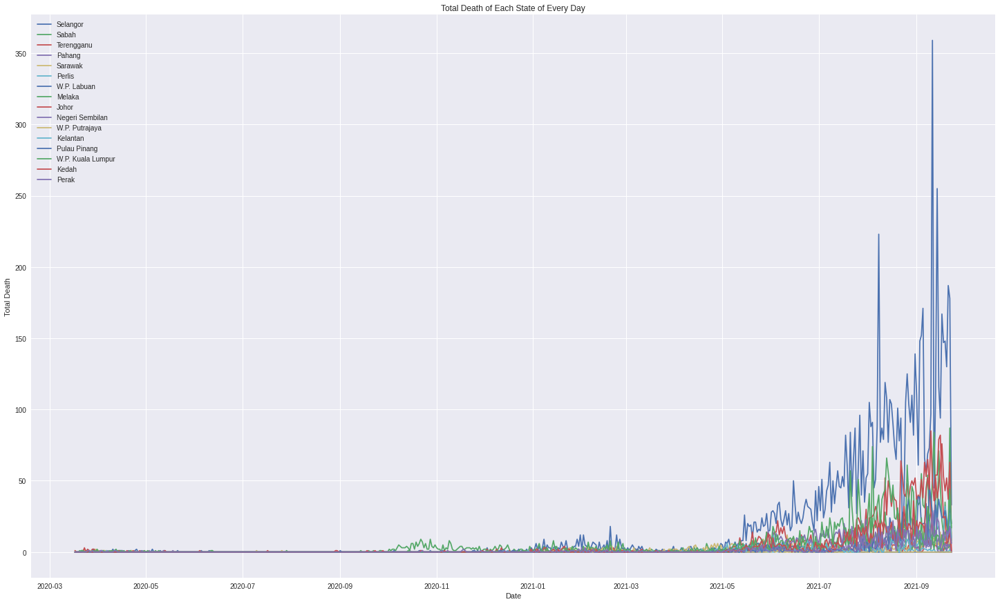

In [ ]:
plt.figure(figsize=(25,15))
for i in m_state:
  x = final_death[final_death['state'] == i]
  #s_death = x.groupby([pd.Grouper(key='date', axis=0, freq='M')]).agg('sum')
  plt.plot(x['date'], x['deaths_new'], label = i)

plt.xlabel('Date')
plt.ylabel('Total Death')
plt.title('Total Death of Each State of Every Day')
plt.legend()
plt.show()

The graph above shows the total death of every state in Malaysia every day. We can see that Selangor has the highest amount of total death among other states. We also noticed that the total death surged for every state after May 2021. This may be due to the delta virus that attacks Malaysia around this period.

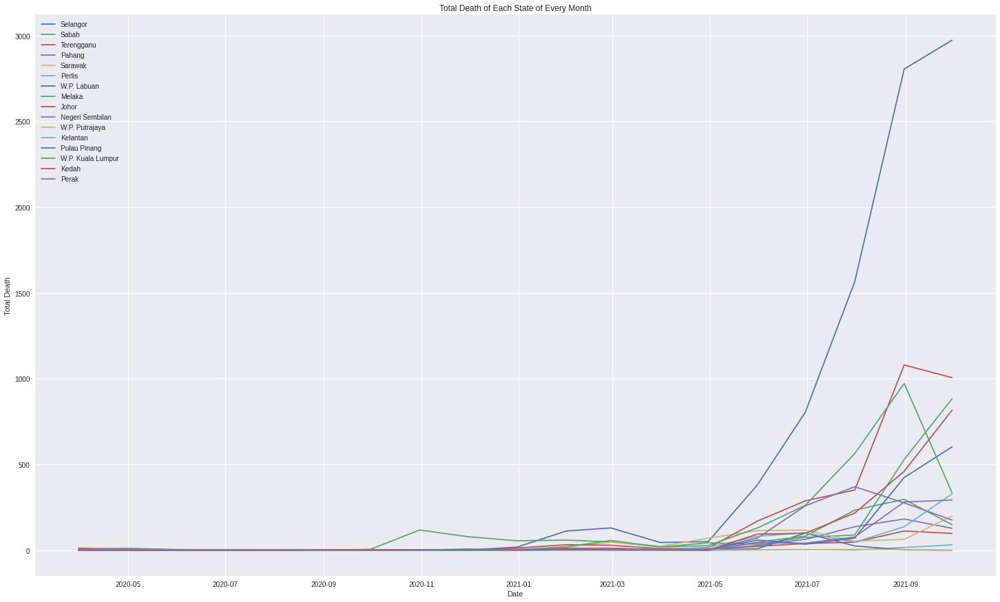

In [ ]:
plt.figure(figsize=(25,15))
for i in m_state:
  x = final_death[final_death['state'] == i]
  s_death = x.groupby([pd.Grouper(key='date', axis=0, freq='M')]).agg('sum')
  plt.plot(s_death.index.values, s_death['deaths_new'], label = i)

plt.xlabel('Date')
plt.ylabel('Total Death')
plt.title('Total Death of Each State of Every Month')
plt.legend()
plt.show()

The graph above shows the total death of every state in Malaysia for every month. We can see that Selangor topped the graph with a huge difference compared to other states. 

## 1.3 Static Data


In [ ]:
#population.csv
pop = pd.read_csv(path + 'population.csv')
print(pop.isna().sum())
pop = pop.drop(0)
mean = pop["pop"].mean()
mean18 = pop['pop_18'].mean()
mean60 = pop['pop_60'].mean()
print("The mean population of Malaysia is " + str(mean))
print("The mean population of above 18 years old in Malaysia is " + str(mean18))
print("The mean population of above 60 years old in Malaysia is " + str(mean60))

state     0
idxs      0
pop       0
pop_18    0
pop_60    0
pop_12    0
dtype: int64
The mean population of Malaysia is 2041087.5
The mean population of above 18 years old in Malaysia is 1463100.0
The mean population of above 60 years old in Malaysia is 218875.0


This dataset tells us about the population of Malaysia. We found out that the dataset does not contain any NaN value. We dropped the first row because it is the population of Malaysia as we only focus on the states.

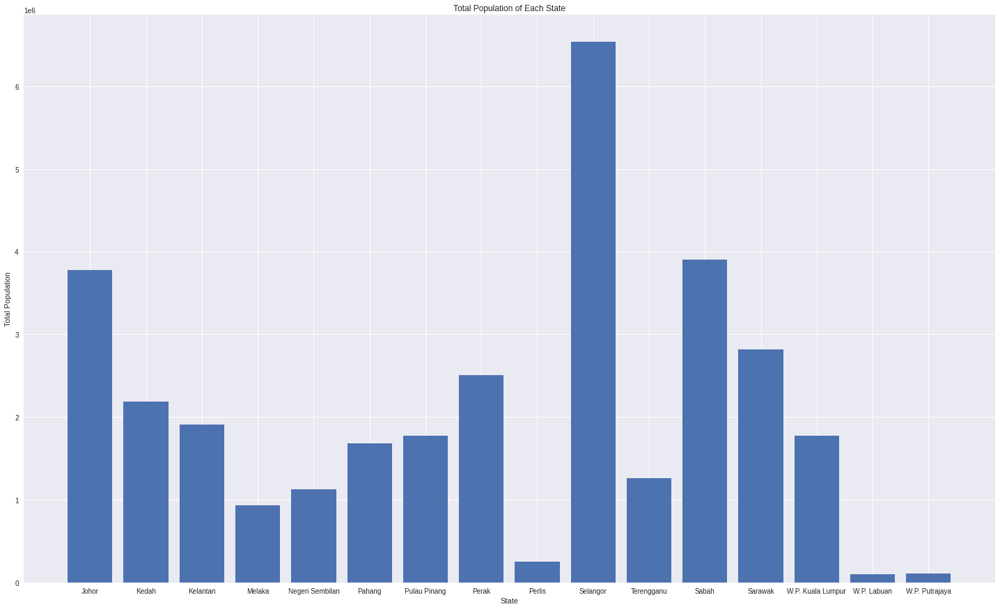

In [ ]:
plt.figure(figsize=(25,15))
plt.bar(pop['state'],pop['pop'])
plt.xlabel('State')
plt.ylabel('Total Population')
plt.title('Total Population of Each State')
plt.show()

The graph shows the total population of every state in Malaysia. Selangor comes into first place due to it is the main economic center in Malaysia. Johor and Sabah are very similar in terms of the total population. W.P. Labuan and W.P. Putrajaya have the least total population. This is mainly restricted by its land size and proximity to another large state.

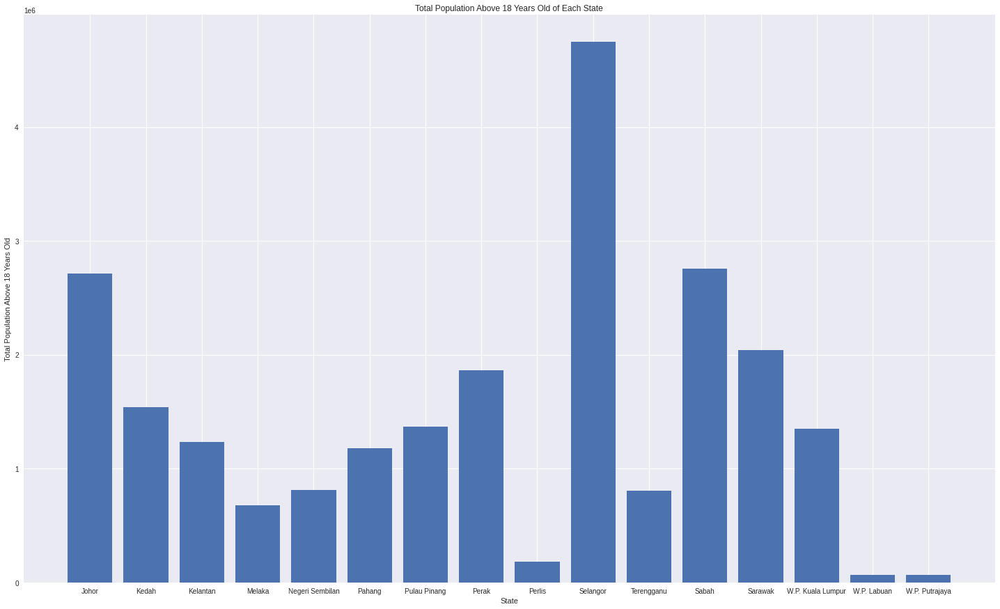

In [ ]:
plt.figure(figsize=(25,15))
plt.bar(pop['state'],pop['pop_18'])
plt.xlabel('State')
plt.ylabel('Total Population Above 18 Years Old')
plt.title('Total Population Above 18 Years Old of Each State')
plt.show()

The graph shows the total population of people aged 18 years old and above in Malaysia. We can see that the pattern generally follows the pattern of the total population of every state in Malaysia.

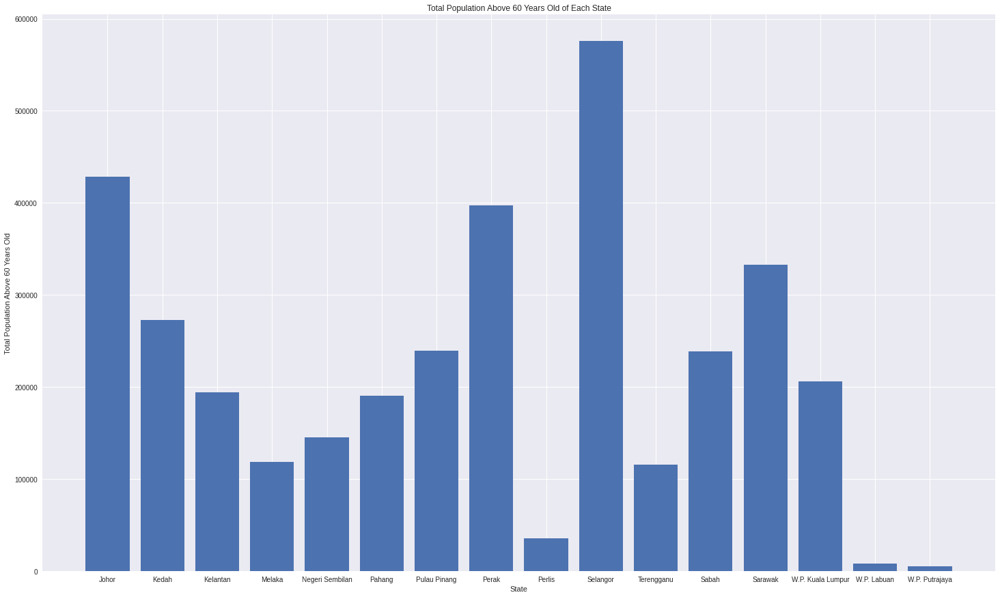

In [ ]:
plt.figure(figsize=(25,15))
plt.bar(pop['state'],pop['pop_60'])
plt.xlabel('State')
plt.ylabel('Total Population Above 60 Years Old')
plt.title('Total Population Above 60 Years Old of Each State')
plt.show()

The graph shows the total population of people aged 60 years old and above in Malaysia. We can see that the pattern generally follows the pattern of the total population of every state in Malaysia except Sabah and Sarawak. Sarawak has more senior citizens but its total population is lesser than Sabah. Similarly, Sabah has lesser senior citizens but the total population is more than Sarawak.

## 1.4 Healthcare

### 1.4.1 PKRC


admitted_covid, discharge_covid


In [ ]:
#Healthcare 
#read pkrc.csv

pkrc = pd.read_csv(path + 'pkrc.csv')
pkrc['date']= pd.to_datetime(pkrc['date'])

##check for duplicates
#no duplicate row
print("Total duplicated rows:",sum(pkrc.duplicated()))

##deal with missing data
#no missing data
print("Number of null values:\n",pkrc.isnull().sum().sort_values(ascending = False))

pkrc

Total duplicated rows: 0
Number of null values:
 pkrc_noncovid      0
pkrc_pui           0
pkrc_covid         0
discharge_total    0
discharge_covid    0
discharge_pui      0
admitted_total     0
admitted_covid     0
admitted_pui       0
beds               0
state              0
date               0
dtype: int64


,date,state,beds,admitted_pui,admitted_covid,admitted_total,discharge_pui,discharge_covid,discharge_total,pkrc_covid,pkrc_pui,pkrc_noncovid
0,2020-03-28,Kelantan,147,0,0,0,0,0,0,0,53,0
1,2020-03-28,Perlis,54,0,0,0,0,0,0,8,3,0
2,2020-03-28,Pulau Pinang,58,0,0,0,0,0,0,13,0,0
3,2020-03-28,Sarawak,74,0,0,0,0,0,0,22,0,0
4,2020-03-28,Selangor,1452,0,12,12,0,5,5,145,0,8
...,...,...,...,...,...,...,...,...,...,...,...,...
6346,2021-09-23,Sabah,4571,13,304,317,10,414,424,2290,109,0
6347,2021-09-23,Sarawak,9077,76,142,218,2,516,518,4460,488,0
6348,2021-09-23,Selangor,3992,4,345,349,3,279,282,2074,15,0
6349,2021-09-23,Terengganu,2912,12,194,206,84,244,328,1133,61,0


In [ ]:
#rename columns to avoid confusion 
pkrc.rename(columns=
{
"admitted_pui": "pkrc_admitted_pui",
"admitted_covid": "pkrc_admitted_covid",
"admitted_total": "pkrc_admitted_total",
"discharge_pui": "pkrc_discharged_pui",
"discharge_covid": "pkrc_discharged_covid",
"discharge_total": "pkrc_discharged_total"
}, inplace=True)

pkrc

,date,state,beds,pkrc_admitted_pui,pkrc_admitted_covid,pkrc_admitted_total,pkrc_discharged_pui,pkrc_discharged_covid,pkrc_discharged_total,pkrc_covid,pkrc_pui,pkrc_noncovid
0,2020-03-28,Kelantan,147,0,0,0,0,0,0,0,53,0
1,2020-03-28,Perlis,54,0,0,0,0,0,0,8,3,0
2,2020-03-28,Pulau Pinang,58,0,0,0,0,0,0,13,0,0
3,2020-03-28,Sarawak,74,0,0,0,0,0,0,22,0,0
4,2020-03-28,Selangor,1452,0,12,12,0,5,5,145,0,8
...,...,...,...,...,...,...,...,...,...,...,...,...
6346,2021-09-23,Sabah,4571,13,304,317,10,414,424,2290,109,0
6347,2021-09-23,Sarawak,9077,76,142,218,2,516,518,4460,488,0
6348,2021-09-23,Selangor,3992,4,345,349,3,279,282,2074,15,0
6349,2021-09-23,Terengganu,2912,12,194,206,84,244,328,1133,61,0


The pkrc.csv tells us about the COVID-19 Quarantine and Treament Centre in every state in Malaysia. There is no duplicated and NaN value in this dataset. After that, we decided to rename some columns because they may clash with the names from other datasets.

Outliers Detection for pkrc.csv

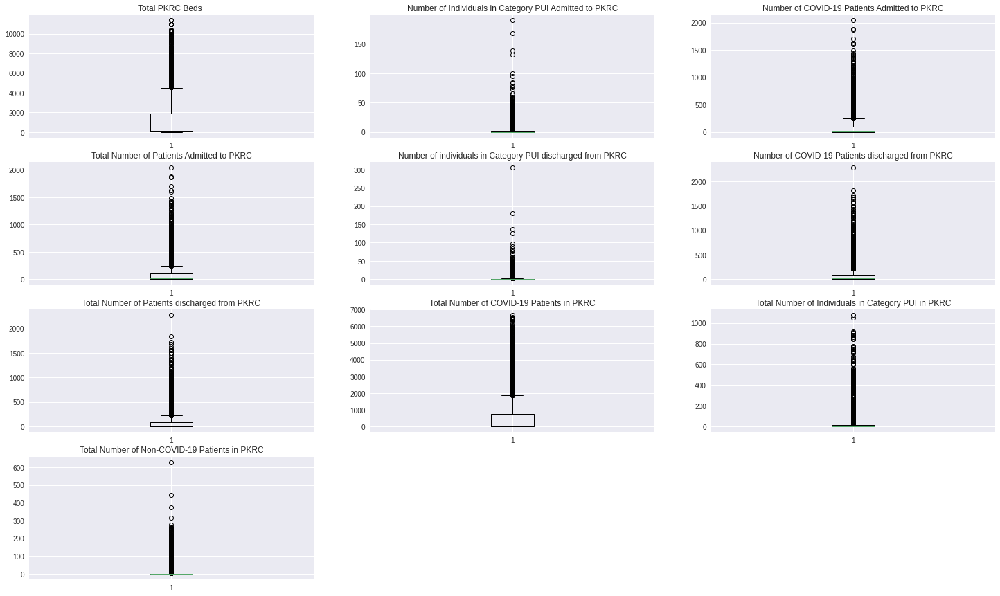

In [ ]:
#Outlier Detection
pkrc_boxplot = pkrc.drop(columns=['date','state'])
plt.figure(figsize=(25,15))
plt.subplot(431),plt.boxplot(pkrc_boxplot.beds),plt.title('Total PKRC Beds ')
plt.subplot(432),plt.boxplot(pkrc_boxplot.pkrc_admitted_pui),plt.title('Number of Individuals in Category PUI Admitted to PKRC')
plt.subplot(433),plt.boxplot(pkrc_boxplot.pkrc_admitted_covid),plt.title('Number of COVID-19 Patients Admitted to PKRC')
plt.subplot(434),plt.boxplot(pkrc_boxplot.pkrc_admitted_total),plt.title('Total Number of Patients Admitted to PKRC')
plt.subplot(435),plt.boxplot(pkrc_boxplot.pkrc_discharged_pui),plt.title('Number of individuals in Category PUI discharged from PKRC')
plt.subplot(436),plt.boxplot(pkrc_boxplot.pkrc_discharged_covid),plt.title('Number of COVID-19 Patients discharged from PKRC')
plt.subplot(437),plt.boxplot(pkrc_boxplot.pkrc_discharged_total),plt.title('Total Number of Patients discharged from PKRC')
plt.subplot(438),plt.boxplot(pkrc_boxplot.pkrc_covid),plt.title('Total Number of COVID-19 Patients in PKRC')
plt.subplot(439),plt.boxplot(pkrc_boxplot.pkrc_pui),plt.title('Total Number of Individuals in Category PUI in PKRC')
plt.subplot(4,3,10),plt.boxplot(pkrc_boxplot.pkrc_noncovid),plt.title('Total Number of Non-COVID-19 Patients in PKRC')
plt.show()

Based on the boxplot above, we can see that every column in the 'pkrc.csv' dataset contains a lot of outliers. All of the boxplots showed that the data is positively skewed. This may be due to the slow start of the COVID-19 pandemic which contains a low number of COVID-19 cases, followed by a sudden increase of high number COVID-19 cases that caused a high number of patients admitted to the PKRC. However, we decided to not remove these outliers as the data are crucial to this assignment and training model.

In [ ]:
#group by state
state_pkrc = pkrc.groupby(['state']).sum()
state_pkrc.reset_index(inplace = True)
state_pkrc 

,state,beds,pkrc_admitted_pui,pkrc_admitted_covid,pkrc_admitted_total,pkrc_discharged_pui,pkrc_discharged_covid,pkrc_discharged_total,pkrc_covid,pkrc_pui,pkrc_noncovid
0,Johor,568999,173,44946,45119,127,45212,45339,324033,467,210
1,Kedah,247929,51,13904,13955,17,13047,13064,85089,193,0
2,Kelantan,472080,1523,35900,37423,1553,33769,35322,249863,9214,1193
3,Melaka,242234,70,17613,17683,62,15820,15882,113938,147,75
4,Negeri Sembilan,404603,0,25262,25262,0,23333,23333,145154,0,0
5,Pahang,515268,1422,32753,34175,970,29029,29999,278295,9040,3541
6,Perak,314400,53,19552,19605,20,15462,15482,134849,346,47846
7,Perlis,77378,293,881,1174,109,1256,1365,9074,793,2
8,Pulau Pinang,472210,0,29571,29571,0,29606,29606,167738,0,443
9,Sabah,1629432,3392,83926,87318,2133,81719,83852,535284,21150,33


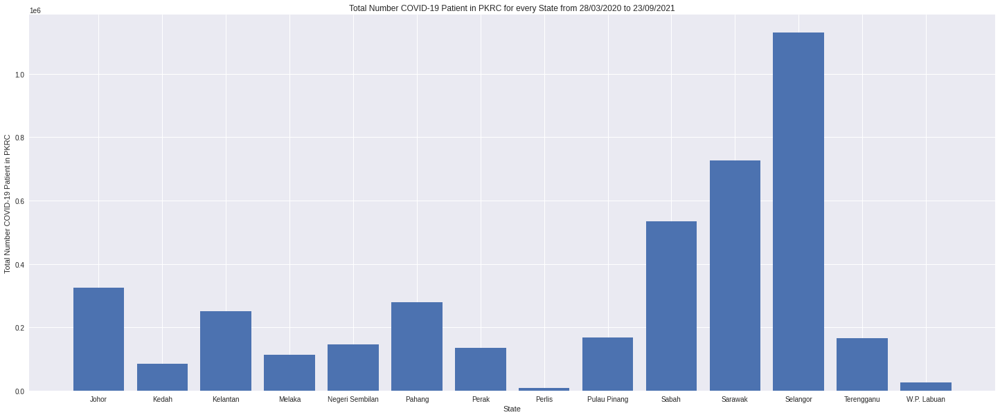

In [ ]:
plt.figure(figsize=(25,10))
plt.bar(state_pkrc['state'],state_pkrc['pkrc_covid'])
plt.xlabel('State')
plt.ylabel('Total Number COVID-19 Patient in PKRC')
plt.title('Total Number COVID-19 Patient in PKRC for every State from 28/03/2020 to 23/09/2021')
plt.show()



The bar chart above shows that Selangor recorded the highest number of COVID-19 Patients in the PKRC whereas Perlis recorded the lowest number of COVID-19 Patients in the PKRC from 28/03/2020 to 23/09/2021. This has proven that Selangor is the most severe state in Malaysia.

In [ ]:
#group by month and state
month_pkrc = pkrc.copy()
month_pkrc['date'] = pkrc.date.dt.to_period('m')
month_pkrc = month_pkrc.set_index('date')
month_pkrc = month_pkrc.groupby([pd.Grouper(freq='M'), 'state']).sum()
month_pkrc

beds  pkrc_admitted_pui  ...  pkrc_pui  pkrc_noncovid
date    state                                    ...                         
2020-03 Kelantan         588                  8  ...       174              0
        Perak            327                  0  ...         0              0
        Perlis           216                  2  ...        13              0
        Pulau Pinang     232                  0  ...         0              0
        Sarawak          296                  0  ...         0              0
...                      ...                ...  ...       ...            ...
2021-09 Sabah         116099                412  ...      3009              0
        Sarawak       224508                258  ...     14510              0
        Selangor       93936                 90  ...       378             19
        Terengganu     67875                690  ...      3654              0
        W.P. Labuan     6445                 60  ...       418              0

[225 rows x 10 columns]

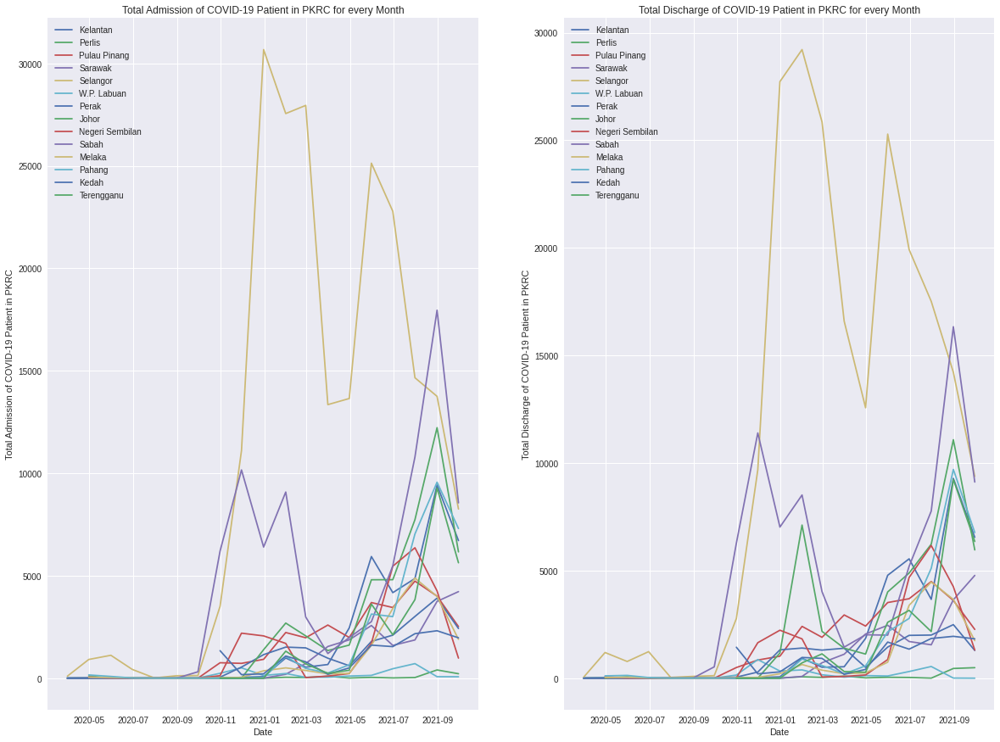

In [ ]:
plt.figure(figsize=(20,15))
for state in pd.unique(pkrc['state']):
    data = pkrc[pkrc['state'] == state].dropna()
    months_pkrc = data.groupby([pd.Grouper(key='date', axis=0, freq='M')]).agg('sum')
    plt.subplot(121),plt.plot(months_pkrc.index.values, months_pkrc['pkrc_admitted_covid'], label = state)
    plt.subplot(122),plt.plot(months_pkrc.index.values, months_pkrc['pkrc_discharged_covid'], label = state)

plt.subplot(121),plt.xlabel('Date')
plt.subplot(121),plt.ylabel('Total Admission of COVID-19 Patient in PKRC')
plt.subplot(121),plt.title('Total Admission of COVID-19 Patient in PKRC for every Month')
plt.subplot(121),plt.legend()
plt.subplot(122),plt.xlabel('Date')
plt.subplot(122),plt.ylabel('Total Discharge of COVID-19 Patient in PKRC')
plt.subplot(122),plt.title('Total Discharge of COVID-19 Patient in PKRC for every Month')
plt.subplot(122),plt.legend()

plt.show()

The line graph above has shown that Selangor recorded the highest number of admission and discharge of COVID-19 patients in the PKRC for every month. This has proven that Selangor is the most severe state in Malaysia. However, based on the graphs above, it can be seen that total discharges of COVID-19 patients in PKRC are almost the same as the total admission of COVID-19 patients in PKRC for every month. This can be proven that the recovery rate of COVID-19 patients who undergo quarantine at PKRC is high and death rate is low. <br />

Besides, it can be noticed that there are two peaks in both of the graphs. It can be deduced that the total number of COVID-19 cases for every month was low at the early stages and the COVID-19 cases increased significantly from December 2020 to March 2021. After that, the cases dropped significantly and a second wave started in June 2021.

In [ ]:
pkrc_admit_maxMonth = month_pkrc['pkrc_admitted_covid'].idxmax()
pkrc_discharged_maxMonth = month_pkrc['pkrc_discharged_covid'].idxmax()
print("The month with the most COVID-19 patient admission in PKRC(from 2020-2021) is '" + str(pkrc_admit_maxMonth[0]) + "'"' with the amount of ' + str(month_pkrc['pkrc_admitted_total'].max()) + " in " + pkrc_admit_maxMonth[1])
print("The month with the most COVID-19 patient discharge in PKRC(from 2020-2021) is '" + str(pkrc_discharged_maxMonth[0]) + "'"' with the amount of ' + str(month_pkrc['pkrc_discharged_total'].max()) + " in " + pkrc_discharged_maxMonth[1])

The month with the most COVID-19 patient admission in PKRC(from 2020-2021) is '2020-12' with the amount of 30692 in Selangor
The month with the most COVID-19 patient discharge in PKRC(from 2020-2021) is '2021-01' with the amount of 29429 in Selangor


In [ ]:
#feature selection
final_pkrc = pkrc.copy()
final_pkrc

,date,state,beds,pkrc_admitted_pui,pkrc_admitted_covid,pkrc_admitted_total,pkrc_discharged_pui,pkrc_discharged_covid,pkrc_discharged_total,pkrc_covid,pkrc_pui,pkrc_noncovid
0,2020-03-28,Kelantan,147,0,0,0,0,0,0,0,53,0
1,2020-03-28,Perlis,54,0,0,0,0,0,0,8,3,0
2,2020-03-28,Pulau Pinang,58,0,0,0,0,0,0,13,0,0
3,2020-03-28,Sarawak,74,0,0,0,0,0,0,22,0,0
4,2020-03-28,Selangor,1452,0,12,12,0,5,5,145,0,8
...,...,...,...,...,...,...,...,...,...,...,...,...
6346,2021-09-23,Sabah,4571,13,304,317,10,414,424,2290,109,0
6347,2021-09-23,Sarawak,9077,76,142,218,2,516,518,4460,488,0
6348,2021-09-23,Selangor,3992,4,345,349,3,279,282,2074,15,0
6349,2021-09-23,Terengganu,2912,12,194,206,84,244,328,1133,61,0


### 1.4.2 Hospital


In [ ]:
#read hospital.csv
hospital = pd.read_csv(path + 'hospital.csv')

#change to datetime format
hospital['date']= pd.to_datetime(hospital['date'])

##check for duplicates
#no duplicate row
print("Total duplicated rows:",sum(hospital.duplicated()))

##deal with missing data
#no missing data
print("Number of null values:\n",hospital.isnull().sum().sort_values(ascending = False))

hospital

Total duplicated rows: 0
Number of null values:
 hosp_noncovid       0
hosp_pui            0
hosp_covid          0
discharged_total    0
discharged_covid    0
discharged_pui      0
admitted_total      0
admitted_covid      0
admitted_pui        0
beds_noncrit        0
beds_covid          0
beds                0
state               0
date                0
dtype: int64


,date,state,beds,beds_covid,beds_noncrit,admitted_pui,admitted_covid,admitted_total,discharged_pui,discharged_covid,discharged_total,hosp_covid,hosp_pui,hosp_noncovid
0,2020-03-24,Johor,1440,434,1408,0,0,0,0,0,0,18,9,1
1,2020-03-24,Kedah,1218,143,1183,0,0,0,0,0,0,46,5,12
2,2020-03-24,Kelantan,1463,280,1424,9,6,15,1,0,1,78,58,23
3,2020-03-24,Melaka,1091,82,1065,0,0,0,0,0,0,19,10,12
4,2020-03-24,Negeri Sembilan,1223,253,1205,0,0,0,0,0,0,90,13,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8366,2021-09-23,Selangor,6302,2774,5952,116,175,291,83,239,322,1295,338,2053
8367,2021-09-23,Terengganu,1557,491,1493,22,42,64,3,51,54,299,53,876
8368,2021-09-23,W.P. Kuala Lumpur,4753,847,4578,2,49,51,13,37,50,394,34,1582
8369,2021-09-23,W.P. Labuan,122,106,99,0,1,1,0,0,0,3,2,66


In [ ]:
#rename columns to avoid confusion 
hospital.rename(columns=
{
"admitted_pui": "hosp_admitted_pui",
"admitted_covid": "hosp_admitted_covid",
"admitted_total": "hosp_admitted_total",
"discharged_pui": "hosp_discharged_pui",
"discharged_covid": "hosp_discharged_covid",
"discharged_total": "hosp_discharged_total"
}, inplace=True)

hospital

,date,state,beds,beds_covid,beds_noncrit,hosp_admitted_pui,hosp_admitted_covid,hosp_admitted_total,hosp_discharged_pui,hosp_discharged_covid,hosp_discharged_total,hosp_covid,hosp_pui,hosp_noncovid
0,2020-03-24,Johor,1440,434,1408,0,0,0,0,0,0,18,9,1
1,2020-03-24,Kedah,1218,143,1183,0,0,0,0,0,0,46,5,12
2,2020-03-24,Kelantan,1463,280,1424,9,6,15,1,0,1,78,58,23
3,2020-03-24,Melaka,1091,82,1065,0,0,0,0,0,0,19,10,12
4,2020-03-24,Negeri Sembilan,1223,253,1205,0,0,0,0,0,0,90,13,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8366,2021-09-23,Selangor,6302,2774,5952,116,175,291,83,239,322,1295,338,2053
8367,2021-09-23,Terengganu,1557,491,1493,22,42,64,3,51,54,299,53,876
8368,2021-09-23,W.P. Kuala Lumpur,4753,847,4578,2,49,51,13,37,50,394,34,1582
8369,2021-09-23,W.P. Labuan,122,106,99,0,1,1,0,0,0,3,2,66


The hospital.csv tells us about the information of hospitals in every state in Malaysia. There is no duplicated and NaN value in this dataset. After that, we decided to rename some columns because they may clash with the names from other datasets.

Outliers Detection for hospital.csv

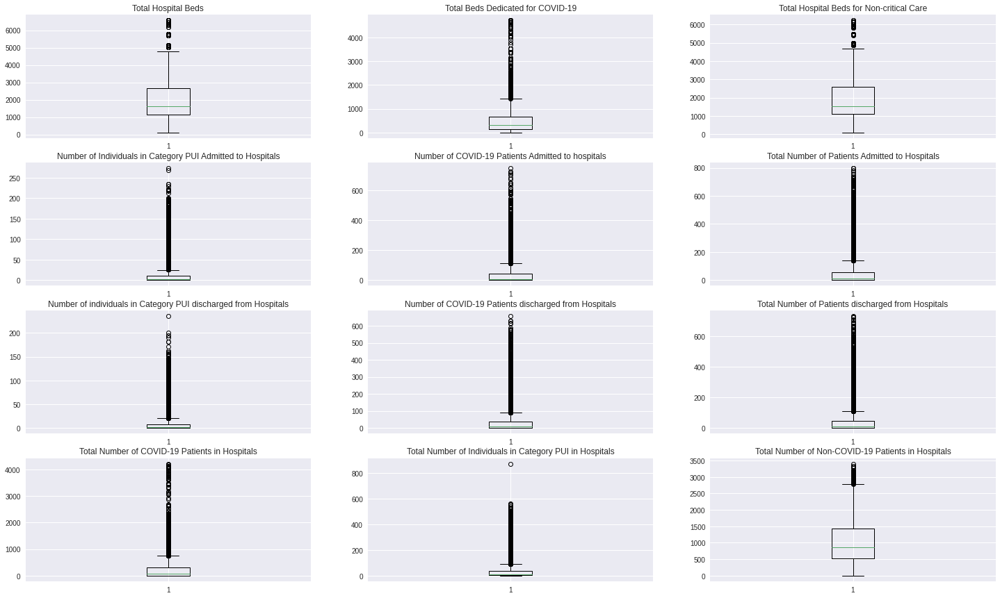

In [ ]:
#Outlier Detection
hospital_boxplot = hospital.drop(columns=['date','state'])
plt.figure(figsize=(25,15))
plt.subplot(431),plt.boxplot(hospital_boxplot.beds),plt.title('Total Hospital Beds')
plt.subplot(432),plt.boxplot(hospital_boxplot.beds_covid),plt.title('Total Beds Dedicated for COVID-19')
plt.subplot(433),plt.boxplot(hospital_boxplot.beds_noncrit),plt.title('Total Hospital Beds for Non-critical Care')
plt.subplot(434),plt.boxplot(hospital_boxplot.hosp_admitted_pui),plt.title('Number of Individuals in Category PUI Admitted to Hospitals')
plt.subplot(435),plt.boxplot(hospital_boxplot.hosp_admitted_covid),plt.title('Number of COVID-19 Patients Admitted to hospitals')
plt.subplot(436),plt.boxplot(hospital_boxplot.hosp_admitted_total),plt.title('Total Number of Patients Admitted to Hospitals')
plt.subplot(437),plt.boxplot(hospital_boxplot.hosp_discharged_pui),plt.title('Number of individuals in Category PUI discharged from Hospitals')
plt.subplot(438),plt.boxplot(hospital_boxplot.hosp_discharged_covid),plt.title('Number of COVID-19 Patients discharged from Hospitals')
plt.subplot(439),plt.boxplot(hospital_boxplot.hosp_discharged_total),plt.title('Total Number of Patients discharged from Hospitals')
plt.subplot(4,3,10),plt.boxplot(hospital_boxplot.hosp_covid),plt.title('Total Number of COVID-19 Patients in Hospitals')
plt.subplot(4,3,11),plt.boxplot(hospital_boxplot.hosp_pui),plt.title('Total Number of Individuals in Category PUI in Hospitals')
plt.subplot(4,3,12),plt.boxplot(hospital_boxplot.hosp_noncovid),plt.title('Total Number of Non-COVID-19 Patients in Hospitals')
plt.show()

Based on the boxplots above, we can see that every column in the 'hospital.csv' dataset contains a lot of outliers. All of the boxplots showed that the data is positively skewed. This may be due to the slow start of the COVID-19 pandemic which contains a low number of COVID-19 cases, followed by a sudden increase of high number COVID-19 cases that caused a high number of patients admitted to the hospital. However, we decided to not remove these outliers as the data are crucial to this assignment and training model.

In [ ]:
#group by state
state_hos = hospital.groupby(['state']).sum()
state_hos.reset_index(inplace = True)
state_hos

,state,beds,beds_covid,beds_noncrit,hosp_admitted_pui,hosp_admitted_covid,hosp_admitted_total,hosp_discharged_pui,hosp_discharged_covid,hosp_discharged_total,hosp_covid,hosp_pui,hosp_noncovid
0,Johor,2020838,480957,1963258,28802,42734,71536,20176,31904,52080,289173,54096,632231
1,Kedah,946676,208726,912587,1885,15930,17815,501,11852,12353,125545,4036,566848
2,Kelantan,1109663,209851,1053765,2495,18444,20939,2168,15796,17964,106882,6333,608168
3,Melaka,616924,105520,579487,2137,8331,10468,1737,7173,8910,69336,6430,398606
4,Negeri Sembilan,738899,338978,716342,1608,22615,24223,1364,16985,18349,146054,3051,358650
5,Pahang,1051317,252267,1018349,2382,9472,11854,2175,8529,10704,71380,8826,517312
6,Perak,1486170,215497,1443366,1395,14029,15424,838,10202,11040,88023,6441,881573
7,Perlis,274174,26312,266285,2182,1210,3392,761,658,1419,8621,5632,156176
8,Pulau Pinang,714903,111499,688669,364,12110,12474,179,9775,9954,78124,751,407520
9,Sabah,1586412,470641,1518734,8806,29176,37982,7341,17864,25205,201071,39199,748340


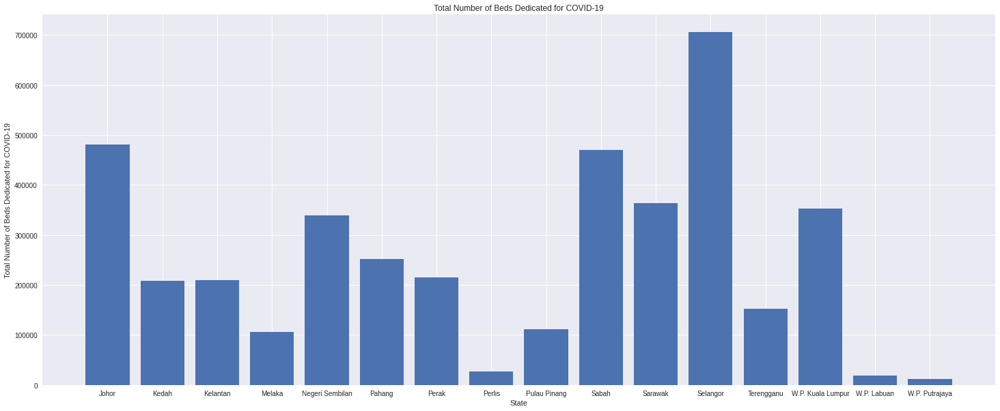

In [ ]:
plt.figure(figsize=(25,10))
plt.bar(state_hos['state'],state_hos['beds_covid'])
plt.xlabel('State')
plt.ylabel('Total Number of Beds Dedicated for COVID-19')
plt.title('Total Number of Beds Dedicated for COVID-19')
plt.show()

Based on the bar chart above, it can be seen that Selangor recorded the highest number of beds dedicated to COVID-19. One of the important insights that can be obtained from this chart is that a high demand of beds for COVID-19 are needed for COVID-19 patients which inferred that Selangor is the most severe state with the highest number of COVID-19 cases.

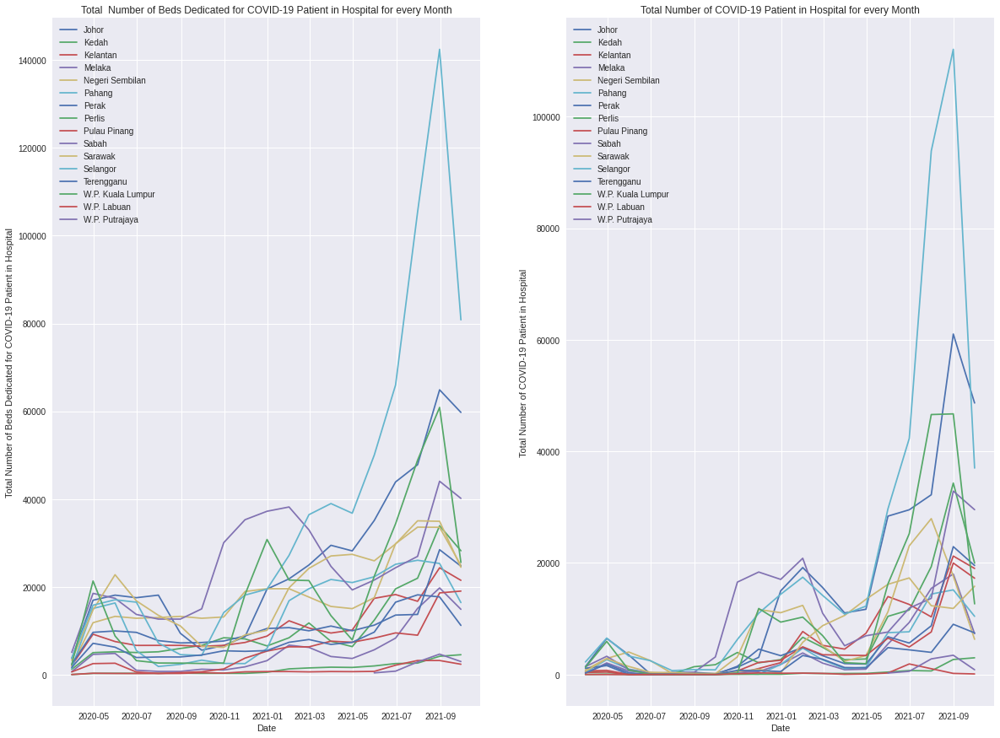

In [ ]:
plt.figure(figsize=(20,15))
for state in pd.unique(hospital['state']):
    data = hospital[hospital['state'] == state].dropna()
    months_hospital = data.groupby([pd.Grouper(key='date', axis=0, freq='M')]).agg('sum')
    plt.subplot(121),plt.plot(months_hospital.index.values, months_hospital['beds_covid'], label = state)
    plt.subplot(122),plt.plot(months_hospital.index.values, months_hospital['hosp_covid'], label = state)

plt.subplot(121),plt.xlabel('Date')
plt.subplot(121),plt.ylabel('Total Number of Beds Dedicated for COVID-19 Patient in Hospital')
plt.subplot(121),plt.title('Total  Number of Beds Dedicated for COVID-19 Patient in Hospital for every Month')
plt.subplot(121),plt.legend()
plt.subplot(122),plt.xlabel('Date')
plt.subplot(122),plt.ylabel('Total Number of COVID-19 Patient in Hospital')
plt.subplot(122),plt.title('Total Number of COVID-19 Patient in Hospital for every Month')
plt.subplot(122),plt.legend()
plt.show()

Based on the line graphs above, the graph on the left showed that Selangor recorded the highest number of beds dedicated to COVID-19 in the hospital whereas the graph on the right showed that Selangor recorded the highest number of COVID-19 patients in the hospital  for every month. The total number of COVID-19 patients for every month was low at the early stages but the total number of COVID-19 patients rocketed rapidly starting from May 2021 to September 2021,especially Selangor. <br /> <br />
One of the important insights that can be obtained from this chart is that beds in the hospital are still sufficient for the COVID-19 patients, even though the number of COVID-19 cases are getting higher as the total number of beds dedicated for COVID-19 is always higher than the total number of patients for every month. 


In [ ]:
#group by month and state
month_hospital = hospital.copy()
month_hospital['date'] = hospital.date.dt.to_period('m')
month_hospital = month_hospital.set_index('date')
month_hospital = month_hospital.groupby([pd.Grouper(freq='M'), 'state']).sum()
month_hospital

beds  beds_covid  ...  hosp_pui  hosp_noncovid
date    state                                  ...                         
2020-03 Johor               11520        3756  ...       437            733
        Kedah                9744        1298  ...        71           3654
        Kelantan            12430        2130  ...       446           4012
        Melaka               8728         747  ...        74           3202
        Negeri Sembilan      9784        2087  ...        41           2903
...                           ...         ...  ...       ...            ...
2021-09 Selangor           144946       80824  ...      8765          42458
        Terengganu          35811       11279  ...      1084          20158
        W.P. Kuala Lumpur  109319       25617  ...      1918          33139
        W.P. Labuan          2806        2438  ...        61           1775
        W.P. Putrajaya      14007        3052  ...      1018           6160

[290 rows x 12 columns]

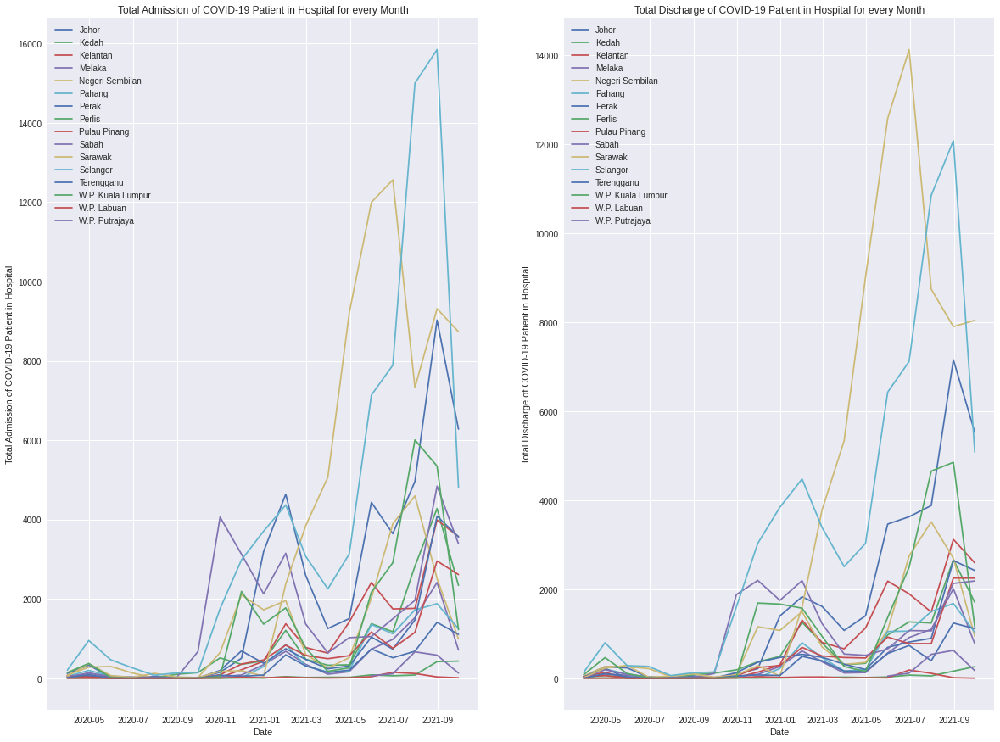

In [ ]:
plt.figure(figsize=(20,15))
for state in pd.unique(hospital['state']):
    data = hospital[hospital['state'] == state].dropna()
    months_hospital = data.groupby([pd.Grouper(key='date', axis=0, freq='M')]).agg('sum')
    plt.subplot(121),plt.plot(months_hospital.index.values, months_hospital['hosp_admitted_covid'], label = state)
    plt.subplot(122),plt.plot(months_hospital.index.values, months_hospital['hosp_discharged_covid'], label = state)

plt.subplot(121),plt.xlabel('Date')
plt.subplot(121),plt.ylabel('Total Admission of COVID-19 Patient in Hospital')
plt.subplot(121),plt.title('Total Admission of COVID-19 Patient in Hospital for every Month')
plt.subplot(121),plt.legend()
plt.subplot(122),plt.xlabel('Date')
plt.subplot(122),plt.ylabel('Total Discharge of COVID-19 Patient in Hospital')
plt.subplot(122),plt.title('Total Discharge of COVID-19 Patient in Hospital for every Month')
plt.subplot(122),plt.legend()

plt.show()

Based on both of the graphs, the line graph above has shown that Selangor recorded the most number of admission of COVID-19 patients in the hospital for most of the months while Sarawak has recorded the most number of discharges of COVID-19 patients in the hospital for most of the month. However, based on the graphs above, it can be seen that total discharges of COVID-19 patients in hospital are almost the same as the total admission of COVID-19 patients in hospital for every month. This can be proven that the recovery rate of COVID-19 patients who undergo treatment in the hospital is high and death rate is low. <br /> <br />
Besides, it can be noticed that the total number of admission and discharge of COVID-19 patients in the hospital is slowly increasing. It can be deduced that the total number of COVID-19 cases for every month was low at the early stages and the COVID-19 cases had a slight increase in January 2021. Then, a second wave started in June 2021.


In [ ]:
hos_bed_maxMonth = month_hospital['beds_covid'].idxmax()
hos_admit_maxMonth = month_hospital['hosp_covid'].idxmax()

In [ ]:
print("The month with the most number of COVID-19 patient(from 2020-2021) is '" + str(hos_admit_maxMonth[0]) + "'"' with the amount of ' + str(month_hospital['hosp_covid'].max()) + " in " + hos_admit_maxMonth[1])
print("The month with the most number of beds dedicated for COVID-19 in Hospital(from 2020-2021) is '" + str(hos_bed_maxMonth[0]) + "'"' with the amount of ' + str(month_hospital['beds_covid'].max()) + " in " + hos_bed_maxMonth[1])


The month with the most number of COVID-19 patient(from 2020-2021) is '2021-08' with the amount of 112062 in Selangor
The month with the most number of beds dedicated for COVID-19 in Hospital(from 2020-2021) is '2021-08' with the amount of 142398 in Selangor


In [ ]:
#feature selection
final_hospital = hospital.copy()
final_hospital

,date,state,beds,beds_covid,beds_noncrit,hosp_admitted_pui,hosp_admitted_covid,hosp_admitted_total,hosp_discharged_pui,hosp_discharged_covid,hosp_discharged_total,hosp_covid,hosp_pui,hosp_noncovid
0,2020-03-24,Johor,1440,434,1408,0,0,0,0,0,0,18,9,1
1,2020-03-24,Kedah,1218,143,1183,0,0,0,0,0,0,46,5,12
2,2020-03-24,Kelantan,1463,280,1424,9,6,15,1,0,1,78,58,23
3,2020-03-24,Melaka,1091,82,1065,0,0,0,0,0,0,19,10,12
4,2020-03-24,Negeri Sembilan,1223,253,1205,0,0,0,0,0,0,90,13,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8366,2021-09-23,Selangor,6302,2774,5952,116,175,291,83,239,322,1295,338,2053
8367,2021-09-23,Terengganu,1557,491,1493,22,42,64,3,51,54,299,53,876
8368,2021-09-23,W.P. Kuala Lumpur,4753,847,4578,2,49,51,13,37,50,394,34,1582
8369,2021-09-23,W.P. Labuan,122,106,99,0,1,1,0,0,0,3,2,66


### 1.4.3 ICU


In [ ]:
#read icu.csv
icu = pd.read_csv(path + 'icu.csv')

#change to datetime format
icu['date']= pd.to_datetime(icu['date'])

##check for duplicates
#no duplicate row
print("Total duplicated rows:",sum(icu.duplicated()))

##deal with missing data
#no missing data
print("Number of null values:\n",icu.isnull().sum().sort_values(ascending = False))

icu

Total duplicated rows: 0
Number of null values:
 vent_port_used    0
vent_used         0
vent_noncovid     0
vent_pui          0
vent_covid        0
icu_noncovid      0
icu_pui           0
icu_covid         0
vent_port         0
vent              0
beds_icu_covid    0
beds_icu_total    0
beds_icu_rep      0
beds_icu          0
state             0
date              0
dtype: int64


,date,state,beds_icu,beds_icu_rep,beds_icu_total,beds_icu_covid,vent,vent_port,icu_covid,icu_pui,icu_noncovid,vent_covid,vent_pui,vent_noncovid,vent_used,vent_port_used
0,2020-03-24,Johor,10,22,32,10,11,2,0,0,1,0,0,0,8,0
1,2020-03-24,Kedah,35,0,35,16,34,0,2,1,12,1,1,0,19,0
2,2020-03-24,Kelantan,39,0,39,20,42,4,1,0,20,1,0,0,26,0
3,2020-03-24,Melaka,26,0,26,12,23,4,0,2,12,0,1,0,13,5
4,2020-03-24,Negeri Sembilan,18,0,18,10,14,9,0,0,8,0,0,0,1,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8386,2021-09-23,Selangor,187,163,350,237,487,61,172,33,70,100,2,36,184,17
8387,2021-09-23,Terengganu,27,37,64,38,66,40,28,0,16,24,0,15,44,11
8388,2021-09-23,W.P. Kuala Lumpur,104,71,175,90,277,36,77,0,55,48,0,14,116,0
8389,2021-09-23,W.P. Labuan,5,18,23,18,11,12,3,0,3,1,0,1,2,0


The icu.csv tells us about the information of the Intensive Care Unit (ICU) in hospitals of every state in Malaysia. There is no duplicated and NaN value in this dataset. 

Outliers Detection for icu.csv

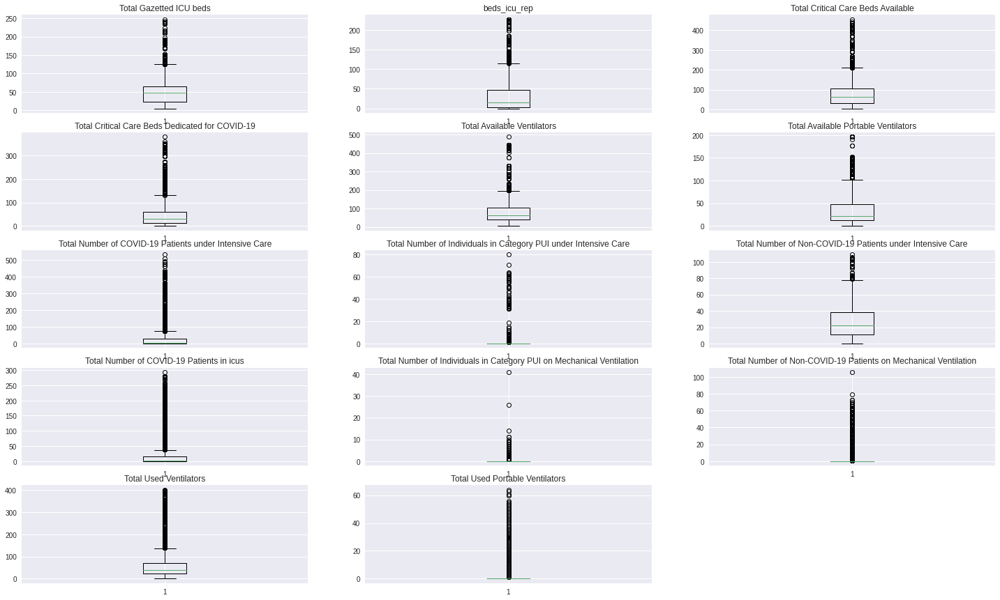

In [ ]:
#Outlier Detection
icu_boxplot = icu.drop(columns=['date','state'])
plt.figure(figsize=(25,15))
plt.subplot(531),plt.boxplot(icu_boxplot.beds_icu),plt.title('Total Gazetted ICU beds')
plt.subplot(532),plt.boxplot(icu_boxplot.beds_icu_rep),plt.title('beds_icu_rep')
plt.subplot(533),plt.boxplot(icu_boxplot.beds_icu_total),plt.title('Total Critical Care Beds Available')
plt.subplot(534),plt.boxplot(icu_boxplot.beds_icu_covid),plt.title('Total Critical Care Beds Dedicated for COVID-19')
plt.subplot(535),plt.boxplot(icu_boxplot.vent),plt.title('Total Available Ventilators')
plt.subplot(536),plt.boxplot(icu_boxplot.vent_port),plt.title('Total Available Portable Ventilators')
plt.subplot(537),plt.boxplot(icu_boxplot.icu_covid),plt.title('Total Number of COVID-19 Patients under Intensive Care')
plt.subplot(538),plt.boxplot(icu_boxplot.icu_pui),plt.title('Total Number of Individuals in Category PUI under Intensive Care')
plt.subplot(539),plt.boxplot(icu_boxplot.icu_noncovid),plt.title('Total Number of Non-COVID-19 Patients under Intensive Care')
plt.subplot(5,3,10),plt.boxplot(icu_boxplot.vent_covid),plt.title('Total Number of COVID-19 Patients in icus')
plt.subplot(5,3,11),plt.boxplot(icu_boxplot.vent_pui),plt.title('Total Number of Individuals in Category PUI on Mechanical Ventilation')
plt.subplot(5,3,12),plt.boxplot(icu_boxplot.vent_noncovid),plt.title('Total Number of Non-COVID-19 Patients on Mechanical Ventilation')
plt.subplot(5,3,13),plt.boxplot(icu_boxplot.vent_used),plt.title('Total Used Ventilators')
plt.subplot(5,3,14),plt.boxplot(icu_boxplot.vent_port_used),plt.title('Total Used Portable Ventilators')
plt.show()

Based on the boxplots above, we can see that every column in the 'icu.csv' dataset contains a lot of outliers. All of the boxplots showed that the data is positively skewed. This may be due to the slow start of the COVID-19 pandemic which contains a low number of COVID-19 cases, followed by a sudden increase of high number COVID-19 cases that caused a high number of patients admitted to the ICU. However, we decided to not remove these outliers as the data are crucial to this assignment and training model.

In [ ]:
#group by state
state_icu = icu.groupby(['state']).sum()
state_icu.reset_index(inplace = True)
state_icu

,state,beds_icu,beds_icu_rep,beds_icu_total,beds_icu_covid,vent,vent_port,icu_covid,icu_pui,icu_noncovid,vent_covid,vent_pui,vent_noncovid,vent_used,vent_port_used
0,Johor,34574,23006,57580,32298,59491,38470,21457,143,17031,15135,130,2271,44917,1278
1,Kedah,25468,8621,34089,20217,40767,19664,15226,178,11716,6790,140,2726,35666,449
2,Kelantan,36263,19635,55898,20151,47977,16326,9036,79,25643,4534,65,1801,34650,329
3,Melaka,21810,15627,37437,16430,30596,4040,11188,270,19039,3460,240,1454,18543,8
4,Negeri Sembilan,12899,9658,22557,13803,29961,12243,9371,111,6356,5947,106,1549,18059,970
5,Pahang,25599,6557,32156,23347,32973,12098,5848,149,14576,3387,67,1585,22115,453
6,Perak,37303,5501,42804,28038,56178,29444,11650,75,22809,6926,74,1193,48110,770
7,Perlis,6739,1150,7889,3100,10228,6014,890,22,4062,426,16,394,7203,111
8,Pulau Pinang,15273,10961,26234,12006,20406,13656,9215,23,9151,5717,13,2045,17490,1668
9,Sabah,41231,26439,67670,51228,56649,35198,25921,733,13336,9085,732,1335,35691,618


icu_covid, vent_covid, beds_icu_total, beds_icu_covid

In [ ]:
#group by month and state
month_icu = icu.copy()
month_icu['date'] = icu.date.dt.to_period('m')
month_icu = month_icu.set_index('date')
month_icu = month_icu.groupby([pd.Grouper(freq='M'), 'state']).sum()
month_icu

beds_icu  beds_icu_rep  ...  vent_used  vent_port_used
date    state                                      ...                           
2020-03 Johor                   188           208  ...        151               0
        Kedah                   280             0  ...        164               0
        Kelantan                347             0  ...        274               0
        Melaka                  208             0  ...        118               6
        Negeri Sembilan         144             0  ...         29              13
...                             ...           ...  ...        ...             ...
2021-09 Selangor               4426          4407  ...       4814             501
        Terengganu              661           843  ...        985             321
        W.P. Kuala Lumpur      2808          1947  ...       3003               0
        W.P. Labuan             115           414  ...         64               0
        W.P. Putrajaya          322           198  ...        320               0

[294 rows x 14 columns]

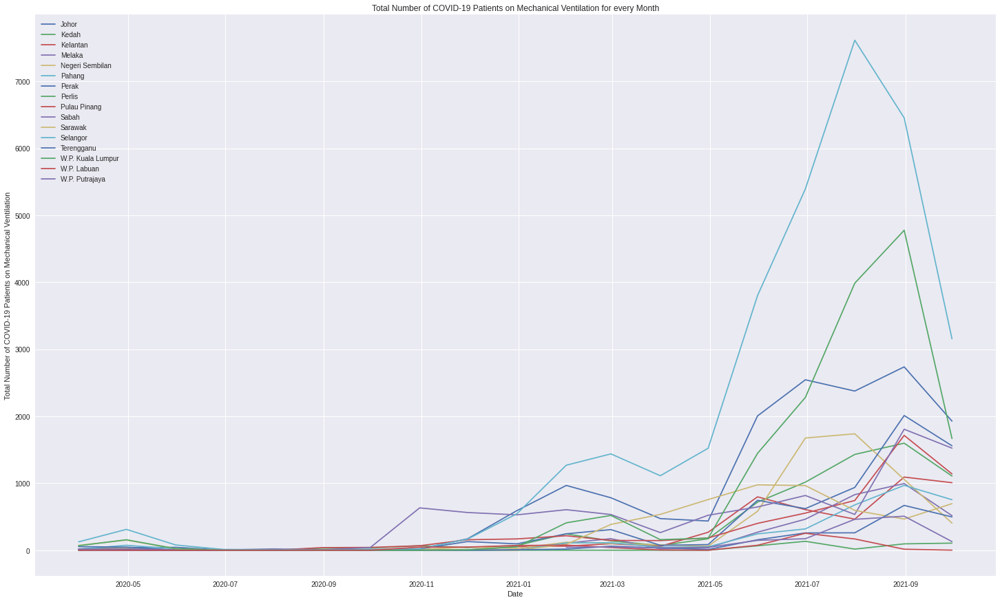

In [ ]:
plt.figure(figsize=(25,15))
for state in pd.unique(icu['state']):
    data = icu[icu['state'] == state].dropna()
    months_icu = data.groupby([pd.Grouper(key='date', axis=0, freq='M')]).agg('sum')
    plt.plot(months_icu.index.values, months_icu['vent_covid'], label = state)

plt.xlabel('Date')
plt.ylabel('Total Number of COVID-19 Patients on Mechanical Ventilation')
plt.title('Total Number of COVID-19 Patients on Mechanical Ventilation for every Month')
plt.legend()
plt.show()

Based on the graph, Selangor has showed the highest total number of COVID-19 Patients on Mechanical Ventilation for every month. This has indicated that there are a lot of people suffering from severe COVID-19 diseases in Selangor which needed mechanical ventilation to survive. 

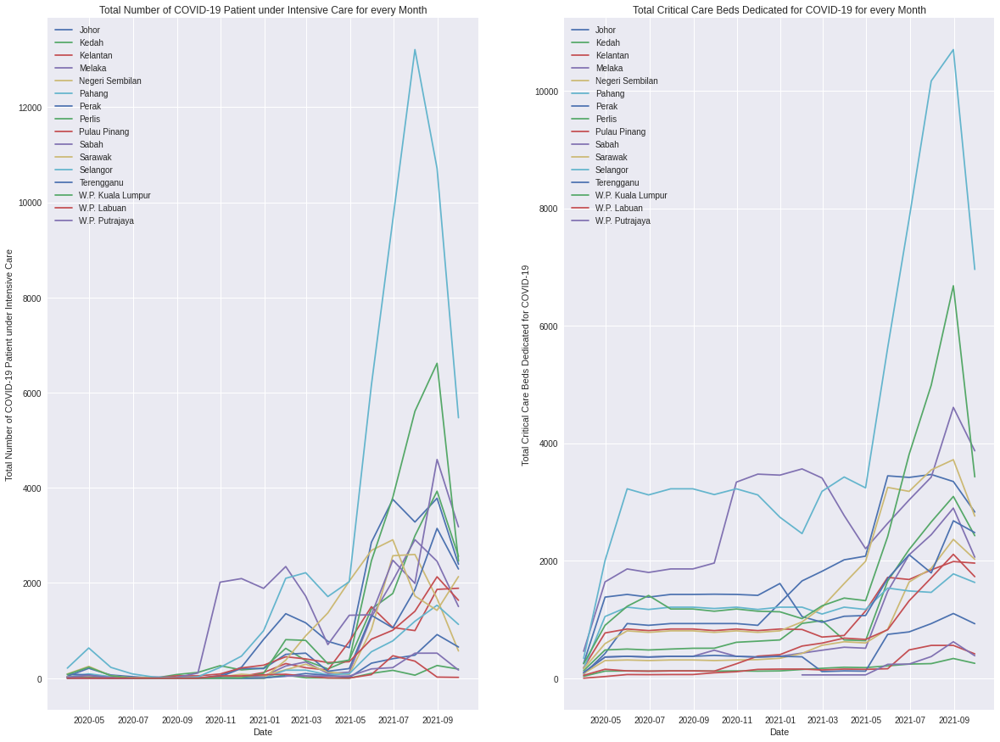

In [ ]:
plt.figure(figsize=(20,15))
for state in pd.unique(icu['state']):
    data = icu[icu['state'] == state].dropna()
    months_icu = data.groupby([pd.Grouper(key='date', axis=0, freq='M')]).agg('sum')
    plt.subplot(121), plt.plot(months_icu.index.values, months_icu['icu_covid'], label = state)
    plt.subplot(122), plt.plot(months_icu.index.values, months_icu['beds_icu_covid'], label = state)

plt.subplot(121),plt.xlabel('Date')
plt.subplot(121),plt.ylabel('Total Number of COVID-19 Patient under Intensive Care')
plt.subplot(121),plt.title('Total Number of COVID-19 Patient under Intensive Care for every Month')
plt.subplot(121),plt.legend()
plt.subplot(122),plt.xlabel('Date')
plt.subplot(122),plt.ylabel('Total Critical Care Beds Dedicated for COVID-19')
plt.subplot(122),plt.title('Total Critical Care Beds Dedicated for COVID-19 for every Month')
plt.subplot(122),plt.legend()

plt.show()

Based on the line graphs above,  the graph on the top showed that Selangor recorded the highest number of COVID-19 patients under iIntensive care for every month while the graph on the bottom showed that Selangor recorded the highest total number of critical care beds dedicated for COVID-19 in the ICU. The total number of COVID-19 patients under intensive care for every month was low at the early stages but the total number of COVID-19 patients rocketed rapidly starting from May(2021) to around September(2021),especially Selangor.
<br/> <br/>
One of the important insights that can be obtained from this chart is that the total critical care beds in the icu are still sufficient for the COVID-19 patients, even though the number of COVID-19 cases are getting higher as the total number of critical care beds dedicated for COVID-19 is always higher than the total number of patients for every month. 


In [ ]:
icu_covid_maxMonth = month_icu['icu_covid'].idxmax()
print("The month with the most number of COVID-19 patient in ICU(from 2020-2021) is '" + str(icu_covid_maxMonth[0]) + "'"' with the amount of ' + str(month_icu['icu_covid'].max()) + " in " + icu_covid_maxMonth[1])

The month with the most number of COVID-19 patient in ICU(from 2020-2021) is '2021-07' with the amount of 13209 in Selangor


In [ ]:
#feature selection
final_icu = icu.copy()
final_icu

,date,state,beds_icu,beds_icu_rep,beds_icu_total,beds_icu_covid,vent,vent_port,icu_covid,icu_pui,icu_noncovid,vent_covid,vent_pui,vent_noncovid,vent_used,vent_port_used
0,2020-03-24,Johor,10,22,32,10,11,2,0,0,1,0,0,0,8,0
1,2020-03-24,Kedah,35,0,35,16,34,0,2,1,12,1,1,0,19,0
2,2020-03-24,Kelantan,39,0,39,20,42,4,1,0,20,1,0,0,26,0
3,2020-03-24,Melaka,26,0,26,12,23,4,0,2,12,0,1,0,13,5
4,2020-03-24,Negeri Sembilan,18,0,18,10,14,9,0,0,8,0,0,0,1,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8386,2021-09-23,Selangor,187,163,350,237,487,61,172,33,70,100,2,36,184,17
8387,2021-09-23,Terengganu,27,37,64,38,66,40,28,0,16,24,0,15,44,11
8388,2021-09-23,W.P. Kuala Lumpur,104,71,175,90,277,36,77,0,55,48,0,14,116,0
8389,2021-09-23,W.P. Labuan,5,18,23,18,11,12,3,0,3,1,0,1,2,0


## 1.5 Merged Dataframe


In [ ]:
cases_test_death_merged = df.merge(final_death, on=['date','state'], how='inner')
merged_pkrc = cases_test_death_merged.merge(final_pkrc, on=['date','state'], how='inner')
merged_hospital_icu = merged_pkrc.merge(final_hospital, on=['date','state'], how='inner')
final_merged = merged_hospital_icu.merge(final_icu, on=['date','state'], how='inner')
final_merged

,date,state,cases_import,cases_new,cases_recovered,rtk-ag,pcr,total_tests,positivity_rate,deaths_new,deaths_new_dod,deaths_bid,deaths_bid_dod,beds_x,pkrc_admitted_pui,pkrc_admitted_covid,pkrc_admitted_total,pkrc_discharged_pui,pkrc_discharged_covid,pkrc_discharged_total,pkrc_covid,pkrc_pui,pkrc_noncovid,beds_y,beds_covid,beds_noncrit,hosp_admitted_pui,hosp_admitted_covid,hosp_admitted_total,hosp_discharged_pui,hosp_discharged_covid,hosp_discharged_total,hosp_covid,hosp_pui,hosp_noncovid,beds_icu,beds_icu_rep,beds_icu_total,beds_icu_covid,vent,vent_port,icu_covid,icu_pui,icu_noncovid,vent_covid,vent_pui,vent_noncovid,vent_used,vent_port_used
0,2021-07-01,Johor,1,270,361,2749.0,3670.0,6419.0,0.042063,6,8,0,2,2321,0,103,103,0,152,152,964,0,0,5090,1535,4903,178,131,309,130,117,247,732,233,3051,120,67,187,113,145,106,106,1,43,68,1,0,148,0
1,2021-07-01,Kedah,0,250,186,2073.0,1297.0,3370.0,0.074184,0,4,0,0,540,0,71,71,0,55,55,348,0,0,2755,661,2639,1,70,71,0,32,32,338,2,1650,61,55,116,73,105,48,65,0,13,43,0,0,125,0
2,2021-07-01,Kelantan,0,108,208,1348.0,1966.0,3314.0,0.032589,0,2,0,1,2763,11,96,107,9,133,142,638,73,0,2737,559,2593,13,59,72,14,49,63,297,18,1439,97,47,144,56,111,41,26,0,67,12,0,0,85,0
3,2021-07-01,Melaka,0,311,317,1049.0,2132.0,3181.0,0.097768,4,2,0,1,1662,0,181,181,0,95,95,886,0,0,1101,290,987,18,56,74,10,40,50,397,23,579,40,74,114,70,59,7,99,0,18,18,0,0,31,0
4,2021-07-01,Negeri Sembilan,0,692,883,2151.0,3306.0,5457.0,0.126810,6,13,0,2,2395,0,191,191,0,98,98,1248,0,0,1431,1084,1366,6,147,153,4,96,100,861,12,456,26,39,65,51,49,20,91,0,12,64,0,0,84,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1155,2021-09-21,Sabah,0,1291,1837,5069.0,1679.0,6748.0,0.191316,14,6,6,0,4571,17,290,307,6,307,313,2453,116,0,4109,1702,3880,29,107,136,35,101,136,1066,121,1584,60,169,229,194,153,57,130,0,9,60,0,5,88,6
1156,2021-09-21,Sarawak,0,3732,3366,5911.0,4983.0,10894.0,0.342574,10,4,2,0,9207,4,186,190,3,221,224,4831,322,0,4055,1110,3844,72,335,407,92,617,709,816,129,1876,59,143,202,120,137,83,113,0,50,40,0,36,94,18
1157,2021-09-21,Selangor,8,1934,2463,30167.0,12133.0,42300.0,0.045721,187,8,55,0,3992,3,220,223,2,310,312,2037,12,0,6302,2800,5952,106,169,275,152,170,322,1104,308,2211,187,163,350,255,435,177,183,34,59,104,3,35,185,18
1158,2021-09-21,Terengganu,0,592,218,2306.0,3495.0,5801.0,0.102051,6,0,0,0,3008,27,141,168,21,230,251,1256,138,0,1557,491,1493,17,42,59,6,50,56,300,49,914,27,37,64,38,58,42,30,0,16,23,0,15,44,17


Before continuing to the next section, we decided to merge all the dataframe we cleaned and explored into one dataframe called final_merged. The time frame of this dataframe is from 1/7/2021 to 21/9/2021. We choose this time frame is due to the cases and testing dataset only contains data from this time frame.

In [ ]:
#Export csv
final_merged.to_csv(path +'final_merged.csv', index = False, header=True)

In [ ]:
#check for correlation
final_merged.corr()

,cases_import,cases_new,cases_recovered,rtk-ag,pcr,total_tests,positivity_rate,deaths_new,deaths_new_dod,deaths_bid,deaths_bid_dod,beds_x,pkrc_admitted_pui,pkrc_admitted_covid,pkrc_admitted_total,pkrc_discharged_pui,pkrc_discharged_covid,pkrc_discharged_total,pkrc_covid,pkrc_pui,pkrc_noncovid,beds_y,beds_covid,beds_noncrit,hosp_admitted_pui,hosp_admitted_covid,hosp_admitted_total,hosp_discharged_pui,hosp_discharged_covid,hosp_discharged_total,hosp_covid,hosp_pui,hosp_noncovid,beds_icu,beds_icu_rep,beds_icu_total,beds_icu_covid,vent,vent_port,icu_covid,icu_pui,icu_noncovid,vent_covid,vent_pui,vent_noncovid,vent_used,vent_port_used
cases_import,1.000000,0.337585,0.306847,0.445080,0.338745,0.423849,0.002707,0.279016,0.368431,0.190994,0.304072,0.163664,-0.013917,0.161867,0.156498,0.012306,0.216883,0.213842,0.157666,-0.003716,-0.031411,0.312497,0.375371,0.307961,0.214892,0.317156,0.311309,0.259151,0.302686,0.309008,0.375213,0.291367,0.180134,0.336948,0.315794,0.355472,0.366879,0.371691,0.289579,0.377441,0.386276,0.119026,0.385503,0.124133,0.087696,0.363783,0.123548
cases_new,0.337585,1.000000,0.870897,0.851744,0.820514,0.884665,0.440741,0.647000,0.865708,0.482316,0.823216,0.455955,-0.048144,0.512734,0.495412,-0.038264,0.568662,0.555179,0.526208,0.119793,-0.038040,0.724715,0.861548,0.714312,0.469219,0.860557,0.813878,0.460699,0.769143,0.737141,0.895887,0.611784,0.397671,0.736277,0.772262,0.821512,0.852590,0.823650,0.694489,0.861350,0.699448,0.340609,0.853881,0.337220,0.304598,0.827497,0.471378
cases_recovered,0.306847,0.870897,1.000000,0.771985,0.665970,0.768643,0.399248,0.750660,0.715283,0.603950,0.699714,0.358220,-0.060264,0.451306,0.434670,-0.029263,0.506981,0.495340,0.432787,0.035152,-0.059151,0.666567,0.864745,0.655463,0.433687,0.717495,0.690071,0.414749,0.670467,0.645767,0.815698,0.595603,0.319294,0.677575,0.760478,0.783120,0.830323,0.833362,0.691808,0.770272,0.735474,0.281340,0.769354,0.359501,0.282390,0.744596,0.522132
rtk-ag,0.445080,0.851744,0.771985,1.000000,0.791750,0.965390,0.136079,0.669808,0.845198,0.502371,0.759494,0.318221,-0.098423,0.463993,0.444059,-0.087274,0.535010,0.518320,0.376121,-0.064952,-0.010314,0.725756,0.861762,0.716596,0.484704,0.755394,0.734129,0.474850,0.681651,0.669462,0.875716,0.626493,0.417063,0.760005,0.716749,0.804215,0.845781,0.847233,0.729459,0.845685,0.711562,0.270241,0.874121,0.308854,0.254300,0.830407,0.433036
pcr,0.338745,0.820514,0.665970,0.791750,1.000000,0.923662,0.134781,0.547709,0.738618,0.386647,0.640017,0.646617,-0.017441,0.561573,0.545340,-0.001556,0.618016,0.606490,0.681721,0.296709,-0.039123,0.818764,0.813513,0.812560,0.691547,0.892478,0.899528,0.680034,0.841540,0.849284,0.796310,0.765538,0.589419,0.745529,0.775590,0.828364,0.813597,0.806789,0.756872,0.789394,0.557132,0.453575,0.781709,0.269978,0.415058,0.780685,0.337078
total_tests,0.423849,0.884665,0.768643,0.965390,0.923662,1.000000,0.142915,0.654050,0.845591,0.480243,0.749726,0.475716,-0.069191,0.530854,0.511417,-0.055415,0.599505,0.584113,0.527027,0.085938,-0.023175,0.804880,0.887960,0.796484,0.599341,0.854947,0.844616,0.588244,0.786936,0.782596,0.889369,0.719882,0.513302,0.795097,0.780796,0.858199,0.877970,0.875975,0.780778,0.867576,0.684268,0.363194,0.882134,0.309028,0.336748,0.854273,0.415582
positivity_rate,0.002707,0.440741,0.399248,0.136079,0.134781,0.142915,1.000000,0.237363,0.260235,0.224327,0.289104,0.190806,0.022330,0.263147,0.257908,0.008467,0.280402,0.275889,0.280036,0.077806,-0.009231,0.250029,0.258460,0.246356,0.044951,0.306275,0.256631,0.026071,0.238543,0.200234,0.330145,0.124052,0.161620,0.255683,0.270031,0.286290,0.265273,0.210240,0.215982,0.314340,0.110544,0.254288,0.270517,0.096092,0.241454,0.284144,0.322893
deaths_new,0.279016,0.647000,0.750660,0.669808,0.547709,0.654050,0.237363,1.000000,0.569921,0.773587,0.517590,0.198530,-0.084969,0.396564,0.379461,-0.063051,0.457673,0.444302,0.280352,-0.121704,-0.057701,0.608841,0.766082,0.600791,0.480889,0.536848,0.558655,0.421290,0.504027,0.512066,0.686902,0.598271,

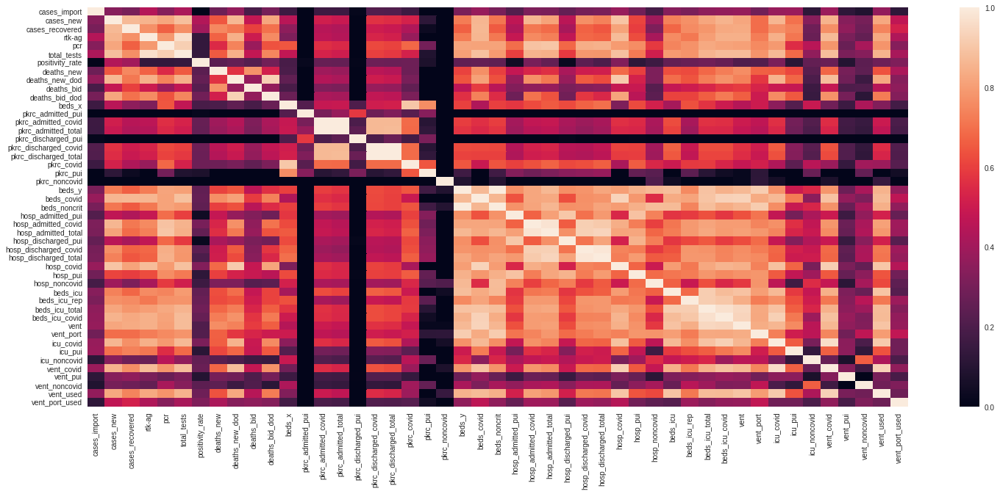

In [ ]:
plt.figure(figsize=(25,10))
sns.heatmap(final_merged.corr(), vmin=0, vmax=1)

We have plotted a correlation map to check the correlation of the new final_merged dataframe

#2.0 Correlation

**Question 2** <br/>
What are the states that exhibit strong correlation with (i) Pahang, and (ii) Johor?

In this section, we try to find out which states have strong correlation with Pahang and Johor. We decided to use four attributes (new cases, recovered cases, total tests conducted, total death) to test out the correlation between each state.

We first merged the cases and tests dataframe with death dataframe by inner so that the data is July 2021 onwards. After that, we split each attribute to different pivot tables to create correlation table separately later.

In [ ]:
#Aw
df_q2 = df.merge(final_death, on=['date','state'], how='inner')
cases = pd.pivot_table(df_q2, values='cases_new', index=['date'], columns=['state'])
recover = pd.pivot_table(df_q2, values='cases_recovered', index=['date'], columns=['state'])
tests = pd.pivot_table(df_q2, values='total_tests', index=['date'], columns=['state'])
death = pd.pivot_table(df_q2, values='deaths_new', index=['date'], columns=['state'])

In [ ]:
cases

state,Johor,Kedah,Kelantan,Melaka,Negeri Sembilan,Pahang,Perak,Perlis,Pulau Pinang,Sabah,Sarawak,Selangor,Terengganu,W.P. Kuala Lumpur,W.P. Labuan,W.P. Putrajaya
date,,,,,,,,,,,,,,,,
2021-07-01,270,250,108,311,692,195,149,1,174,232,544,2885,50,988,129,10
2021-07-02,517,257,129,202,606,329,182,0,351,230,440,2907,44,637,131,20
2021-07-03,414,145,89,345,699,200,101,2,142,322,361,3047,51,616,108,16
2021-07-04,500,332,124,290,531,95,384,0,173,228,365,2262,54,616,75,16
2021-07-05,324,273,114,206,523,312,249,0,157,263,424,2610,17,819,71,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-17,2334,1173,869,287,198,832,1596,41,1462,1533,3480,2646,719,366,10,31
2021-09-18,2208,1073,1214,263,131,634,1120,33,1375,1395,2929,1995,755,382,11,31
2021-09-19,1948,809,1420,207,144,705,1222,76,1259,1356,2707,2028,671,383,0,19


In [ ]:
recover

state,Johor,Kedah,Kelantan,Melaka,Negeri Sembilan,Pahang,Perak,Perlis,Pulau Pinang,Sabah,Sarawak,Selangor,Terengganu,W.P. Kuala Lumpur,W.P. Labuan,W.P. Putrajaya
date,,,,,,,,,,,,,,,,
2021-07-01,361,186,208,317,883,19,98,0,104,188,587,1829,32,701,56,11
2021-07-02,584,201,87,214,1009,68,118,1,202,165,534,2037,14,889,136,19
2021-07-03,497,226,153,99,751,77,90,1,4,148,667,2222,38,512,184,8
2021-07-04,558,168,89,151,686,99,214,3,308,120,501,1635,31,523,173,12
2021-07-05,229,170,146,135,559,162,271,2,81,232,410,1687,9,318,107,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-17,2269,1650,1581,495,264,737,572,79,3637,3494,2402,3543,1502,704,4,37
2021-09-18,1998,1370,1260,329,246,512,1165,89,1073,1775,2907,3599,186,667,5,24
2021-09-19,2096,1449,1426,391,253,667,1538,73,4113,1912,3777,3784,1389,575,1,25


In [ ]:
tests

state,Johor,Kedah,Kelantan,Melaka,Negeri Sembilan,Pahang,Perak,Perlis,Pulau Pinang,Sabah,Sarawak,Selangor,Terengganu,W.P. Kuala Lumpur,W.P. Labuan,W.P. Putrajaya
date,,,,,,,,,,,,,,,,
2021-07-01,6419.0,3370.0,3314.0,3181.0,5457.0,4708.0,4950.0,121.0,6160.0,6677.0,7522.0,30265.0,2367.0,10895.0,2181.0,443.0
2021-07-02,6883.0,2783.0,2779.0,3940.0,7636.0,4806.0,3686.0,108.0,5654.0,6563.0,8130.0,29475.0,1813.0,9983.0,1728.0,535.0
2021-07-03,5294.0,2936.0,1479.0,3321.0,4890.0,3994.0,3141.0,102.0,5788.0,6142.0,6391.0,28275.0,1346.0,11382.0,979.0,380.0
2021-07-04,5314.0,3165.0,2738.0,3119.0,3795.0,2957.0,2147.0,42.0,2543.0,4723.0,6901.0,21212.0,1815.0,6663.0,1377.0,210.0
2021-07-05,6865.0,3781.0,3639.0,2342.0,5327.0,4248.0,2804.0,181.0,5024.0,5739.0,6869.0,27300.0,1555.0,9077.0,1621.0,388.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-17,14295.0,4749.0,3235.0,4958.0,3517.0,6029.0,6910.0,778.0,7499.0,6311.0,11288.0,24601.0,4093.0,7924.0,549.0,408.0
2021-09-18,14769.0,5744.0,3726.0,3108.0,2862.0,6035.0,6378.0,504.0,7873.0,5880.0,11104.0,22751.0,4902.0,8298.0,606.0,277.0
2021-09-19,18552.0,7284.0,3829.0,2487.0,2686.0,5994.0,7770.0,454.0,8683.0,5897.0,10515.0,22225.0,6604.0,5587.0,405.0,342.0


In [ ]:
death

state,Johor,Kedah,Kelantan,Melaka,Negeri Sembilan,Pahang,Perak,Perlis,Pulau Pinang,Sabah,Sarawak,Selangor,Terengganu,W.P. Kuala Lumpur,W.P. Labuan,W.P. Putrajaya
date,,,,,,,,,,,,,,,,
2021-07-01,6,0,0,4,6,2,0,0,0,5,4,46,1,6,3,1
2021-07-02,4,1,2,1,13,4,0,0,2,5,4,29,0,5,3,0
2021-07-03,6,5,0,4,11,5,1,0,0,1,1,51,0,21,1,0
2021-07-04,3,3,0,1,15,2,0,0,2,0,1,24,1,11,0,0
2021-07-05,7,4,3,8,10,4,0,0,0,0,0,30,0,10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-17,76,48,10,0,1,12,7,2,24,22,2,167,5,12,0,0
2021-09-18,53,24,12,7,5,5,15,0,25,13,11,147,0,7,0,0
2021-09-19,43,25,32,2,4,6,8,0,29,35,23,148,7,14,0,0


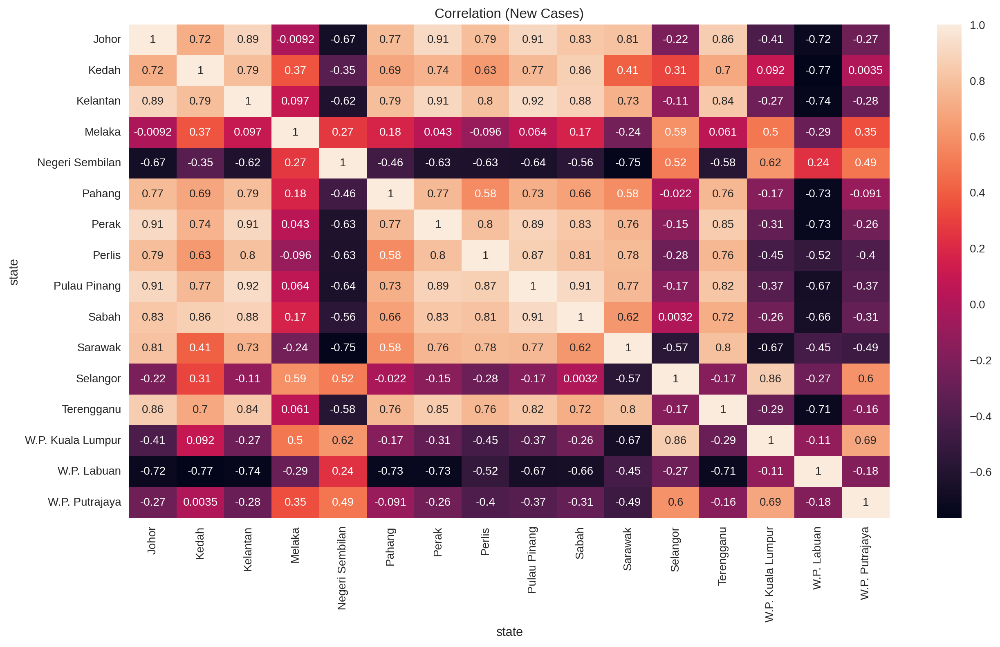

In [ ]:
cases_corr = cases.corr()
fig, ax = plt.subplots(figsize=(15,8), dpi=200)
sns.heatmap(cases_corr, annot=True)
ax.set_title('Correlation (New Cases)')
plt.show()

# Strong correlation in the perspective of total cases
# Johor: Penang Perak Kelantan Kedah Sabah Terengganu
# Pahang: Kelantan Johor Kedah Perak Terengganu

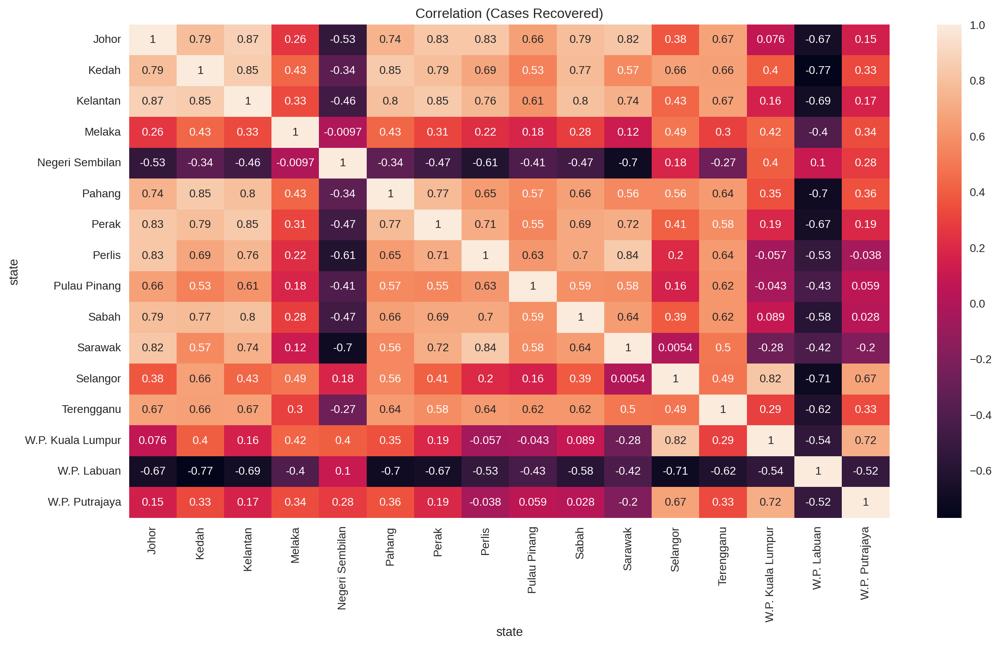

In [ ]:
recover_corr = recover.corr()
fig, ax = plt.subplots(figsize=(15,8), dpi=200)
sns.heatmap(recover_corr, annot=True)
ax.set_title('Correlation (Cases Recovered)')
plt.show()

# Strong correlation in the perspective of total tests
# Johor: Kelantan Kedah Perak Sabah Perlis
# Pahang: Kedah Perak Kelantan Johor Terengganu

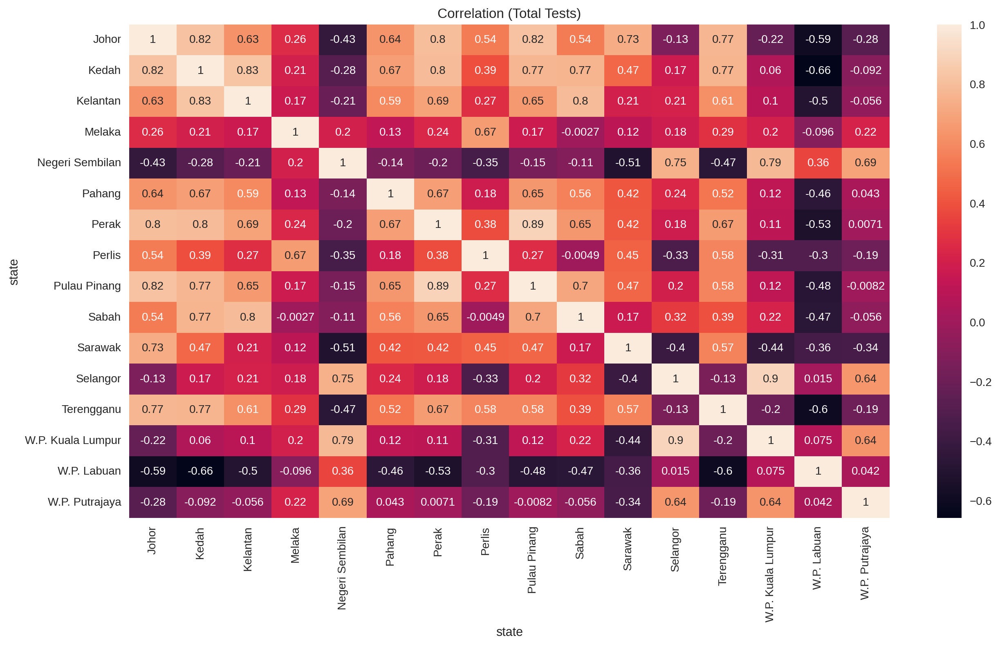

In [ ]:
tests_corr = tests.corr()
fig, ax = plt.subplots(figsize=(15,8), dpi=200)
sns.heatmap(tests_corr, annot=True)
ax.set_title('Correlation (Total Tests)')
plt.show()

# Strong correlation in the perspective of total tests
# Johor: Kedah Penang Perak Terengganu Sarawak
# Pahang: Perak Kedah Penang Johor Kelantan

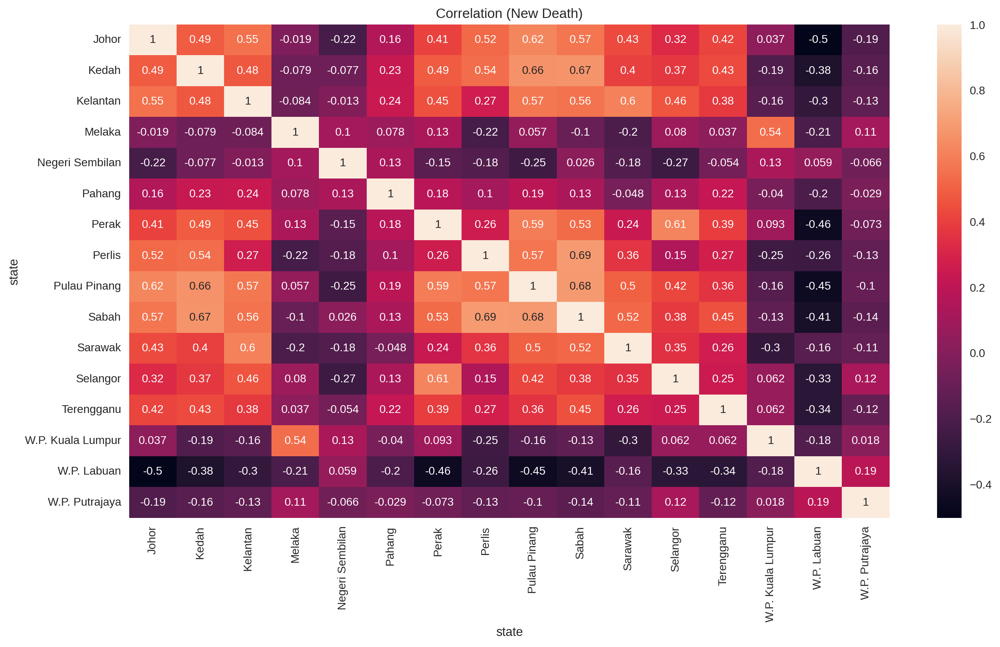

In [ ]:
death_corr = death.corr()
fig, ax = plt.subplots(figsize=(15,8), dpi=200)
sns.heatmap(death_corr, annot=True)
ax.set_title('Correlation (New Death)')
plt.show()

# Strong correlation in the perspective of total tests
# No strong correlation

## 2.1 Conclusion

From the correlation tables above, we can observe that every state does not exhibit a strong correlation in Death with Pahang and Johor. Therefore it is excluded and we have left three attributes, new cases, tests, and recovered cases. We filtered and picked the five highest correlation scores with Pahang and Johor in the perspective of those three attributes. The sequences are arranged from **strongest** to **weakest**.

**Strong → Weak**

i. Pahang

New Cases: Kelantan(0.79) → Johor(0.77) → Perak(0.77) → Terengganu(0.76) → Pulau Pinang(0.73)

Total Tests: Kedah(0.67) → Perak(0.67) → Pulau Pinang(0.65) → Johor(0.64) → Kelantan(0.59) 

Recovered Cases : Kedah(0.85) → Kelantan(0.80) → Perak(0.77) → Johor(0.74) → Sabah(0.66)

ii. Johor

New Cases: Pulau Pinang(0.91) → Perak(0.91) → Kelantan(0.89) → Terengganu(0.86) → Sabah(0.83)

Total Tests: Kedah(0.82) → Pulau Pinang(0.82) → Perak(0.80) → Terengganu(0.77) → Sarawak(0.73)

Recovered Cases : Kelantan(0.87) → Perak(0.83) → Perlis(0.83) → Sarawak(0.82) → Kedah(0.79) → Sabah(0.79)


#3.0 Strong Features<br/>
What are the strong features/indicators to daily cases for (i) Pahang, (ii) Kedah, (iii) Johor, and (iv) Selangor? [Note: you must use at least 2 methods to justify your findings]

## 3.1 Pahang

In [ ]:
#Pahang
q3_pahang = final_merged[final_merged['state'] == 'Pahang']
q3_kedah = final_merged[final_merged['state'] == 'Kedah']
corr_pahang = q3_pahang.corr()
corr_pahang1 = corr_pahang[abs(corr_pahang['cases_new']) > 0.5]
corr_pahang1 = corr_pahang1[abs(corr_pahang1['cases_new']) < 1]
pahang_strongFeatures = corr_pahang1['cases_new']
pahang_strongFeatures

cases_recovered          0.699044
pcr                      0.522724
positivity_rate          0.851082
beds_x                   0.683227
pkrc_admitted_covid      0.610728
pkrc_admitted_total      0.630133
pkrc_discharged_covid    0.570471
pkrc_discharged_total    0.576763
pkrc_covid               0.764441
beds_y                  -0.684264
beds_covid              -0.551083
beds_noncrit            -0.719593
beds_icu_rep             0.738254
beds_icu_total           0.740888
beds_icu_covid           0.680465
vent                    -0.520133
vent_port                0.788895
vent_covid               0.586034
vent_noncovid            0.574781
vent_port_used           0.646863
Name: cases_new, dtype: float64

Text(0.5, 1.0, 'Correlation Map for Pahang')

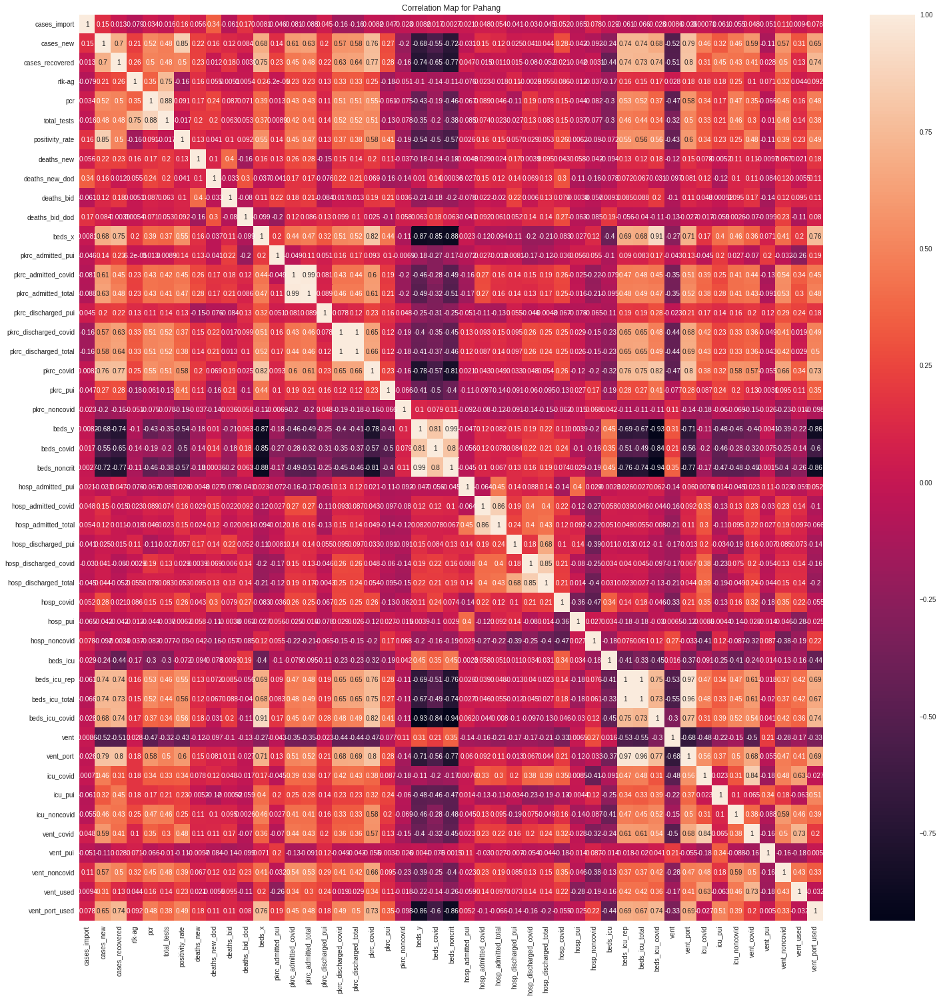

In [ ]:
plt.figure(figsize=(25,25))
sns.heatmap(corr_pahang,annot = True)
plt.title("Correlation Map for Pahang")

In [ ]:
print("The strong features are ")
for x in pahang_strongFeatures.index:
    print(x, end = ', ')

The strong features are 
cases_recovered, pcr, positivity_rate, beds_x, pkrc_admitted_covid, pkrc_admitted_total, pkrc_discharged_covid, pkrc_discharged_total, pkrc_covid, beds_y, beds_covid, beds_noncrit, beds_icu_rep, beds_icu_total, beds_icu_covid, vent, vent_port, vent_covid, vent_noncovid, vent_port_used, 

The map above shows the correlation map between variables for Pahang. To extract the strong features from the map, we decide to select the absolute correlation value higher than 0.5 with cases_new. Hence, we found out the strong features are cases_recovered, pcr, positivity_rate, beds_x, pkrc_admitted_covid, pkrc_admitted_total, pkrc_discharged_covid, pkrc_discharged_total, pkrc_covid, beds_y, beds_covid, beds_noncrit, beds_icu_rep, beds_icu_total, beds_icu_covid, vent, vent_port, vent_covid, vent_noncovid and vent_port_used. 

## 3.2 Kedah

In [ ]:
#Kedah
X = q3_kedah.drop(columns=['cases_new','date','state'])
y = q3_kedah['cases_new']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)
pipeline = Pipeline([('scaler',StandardScaler()),('model',Lasso())])
search = GridSearchCV(pipeline,{'model__alpha':np.arange(1,10,1)}, cv = 5, scoring="neg_mean_squared_error",verbose=3)
search.fit(X_train,y_train)


Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] model__alpha=1 ..................................................
[CV] .................. model__alpha=1, score=-7950.949, total=   0.0s
[CV] model__alpha=1 ..................................................
[CV] ................. model__alpha=1, score=-24125.134, total=   0.0s
[CV] model__alpha=1 ..................................................
[CV] ................. model__alpha=1, score=-12773.461, total=   0.0s
[CV] model__alpha=1 ..................................................
[CV] .................. model__alpha=1, score=-3430.765, total=   0.0s
[CV] model__alpha=1 ..................................................
[CV] ................. model__alpha=1, score=-10172.525, total=   0.0s
[CV] model__alpha=2 ..................................................
[CV] .................. model__alpha=2, score=-8894.196, total=   0.0s
[CV] model__alpha=2 ..................................................
[CV] ............

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV] .................. model__alpha=2, score=-7395.804, total=   0.0s
[CV] model__alpha=3 ..................................................
[CV] .................. model__alpha=3, score=-7923.533, total=   0.0s
[CV] model__alpha=3 ..................................................
[CV] ................. model__alpha=3, score=-25079.800, total=   0.0s
[CV] model__alpha=3 ..................................................
[CV] .................. model__alpha=3, score=-7856.426, total=   0.0s
[CV] model__alpha=3 ..................................................
[CV] .................. model__alpha=3, score=-1970.420, total=   0.0s
[CV] model__alpha=3 ..................................................
[CV] .................. model__alpha=3, score=-6159.475, total=   0.0s
[CV] model__alpha=4 ..................................................
[CV] .................. model__alpha=4, score=-7379.192, total=   0.0s
[CV] model__alpha=4 ..................................................
[CV] .

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:    0.6s finished


GridSearchCV(cv=5, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('scaler',
                                        StandardScaler(copy=True,
                                                       with_mean=True,
                                                       with_std=True)),
                                       ('model',
                                        Lasso(alpha=1.0, copy_X=True,
                                              fit_intercept=True, max_iter=1000,
                                              normalize=False, positive=False,
                                              precompute=False,
                                              random_state=None,
                                              selection='cyclic', tol=0.0001,
                                              warm_start=False))],
                                verbose=False),
             iid='deprecated', n_jobs=None,
             pa

In [ ]:
search.best_estimator_.named_steps['model'].coef_

array([ -0.        ,  19.5925142 ,   0.        ,   9.00564349,
       328.39322517, 369.45737005, -32.14965139,   0.        ,
        -2.26290442, -14.25717839,   5.07730577,   0.        ,
        -0.        ,  -0.        ,   0.        ,  -0.        ,
        -0.        ,  -4.0660013 ,  -5.47042452,   0.        ,
        24.64562202,   0.        ,   0.        ,  -0.        ,
         0.        ,   0.        ,  -0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   3.19231938,
         0.        ,  26.84877982,   0.        ,   0.        ,
         2.22459778,  -4.76399148,   2.73518245,  -0.        ,
        -9.80426345,  -0.        ,  -0.        , -11.84505411,
        10.95505912, -19.72117032])

In [ ]:
features = list(X.columns)

coefficients = search.best_estimator_.named_steps['model'].coef_
importance = np.abs(coefficients)
feature_selected = np.array(features)[importance > 0]

print("The strong features are ")
for x in feature_selected:
    print(x, end = ', ')

The strong features are 
cases_recovered, pcr, total_tests, positivity_rate, deaths_new, deaths_bid, deaths_bid_dod, beds_x, pkrc_covid, pkrc_pui, beds_y, hosp_noncovid, beds_icu_rep, vent, vent_port, icu_covid, icu_noncovid, vent_noncovid, vent_used, vent_port_used, 

For Kedah, we decided to use LASSO to find the strong features. LASSO determines the strong features by assigning a coefficient value larger than 0. The LASSO we used is cross validation 5 times with 9 different alpha values to find the most suitable model. Then, we trained the model and extracted the coefficient values of every column. After applying LASSO, we found that the strong features for Kedah are cases_recovered, pcr, total_tests, positivity_rate, deaths_new, deaths_bid, deaths_bid_dod, beds_x, pkrc_covid, pkrc_pui, beds_y, hosp_noncovid, beds_icu_rep, vent, vent_port, icu_covid, icu_noncovid, vent_noncovid, vent_used and vent_port_used

## 3.3 Johor

In [ ]:
#Johor
# using correlation coefficients as indication
q3_johor = final_merged[final_merged['state'] == 'Johor']
corr_johor = q3_johor.corr()
filter_corr = ((corr_johor['cases_new'] > 0.5) & (corr_johor['cases_new'] < 1)) | ((corr_johor['cases_new'] < -0.5) & (corr_johor['cases_new'] > -1))
johor_strongFeatures = corr_johor[filter_corr]
johor_strongFeatures = johor_strongFeatures['cases_new']
johor_strongFeatures

cases_recovered          0.855182
rtk-ag                   0.782458
pcr                      0.687199
total_tests              0.806945
positivity_rate          0.684457
deaths_new               0.789485
deaths_new_dod           0.828077
deaths_bid               0.687409
deaths_bid_dod           0.709974
pkrc_covid               0.500172
pkrc_noncovid            0.532811
beds_covid               0.900880
beds_noncrit             0.722776
hosp_admitted_covid      0.786495
hosp_admitted_total      0.691414
hosp_discharged_covid    0.852154
hosp_discharged_total    0.754914
hosp_covid               0.930495
hosp_noncovid           -0.822223
beds_icu                -0.812451
beds_icu_rep             0.726351
beds_icu_total          -0.769273
vent                     0.872596
vent_port                0.806564
vent_covid               0.582993
vent_noncovid            0.677513
vent_port_used           0.798918
Name: cases_new, dtype: float64

Text(0.5, 1.0, 'Correlation Map for Johor')

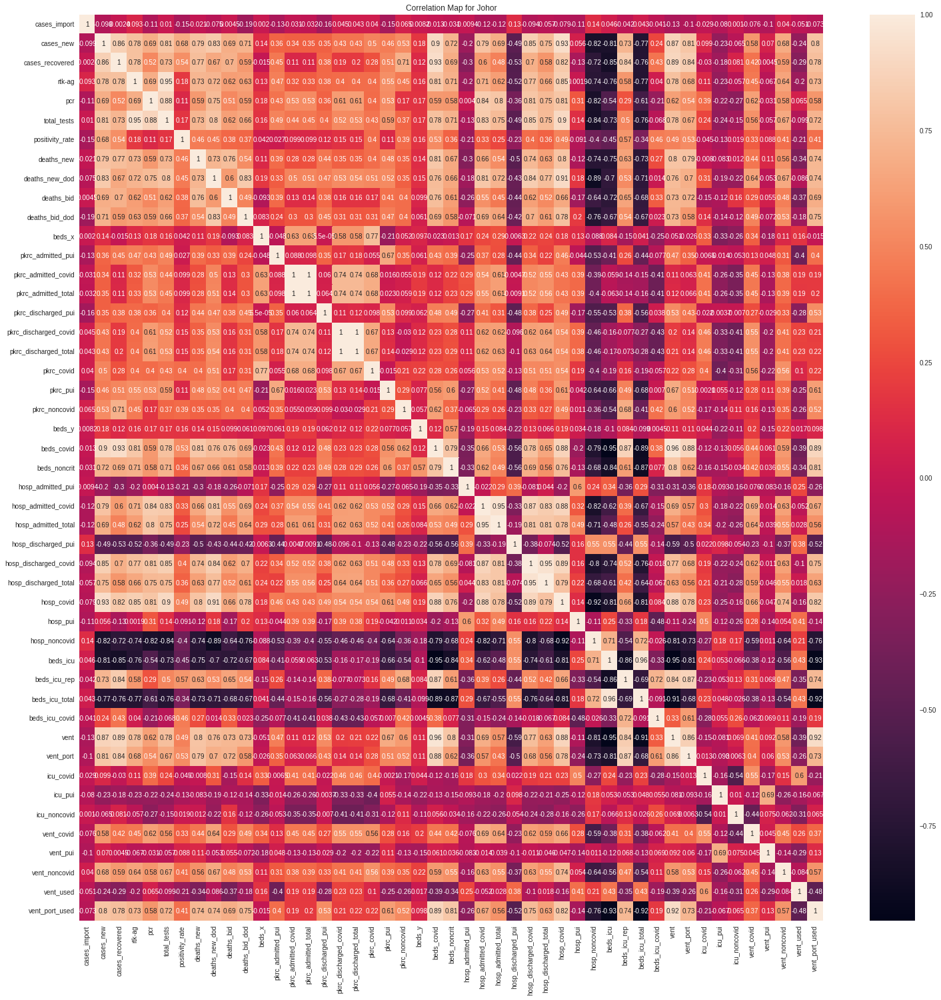

In [ ]:
plt.figure(figsize=(25,25))
sns.heatmap(corr_johor,annot=True)
plt.title("Correlation Map for Johor")

In [ ]:
print("The strong features to daily cases for Johor are: \n")
for x in johor_strongFeatures.index:
    print(x)
print("\nas all of these features obtained a correlation coefficients over 0.5.")

The strong features to daily cases for Johor are: 

cases_recovered
rtk-ag
pcr
total_tests
positivity_rate
deaths_new
deaths_new_dod
deaths_bid
deaths_bid_dod
pkrc_covid
pkrc_noncovid
beds_covid
beds_noncrit
hosp_admitted_covid
hosp_admitted_total
hosp_discharged_covid
hosp_discharged_total
hosp_covid
hosp_noncovid
beds_icu
beds_icu_rep
beds_icu_total
vent
vent_port
vent_covid
vent_noncovid
vent_port_used

as all of these features obtained a correlation coefficients over 0.5.


The correlation map above has shown the correlation between features for Johor. To extract the strong features from the map, we decide to select the absolute correlation coefficients over 0.5 or -0.5 with cases_new. Hence, we found out the strong features are cases_recovered, rtk-ag, pcr, total_tests, positivity_rate , deaths_new, deaths_new_dod, deaths_bid, deaths_bid_dod, pkrc_noncovid, beds_covid, beds_noncrit, admitted_covid_y, admitted_total_y, discharged_covid, discharged_total, hosp_covid, hosp_noncovid, beds_icu, beds_icu_rep, beds_icu_total, vent, vent_port, vent_covid, vent_noncovid, vent_port_used as all of these features obtained a correlation coefficients over 0.5 or below -0.5.

## 3.4 Selangor

In [ ]:
def ranking(ranks, names, order=1):
    minmax = MinMaxScaler()
    ranks = minmax.fit_transform(order*np.array([ranks]).T).T[0]
    ranks = map(lambda x: round(x,2), ranks)
    return dict(zip(names, ranks))

In [ ]:
#Selangor
q3_selangor = final_merged[final_merged['state'] == 'Selangor']
y_sel = q3_selangor['cases_new']
X_sel = q3_selangor.drop(['cases_new','date','state'], 1)
colnames = X_sel.columns
colnames

Index(['cases_import', 'cases_recovered', 'rtk-ag', 'pcr', 'total_tests',
       'positivity_rate', 'deaths_new', 'deaths_new_dod', 'deaths_bid',
       'deaths_bid_dod', 'beds_x', 'pkrc_admitted_pui', 'pkrc_admitted_covid',
       'pkrc_admitted_total', 'pkrc_discharged_pui', 'pkrc_discharged_covid',
       'pkrc_discharged_total', 'pkrc_covid', 'pkrc_pui', 'pkrc_noncovid',
       'beds_y', 'beds_covid', 'beds_noncrit', 'hosp_admitted_pui',
       'hosp_admitted_covid', 'hosp_admitted_total', 'hosp_discharged_pui',
       'hosp_discharged_covid', 'hosp_discharged_total', 'hosp_covid',
       'hosp_pui', 'hosp_noncovid', 'beds_icu', 'beds_icu_rep',
       'beds_icu_total', 'beds_icu_covid', 'vent', 'vent_port', 'icu_covid',
       'icu_pui', 'icu_noncovid', 'vent_covid', 'vent_pui', 'vent_noncovid',
       'vent_used', 'vent_port_used'],
      dtype='object')

In [ ]:
#Using Boruta
rfc = RandomForestClassifier(max_depth =4)
feat_selector = BorutaPy(rfc, n_estimators = 'auto',verbose=2,random_state=1)
feat_selector.fit(X_sel.values,y_sel.values.ravel())#

Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	46
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	46
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	46
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	46
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	46
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	46
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	46
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	0
Tentative: 	7
Rejected: 	39
Iteration: 	9 / 100
Confirmed: 	0
Tentative: 	7
Rejected: 	39
Iteration: 	10 / 100
Confirmed: 	0
Tentative: 	7
Rejected: 	39
Iteration: 	11 / 100
Confirmed: 	0
Tentative: 	7
Rejected: 	39
Iteration: 	12 / 100
Confirmed: 	0
Tentative: 	5
Rejected: 	41
Iteration: 	13 / 100
Confirmed: 	0
Tentative: 	5
Rejected: 	41
Iteration: 	14 / 100
Confirmed: 	0
Tentative: 	5
Rejected: 	41
Iteration: 	15 / 100
Confirmed: 	0
Tentative: 	5
Rejected: 	41
Iteration: 	16 / 100
Confirmed: 	0
Tentative: 	5
Rejected: 	41
I

BorutaPy(alpha=0.05,
         estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                          class_weight=None, criterion='gini',
                                          max_depth=4, max_features='auto',
                                          max_leaf_nodes=None, max_samples=None,
                                          min_impurity_decrease=0.0,
                                          min_impurity_split=None,
                                          min_samples_leaf=1,
                                          min_samples_split=2,
                                          min_weight_fraction_leaf=0.0,
                                          n_estimators=35, n_jobs=None,
                                          oob_score=False,
                                          random_state=RandomState(MT19937) at 0x7F7B15852160,
                                          verbose=0, warm_start=False),
         max_iter=100, n_estimators='au

In [ ]:
#Printing Score
boruta_score = ranking(list(map(float, feat_selector.ranking_)), colnames, order=-1)
boruta_score = pd.DataFrame(list(boruta_score.items()), columns=['Features', 'Score'])
boruta_score = boruta_score.sort_values("Score", ascending = False)
boruta_score

,Features,Score
3,pcr,1.00
5,positivity_rate,1.00
1,cases_recovered,0.95
30,hosp_pui,0.95
13,pkrc_admitted_total,0.93
43,vent_noncovid,0.91
2,rtk-ag,0.89
23,hosp_admitted_pui,0.86
41,vent_covid,0.82
40,icu_noncovid,0.82


In [ ]:
print('---------Top 23----------')
display(boruta_score.head(23))

print('---------Bottom 23----------')
boruta_score.tail(23)

---------Top 23----------


,Features,Score
3,pcr,1.00
5,positivity_rate,1.00
1,cases_recovered,0.95
30,hosp_pui,0.95
13,pkrc_admitted_total,0.93
43,vent_noncovid,0.91
2,rtk-ag,0.89
23,hosp_admitted_pui,0.86
41,vent_covid,0.82
40,icu_noncovid,0.82


---------Bottom 23----------


,Features,Score
9,deaths_bid_dod,0.50
18,pkrc_pui,0.48
16,pkrc_discharged_total,0.45
45,vent_port_used,0.43
24,hosp_admitted_covid,0.39
7,deaths_new_dod,0.39
44,vent_used,0.36
0,cases_import,0.34
34,beds_icu_total,0.32
39,icu_pui,0.30


Text(0.5, 1.0, 'Boruta Top 23 Features')

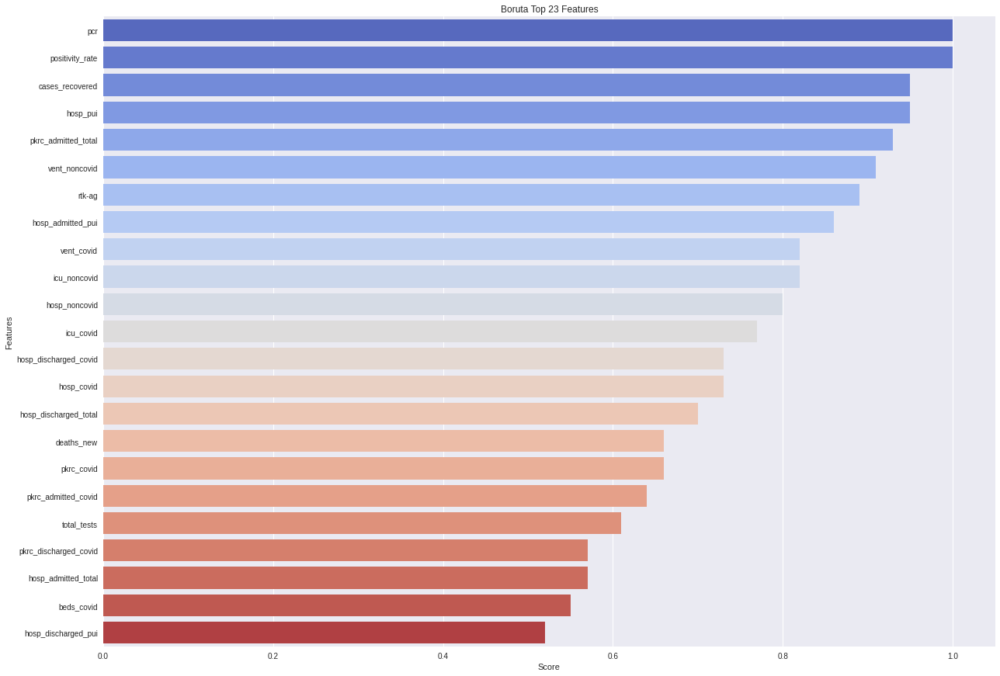

In [ ]:
sns_boruta_plot = sns.catplot(x="Score", y="Features", data = boruta_score[0:23], kind = "bar", 
               height=12, aspect=1.5, palette='coolwarm')
plt.title("Boruta Top 23 Features")

In [ ]:
print("The strong features are: \n",boruta_score['Features'].head(23).values)


The strong features are: 
 ['pcr' 'positivity_rate' 'cases_recovered' 'hosp_pui'
 'pkrc_admitted_total' 'vent_noncovid' 'rtk-ag' 'hosp_admitted_pui'
 'vent_covid' 'icu_noncovid' 'hosp_noncovid' 'icu_covid'
 'hosp_discharged_covid' 'hosp_covid' 'hosp_discharged_total' 'deaths_new'
 'pkrc_covid' 'pkrc_admitted_covid' 'total_tests' 'pkrc_discharged_covid'
 'hosp_admitted_total' 'beds_covid' 'hosp_discharged_pui']


For Selangor, a different technique for selecting the strong features has been applied which is through Boruta algorithm. A boruta score has been obtained after inserting all the inputs into this algorithm. A boruta score that is larger than 0.5 will be taken as strong features. A total of 23 strong features have been obtained which are : pcr, positivity_rate,  cases_recovered,hosp_pui, pkrc_admitted_total, vent_noncovid, rtk-ag, hosp_admitted_pui,
vent_covid, icu_noncovid, hosp_noncovid, icu_covid, hosp_discharged_covid,hosp_covid, ,hosp_discharged_total, deaths_new, pkrc_covid, pkrc_admitted_covid, total_tests, pkrc_discharged_covid, hosp_admitted_total, beds_covid, and hosp_discharged_pui.


# 4.0 Model Building

**Question 4** <br/>
Comparing regression and classification models, what model performs well in predicting the daily cases for (i) Pahang, (ii) Kedah, (iii) Johor, and (iv) Selangor? <br/>
Requirements:
1. Use TWO(2) regression models and TWO(2) classification models
2. Use appropriate evaluation metrics.

Feature Selection:

In [ ]:
strong_feat= boruta_score['Features'].head(23)
strong_feat.values

array(['pcr', 'positivity_rate', 'cases_recovered', 'hosp_pui',
       'pkrc_admitted_total', 'vent_noncovid', 'rtk-ag',
       'hosp_admitted_pui', 'vent_covid', 'icu_noncovid', 'hosp_noncovid',
       'icu_covid', 'hosp_discharged_covid', 'hosp_covid',
       'hosp_discharged_total', 'deaths_new', 'pkrc_covid',
       'pkrc_admitted_covid', 'total_tests', 'pkrc_discharged_covid',
       'hosp_admitted_total', 'beds_covid', 'hosp_discharged_pui'],
      dtype=object)

To ease our comparison between the models, we decided to standardize the strong features used in the models below. We choose the strong features given by BORUTA because it gives the best overall performance when compared to other features selection techniques.

## 4.1 Pahang


In [ ]:
# Pahang
# After feature selection (Strong Features to daily cases for Pahang)

df_pahang = final_merged[final_merged['state'] == 'Pahang']
X_pahang = df_pahang[strong_feat.values]
y_pahang = df_pahang['cases_new']
X_pahang

,pcr,positivity_rate,cases_recovered,hosp_pui,pkrc_admitted_total,vent_noncovid,rtk-ag,hosp_admitted_pui,vent_covid,icu_noncovid,hosp_noncovid,icu_covid,hosp_discharged_covid,hosp_covid,hosp_discharged_total,deaths_new,pkrc_covid,pkrc_admitted_covid,total_tests,pkrc_discharged_covid,hosp_admitted_total,beds_covid,hosp_discharged_pui
5,2605.0,0.041419,19,38,216,0,2103.0,9,20,21,956,36,35,395,48,2,1126,206,4708.0,71,75,842,13
19,2861.0,0.068456,68,29,211,0,1945.0,11,17,22,1006,30,52,425,69,4,1272,208,4806.0,38,72,842,17
33,2418.0,0.050075,77,36,246,0,1576.0,10,18,20,867,33,34,441,37,5,1459,242,3994.0,34,69,842,3
47,2127.0,0.032127,99,38,154,0,830.0,6,19,22,868,39,27,454,31,2,1303,144,2957.0,34,34,842,4
61,2277.0,0.073446,162,32,126,0,1971.0,7,19,19,920,30,56,429,63,4,1544,122,4248.0,141,46,842,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,3913.0,0.138000,737,42,348,18,2116.0,7,37,29,822,50,55,468,82,12,3650,336,6029.0,358,72,713,27
1109,4255.0,0.105054,512,40,137,30,1780.0,13,37,36,794,50,36,447,44,5,3610,128,6035.0,145,67,713,8
1123,3304.0,0.117618,667,44,468,33,2690.0,10,37,35,850,48,31,467,40,6,3764,457,5994.0,214,59,713,9
1137,3231.0,0.111685,589,32,326,28,3744.0,8,37,34,902,49,20,456,27,4,3724,311,6975.0,306,53,709,7


In [ ]:
scaler = StandardScaler()  
scaler.fit(X_pahang)  
X_pahang_norm = scaler.transform(X_pahang)
X_pahang_norm = pd.DataFrame(X_pahang_norm, columns=X_pahang.columns)
X_pahang_norm

,pcr,positivity_rate,cases_recovered,hosp_pui,pkrc_admitted_total,vent_noncovid,rtk-ag,hosp_admitted_pui,vent_covid,icu_noncovid,hosp_noncovid,icu_covid,hosp_discharged_covid,hosp_covid,hosp_discharged_total,deaths_new,pkrc_covid,pkrc_admitted_covid,total_tests,pkrc_discharged_covid,hosp_admitted_total,beds_covid,hosp_discharged_pui
0,-1.424111,-1.476277,-1.903358,-0.629405,-0.864447,-2.074621,-0.465127,-0.837344,-1.110554,-0.792461,1.731291,-0.945331,-0.997315,-1.525084,-0.779956,-0.847360,-2.139756,-0.858796,-1.235852,-1.799802,0.159974,0.715385,-0.061135
1,-1.147900,-0.563382,-1.682365,-0.997584,-0.922894,-2.074621,-0.701814,-0.567443,-1.511901,-0.622940,2.467747,-1.536015,0.180268,-0.932565,0.309357,-0.337716,-1.926496,-0.835291,-1.161567,-2.133994,-0.045353,0.715385,0.321823
2,-1.625875,-1.184004,-1.641774,-0.711222,-0.513767,-2.074621,-1.254585,-0.702394,-1.378118,-0.961982,0.420401,-1.240673,-1.066585,-0.616554,-1.350548,-0.082894,-1.653349,-0.435699,-1.777069,-2.174502,-0.250680,0.715385,-1.018530
3,-1.939850,-1.790006,-1.542552,-0.629405,-1.589185,-2.074621,-2.372109,-1.242196,-1.244336,-0.622940,0.435130,-0.649989,-1.551472,-0.359795,-1.661780,-0.847360,-1.881215,-1.587463,-2.563121,-2.174502,-2.646163,0.715385,-0.922790
4,-1.778007,-0.394890,-1.258418,-0.874858,-1.916487,-2.074621,-0.662866,-1.107245,-1.244336,-1.131503,1.201043,-1.536015,0.457346,-0.853562,-0.001875,-0.337716,-1.529191,-1.846022,-1.584535,-1.090911,-1.824854,0.715385,-0.635572
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78,-0.012843,1.784713,1.334872,-0.465769,0.678544,-0.047490,-0.445653,-1.107245,1.163744,0.563709,-0.242409,0.432931,0.388077,-0.083286,0.983694,1.700860,1.547001,0.669054,-0.234525,1.106651,-0.045353,-1.565624,1.279218
79,0.356158,0.672318,0.320106,-0.547587,-1.787904,1.303931,-0.948988,-0.297542,1.163744,1.750358,-0.654824,0.432931,-0.928046,-0.498050,-0.987444,-0.082894,1.488574,-1.775506,-0.229977,-1.050403,-0.387565,-1.565624,-0.539832
80,-0.669925,1.096526,1.019167,-0.383952,2.081264,1.641787,0.414212,-0.702394,1.163744,1.580837,0.170006,0.236036,-1.274394,-0.103037,-1.194932,0.171928,1.713519,2.091130,-0.261056,-0.351639,-0.935104,-1.565624,-0.444093
81,-0.748688,0.896201,0.667382,-0.874858,0.421379,1.078694,1.993128,-0.972295,1.163744,1.411315,0.935919,0.334484,-2.036359,-0.320294,-1.869268,-0.337716,1.655091,0.375237,0.482549,0.580046,-1.345758,-1.636353,-0.635572


### 4.1.1 Regression Model


In [ ]:
#train-test-split
X_pahang_train, X_pahang_test, y_pahang_train, y_pahang_test = train_test_split(X_pahang_norm, y_pahang, test_size=0.3, random_state=2)

In [ ]:
#Regression

#Model 1 :CatBoostRegressor
#Currently best model for Pahang
print('=================')
print('CatBoostRegressor')
print('=================')
cbr = CatBoostRegressor(iterations=4550,
                          learning_rate=0.02,
                          depth=3)
cbr.fit(X_pahang_train, y_pahang_train)

y_pahang_predcbr =cbr.predict(X_pahang_test)
cbr_mse = mse(y_pahang_test, y_pahang_predcbr)
cbr_rmse = mse(y_pahang_test, y_pahang_predcbr, squared=False)
print("r2:",cbr.score(X_pahang_test,y_pahang_test))
print('mae:',mean_absolute_error(y_pahang_test, y_pahang_predcbr))
print('mse:', cbr_mse)
print('rmse:', cbr_rmse)
print('Actual:', y_pahang_test.values)
print('Predicted:', y_pahang_predcbr)
print('---------------------------\n')
with open(path +'cbr_pahang', 'wb') as file:  
    pickle.dump(cbr, file)

#Model 2: Regression model
print('=================')
print('Linear Regression')
print('=================')
lr = LinearRegression(fit_intercept=True, normalize=False, copy_X=True, n_jobs=None)
lr.fit(X_pahang_train, y_pahang_train)

y_pahang_predlr =lr.predict(X_pahang_test)
lr_mse = mse(y_pahang_test, y_pahang_predlr)
lr_rmse = mse(y_pahang_test, y_pahang_predlr, squared=False)
print("r2:",lr.score(X_pahang_test,y_pahang_test))
print('mae:',mean_absolute_error(y_pahang_test, y_pahang_predlr))
print('mse:', lr_mse)
print('rmse:', lr_rmse)
print('Actual:', y_pahang_test.values)
print('Predicted:', y_pahang_predlr)
with open(path +'lr_pahang', 'wb') as file:  
    pickle.dump(lr, file)



CatBoostRegressor
0:	learn: 190.5778965	total: 488us	remaining: 2.22s
1:	learn: 189.1707055	total: 881us	remaining: 2s
2:	learn: 187.7695794	total: 1.25ms	remaining: 1.9s
3:	learn: 185.8742747	total: 1.64ms	remaining: 1.86s
4:	learn: 183.6681250	total: 2ms	remaining: 1.82s
5:	learn: 182.0028719	total: 2.37ms	remaining: 1.79s
6:	learn: 180.5057996	total: 2.76ms	remaining: 1.79s
7:	learn: 178.8940289	total: 3.14ms	remaining: 1.78s
8:	learn: 176.7615506	total: 3.51ms	remaining: 1.77s
9:	learn: 174.9721410	total: 3.89ms	remaining: 1.77s
10:	learn: 173.2703811	total: 4.26ms	remaining: 1.76s
11:	learn: 171.1850633	total: 4.63ms	remaining: 1.75s
12:	learn: 169.0269506	total: 5.02ms	remaining: 1.75s
13:	learn: 167.1697201	total: 5.38ms	remaining: 1.74s
14:	learn: 165.5288022	total: 5.75ms	remaining: 1.74s
15:	learn: 163.4789195	total: 6.12ms	remaining: 1.73s
16:	learn: 161.9656823	total: 6.49ms	remaining: 1.73s
17:	learn: 160.3916018	total: 6.87ms	remaining: 1.73s
18:	learn: 158.7454823	total:

For regression, we choose CatBoostRegressor and Linear Regression to predict the daily case. After running these two regressors, we obtained the results and compared them side by side. We use mean squared error (MSE) and root mean squared errors (RMSE) as the indicator. The MSE and RMSE of Linear Regressor are lower than the MSE and RMSE of the CatBoostRegressor at 3235.37, 56.88, 4610.63, and 67.90 respectively. Hence, linear regression is performing better in predicting the daily cases for Johor. Besides, we have also used Mean Absolute Error(MAE) as one of the evaluation metrics for Linear Regression and CatBoostRegressor which is at 44.11 and 49.84 respectively. MAE is a good way to evaluate the model as it calculates the absolute difference between actual and predicted values. A lower MAE is always better so Linear Regression performs better than CatBoostRegressor.


### 4.1.2 Classification Model


In [ ]:
#classification
#Binning 
y_pahang_bin =pd.cut(y_pahang,3,labels=['Low','Medium','High'])

In [ ]:
#train test split
X_pahang_train, X_pahang_test, y_pahang_train, y_pahang_test = train_test_split(X_pahang_norm, y_pahang_bin, test_size=0.3, random_state=2)

In [ ]:
#model 1: LGBM Classifier
print('=================')
print('LGBM Classifier')
print('=================')
lgbm =  LGBMClassifier(boosting_type='gbdt', objective='binary', num_leaves=50,
                                learning_rate=0.52, n_estimators=15, max_depth=12,
                                bagging_fraction=0.2, feature_fraction=0.9, reg_lambda=0.2)
lgbm.fit(X_pahang_train, y_pahang_train)

y_pred_lgbm  = lgbm.predict(X_pahang_test)
print(classification_report(y_pahang_test, y_pred_lgbm ))
print('---------------------------\n')
with open(path +'lgbm_pahang', 'wb') as file:  
    pickle.dump(lgbm, file)

LGBM Classifier
              precision    recall  f1-score   support

        High       1.00      0.64      0.78        11
         Low       0.67      0.80      0.73         5
      Medium       0.58      0.78      0.67         9

    accuracy                           0.72        25
   macro avg       0.75      0.74      0.72        25
weighted avg       0.78      0.72      0.73        25

---------------------------



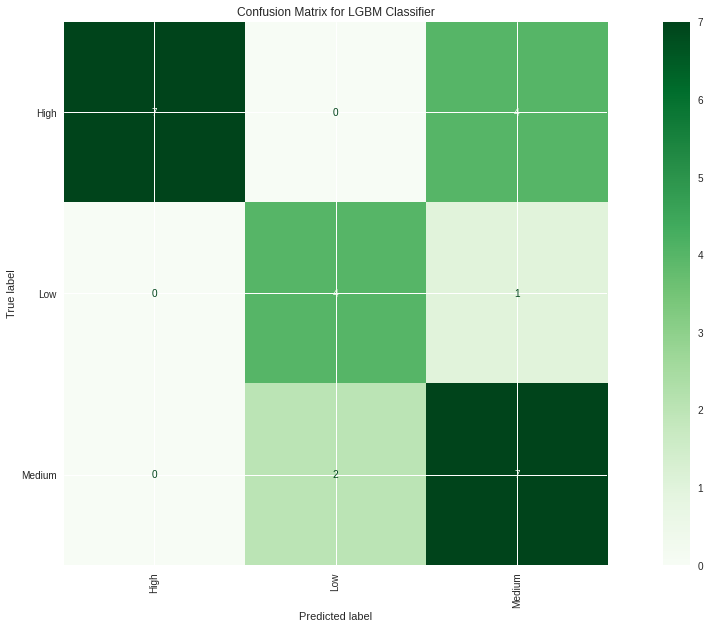

In [ ]:
#confusion matrix plot
fig1,ax1 = plt.subplots(figsize = (20,10))
ax1.set_title("Confusion Matrix for LGBM Classifier")
conf_matrix_lgbm = confusion_matrix(y_pahang_test, y_pred_lgbm)
lgbm_display = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_lgbm,display_labels = lgbm.classes_)
lgbm_display.plot(cmap = 'Greens',xticks_rotation ='vertical',ax=ax1)

In [ ]:
#model 2: Random Forest Classifier
print('=================')
print('Random Forest Classifier')
print('=================')
rfc = RandomForestClassifier(n_estimators=500)
rfc.fit(X_pahang_train, y_pahang_train)
y_pred_rfc = rfc.predict(X_pahang_test)
print(classification_report(y_pahang_test, y_pred_rfc ))
with open(path +'rf_pahang', 'wb') as file:  
    pickle.dump(rfc, file)

Random Forest Classifier
              precision    recall  f1-score   support

        High       1.00      0.36      0.53        11
         Low       0.80      0.80      0.80         5
      Medium       0.50      0.89      0.64         9

    accuracy                           0.64        25
   macro avg       0.77      0.68      0.66        25
weighted avg       0.78      0.64      0.63        25



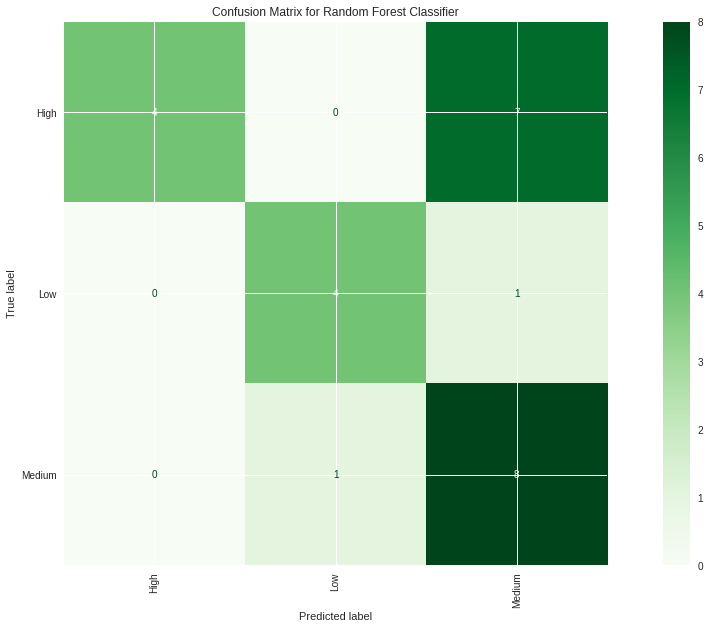

In [ ]:
#confusion matrix plot
fig2,ax2 = plt.subplots(figsize = (20,10))
ax2.set_title("Confusion Matrix for Random Forest Classifier")
conf_matrix_rfc = confusion_matrix(y_pahang_test, y_pred_rfc)
rfc_display = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_rfc,display_labels = rfc.classes_)
rfc_display.plot(cmap = 'Greens',xticks_rotation ='vertical',ax=ax2)

### 4.1.3 Performance Comparison


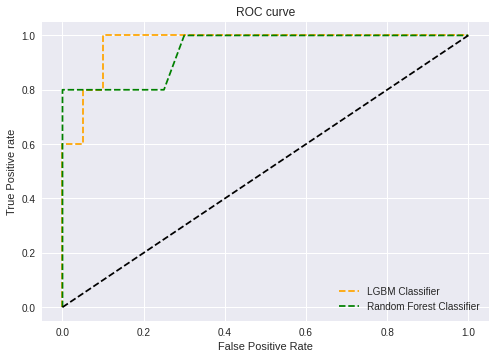

In [ ]:
#ROC curve
encoder = LabelEncoder()
y_pahang_test = encoder.fit_transform(y_pahang_test)
#predict probability
pred_prob1 = lgbm.predict_proba(X_pahang_test)[:,1]
pred_prob2 = rfc.predict_proba(X_pahang_test)[:,1]
# roc curve for models
fpr1, tpr1, thresh1 = roc_curve(y_pahang_test, pred_prob1, pos_label=1)
fpr2, tpr2, thresh2 = roc_curve(y_pahang_test, pred_prob2, pos_label=1)

# roc curve for tpr = fpr 
random_probs = [0 for i in range(len(y_pahang_test))]
p_fpr, p_tpr, _ = roc_curve(y_pahang_test, random_probs, pos_label=1)

# plot roc curves
plt.style.use('seaborn')
plt.plot(fpr1, tpr1, linestyle='--',color='orange', label='LGBM Classifier')
plt.plot(fpr2, tpr2, linestyle='--',color='green', label='Random Forest Classifier')
plt.plot(p_fpr, p_tpr, linestyle='--', color='black')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show();


In [ ]:
print('AUC for LGBM Classifier:',metrics.auc(fpr1, tpr1))
print('AUC for Random FOrest Classifier:',metrics.auc(fpr2, tpr2))

AUC for LGBM Classifier: 0.97
AUC for Random FOrest Classifier: 0.945


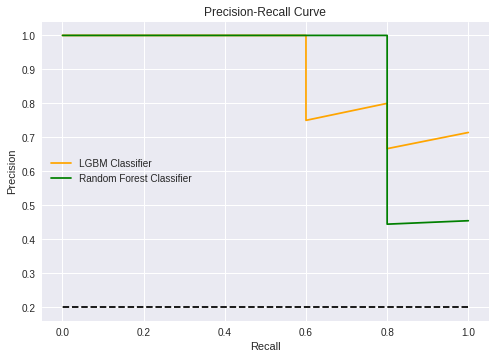

In [ ]:
#Precision-Recall Curve
prec_lgbm, rec_lgbm, threshold_lgbm = precision_recall_curve(y_pahang_test, pred_prob1,pos_label=1)
prec_rfc, rec_rfc, threshold_rfc = precision_recall_curve(y_pahang_test, pred_prob2,pos_label=1)
plt.plot(rec_lgbm,prec_lgbm, color='orange', label='LGBM Classifier') 
plt.plot(rec_rfc, prec_rfc, color='green', label='Random Forest Classifier') 
baseline1 = len(y_pahang_test[y_pahang_test==1]) / len(y_pahang_test)
plt.plot([1, 0], [baseline1,baseline1], color='black', linestyle='--')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()


We use LGBM and Random Forest Classifier to predict the daily cases and compare their performance. The first graph above shows the confusion matrix for the LGBM Classifier. This classifier has high accuracy for “high” and “medium” labels but has low accuracy for “low” labels. The second graph above shows the confusion matrix for the Random Forest Classifier. This classifier has high accuracy for “medium” labels but has low accuracy for  “high” and “low” labels. This classifier has a lower accuracy than the LGBM classifier at 0.64 and 0.72 respectively. The ROC curve and Precision-Recall Curve also shows that the LGBM Classifier is better than the Random Forest classifier. This is due to the fact that the line for LGBM Classifier is closer to the ideal line for ROC curve and Precision-Recall Curve. Therefore, the LGBM Classifier is the better performing model in predicting daily cases for Johor. <br/><br/>

If we were forced to choose only one type of supervised learning technique, we will prefer a regression model in this case. Through our experiment above, the linear regression model can predict the number of cases quite accurately with only errors of around 56 cases. The classification model can only predict a label of “low”, “medium” or “high”. We cannot know the exact number of cases for that particular day. For example, if we are trying to predict the value beyond the range of our dataset, for instance 100k cases in a day, the model will only predict it as ‘high’, but we have no idea how high the number of cases is. Therefore, we think that regression works better in this task.


## 4.2 Kedah


In [ ]:
# Kedah
# After feature selection (Strong Features to daily cases for Kedah)

df_kedah = final_merged[final_merged['state'] == 'Kedah']
X_kedah = df_kedah[strong_feat.values]
y_kedah = df_kedah['cases_new']
X_kedah

,pcr,positivity_rate,cases_recovered,hosp_pui,pkrc_admitted_total,vent_noncovid,rtk-ag,hosp_admitted_pui,vent_covid,icu_noncovid,hosp_noncovid,icu_covid,hosp_discharged_covid,hosp_covid,hosp_discharged_total,deaths_new,pkrc_covid,pkrc_admitted_covid,total_tests,pkrc_discharged_covid,hosp_admitted_total,beds_covid,hosp_discharged_pui
1,1297.0,0.074184,186,2,71,0,2073.0,1,43,13,1650,65,32,338,32,0,348,71,3370.0,55,71,661,0
15,1212.0,0.092346,201,3,61,0,1571.0,1,31,24,1563,61,31,356,32,1,346,61,2783.0,55,61,661,1
29,1386.0,0.049387,226,1,68,0,1550.0,0,39,21,1575,68,28,373,28,5,352,68,2936.0,54,45,661,0
43,1120.0,0.104897,168,1,59,0,2045.0,0,35,22,1698,66,28,385,28,3,356,59,3165.0,56,55,661,0
57,1405.0,0.072203,170,4,64,0,2376.0,3,35,9,1641,76,24,404,24,4,373,64,3781.0,27,67,661,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1091,1482.0,0.246999,1650,34,90,41,3267.0,12,44,41,1351,85,60,759,67,48,479,90,4749.0,65,97,1257,7
1105,2632.0,0.186804,1370,26,68,47,3112.0,4,47,47,1281,84,82,720,85,24,466,68,5744.0,71,91,1257,3
1119,2292.0,0.111065,1449,25,54,50,4992.0,4,45,52,1375,82,37,720,42,25,429,54,7284.0,80,82,1257,5
1133,1515.0,0.122700,1551,25,74,27,6366.0,8,42,32,1390,83,72,711,73,6,404,74,7881.0,92,81,1257,1


In [ ]:
scaler = StandardScaler()  
scaler.fit(X_kedah)  
X_kedah_norm = scaler.transform(X_kedah)
X_kedah_norm = pd.DataFrame(X_kedah_norm, columns=X_kedah.columns)
X_kedah_norm

,pcr,positivity_rate,cases_recovered,hosp_pui,pkrc_admitted_total,vent_noncovid,rtk-ag,hosp_admitted_pui,vent_covid,icu_noncovid,hosp_noncovid,icu_covid,hosp_discharged_covid,hosp_covid,hosp_discharged_total,deaths_new,pkrc_covid,pkrc_admitted_covid,total_tests,pkrc_discharged_covid,hosp_admitted_total,beds_covid,hosp_discharged_pui
0,-1.752643,-1.619766,-1.340584,-1.239240,-0.284193,-2.035934,-1.467794,-1.110847,-0.762819,-1.688781,1.645709,-2.164018,-1.240650,-2.137830,-1.241002,-0.991044,-0.988477,-0.279431,-1.746117,-0.648840,-1.409790,-1.397517,-0.592360
1,-1.835170,-1.305591,-1.319155,-1.163331,-0.830213,-2.035934,-1.857072,-1.110847,-2.335837,-0.957697,1.262192,-2.347064,-1.277269,-2.065966,-1.241002,-0.935390,-1.028440,-0.825144,-2.023286,-0.648840,-1.688458,-1.397517,-0.370892
2,-1.666234,-2.048708,-1.283440,-1.315149,-0.447999,-2.035934,-1.873357,-1.245840,-1.287158,-1.157083,1.315091,-2.026734,-1.387128,-1.998095,-1.376801,-0.712774,-0.908551,-0.443145,-1.951042,-0.709012,-2.134326,-1.397517,-0.592360
3,-1.924492,-1.088484,-1.366298,-1.315149,-0.939417,-2.035934,-1.489507,-1.245840,-1.811498,-1.090621,1.857305,-2.118257,-1.387128,-1.950186,-1.376801,-0.824082,-0.828626,-0.934287,-1.842913,-0.588669,-1.855658,-1.397517,-0.592360
4,-1.647787,-1.654031,-1.363441,-1.087422,-0.666407,-2.035934,-1.232832,-0.840861,-1.811498,-1.954630,1.606035,-1.660643,-1.533605,-1.874329,-1.512599,-0.768428,-0.488942,-0.661431,-1.552051,-2.333651,-1.521257,-1.397517,-0.592360
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78,-1.573028,1.369611,0.750869,1.189853,0.753244,0.560874,-0.541902,0.374077,-0.631734,0.172161,0.327644,-1.248790,-0.215305,-0.457014,-0.052765,1.680349,1.629085,0.757423,-1.094982,-0.047122,-0.685254,1.176670,0.957916
79,-0.456497,0.328339,0.350865,0.582580,-0.447999,0.940895,-0.662098,-0.705867,-0.238480,0.570934,0.019067,-1.294551,0.590323,-0.612719,0.558328,0.344653,1.369327,-0.443145,-0.625165,0.313908,-0.852455,1.176670,0.072044
80,-0.786602,-0.981789,0.463723,0.506671,-1.212427,1.130905,0.795756,-0.705867,-0.500649,0.903246,0.433442,-1.386074,-1.057552,-0.612719,-0.901506,0.400307,0.630016,-1.207144,0.101991,0.855454,-1.103255,1.176670,0.514980
81,-1.540988,-0.780529,0.609439,0.506671,-0.120387,-0.325841,1.861230,-0.165895,-0.893904,-0.425999,0.499566,-1.340313,0.224129,-0.648651,0.150933,-0.657120,0.130481,-0.115717,0.383881,1.577516,-1.131122,1.176670,-0.370892


### 4.2.1 Regression Model


In [ ]:
#train-test-split
X_kedah_train, X_kedah_test, y_kedah_train, y_kedah_test = train_test_split(X_kedah_norm, y_kedah, test_size=0.3, random_state=2)

In [ ]:
#Regression

#Model 1 :CatBoostRegressor
#Currently best model for Kedah
print('=================')
print('CatBoostRegressor')
print('=================')
cbr = CatBoostRegressor(iterations=4550,
                          learning_rate=0.02,
                          depth=3)
cbr.fit(X_kedah_train, y_kedah_train)

y_kedah_predcbr =cbr.predict(X_kedah_test)
cbr_mse = mse(y_kedah_test, y_kedah_predcbr)
cbr_rmse = mse(y_kedah_test, y_kedah_predcbr, squared=False)
print("r2:",cbr.score(X_kedah_test,y_kedah_test))
print('mae:',mean_absolute_error(y_kedah_test, y_kedah_predcbr))
print('mse:', cbr_mse)
print('rmse:', cbr_rmse)
print('Actual:', y_kedah_test.values)
print('Predicted:', y_kedah_predcbr)
print('---------------------------\n')
with open(path +'cbr_kedah', 'wb') as file:  
    pickle.dump(cbr, file)

#Model 2: Regression model
print('=================')
print('Linear Regression')
print('=================')
lr = LinearRegression(fit_intercept=True, normalize=False, copy_X=True, n_jobs=None)
lr.fit(X_kedah_train, y_kedah_train)

y_kedah_predlr =lr.predict(X_kedah_test)
lr_mse = mse(y_kedah_test, y_kedah_predlr)
lr_rmse = mse(y_kedah_test, y_kedah_predlr, squared=False)
print("r2:",lr.score(X_kedah_test,y_kedah_test))
print('mae:',mean_absolute_error(y_kedah_test, y_kedah_predlr))
print('mse:', lr_mse)
print('rmse:', lr_rmse)
print('Actual:', y_kedah_test.values)
print('Predicted:', y_kedah_predlr)
with open(path +'lr_kedah', 'wb') as file:  
    pickle.dump(lr, file)


CatBoostRegressor
0:	learn: 593.5081562	total: 481us	remaining: 2.19s
1:	learn: 586.4312692	total: 900us	remaining: 2.05s
2:	learn: 580.1331771	total: 1.32ms	remaining: 2s
3:	learn: 573.6750300	total: 1.81ms	remaining: 2.06s
4:	learn: 566.4377538	total: 2.26ms	remaining: 2.06s
5:	learn: 560.1206445	total: 2.68ms	remaining: 2.03s
6:	learn: 554.7200231	total: 3.13ms	remaining: 2.03s
7:	learn: 548.2616851	total: 3.56ms	remaining: 2.02s
8:	learn: 541.3782591	total: 4.18ms	remaining: 2.11s
9:	learn: 534.6906631	total: 8.07ms	remaining: 3.66s
10:	learn: 529.1697600	total: 8.69ms	remaining: 3.59s
11:	learn: 522.7456467	total: 9.97ms	remaining: 3.77s
12:	learn: 518.2704475	total: 11ms	remaining: 3.85s
13:	learn: 514.0364761	total: 12.1ms	remaining: 3.92s
14:	learn: 509.9851096	total: 13.1ms	remaining: 3.97s
15:	learn: 504.0952356	total: 14ms	remaining: 3.96s
16:	learn: 498.7735130	total: 14.6ms	remaining: 3.9s
17:	learn: 493.4858215	total: 15ms	remaining: 3.78s
18:	learn: 488.1145127	total: 15

For regression, we choose CatBoostRegressor and Linear Regression to predict the daily case. After running these two regressors, we obtained the results and compared them side by side. We use mean squared error (MSE) and root mean squared errors (RMSE) as the indicator. The MSE and RMSE of linear regression are lower than the MSE and RMSE of the CatBoostRegressor at 7335.67, 85.64, 7483.84 and 86.50 respectively. Hence, linear regression is performing better in predicting the daily cases for Johor. Besides, we have also used Mean Absolute Error(MAE) as one of the evaluation metrics for Linear Regression and CatBoostRegressor which is at 91.49 and 128.45 respectively. MAE is a good way to evaluate the model as it calculates the absolute difference between actual and predicted values. A lower MAE is always better so Linear Regression performs better than CatBoostRegressor.

### 4.2.2 Classification Model


In [ ]:
#classification
#Binning 
y_kedah_bin =pd.cut(y_kedah,3,labels=['Low','Medium','High'])

In [ ]:
#train test split
X_kedah_train, X_kedah_test, y_kedah_train, y_kedah_test = train_test_split(X_kedah_norm, y_kedah_bin, test_size=0.3, random_state=2)

In [ ]:
#model 1: LGBM Classifier
print('=================')
print('LGBM Classifier')
print('=================')
lgbm_kedah =  LGBMClassifier(boosting_type='gbdt', objective='binary', num_leaves=50,
                                learning_rate=0.52, n_estimators=15, max_depth=12,
                                bagging_fraction=0.2, feature_fraction=0.9, reg_lambda=0.2)
lgbm_kedah.fit(X_kedah_train, y_kedah_train)

y_pred_lgbm_kedah  = lgbm_kedah.predict(X_kedah_test)
print(classification_report(y_kedah_test, y_pred_lgbm_kedah ))
print('---------------------------\n')
with open(path +'lgbm_kedah', 'wb') as file:  
    pickle.dump(lgbm, file)

LGBM Classifier
              precision    recall  f1-score   support

        High       1.00      0.50      0.67         4
         Low       1.00      0.75      0.86         8
      Medium       0.76      1.00      0.87        13

    accuracy                           0.84        25
   macro avg       0.92      0.75      0.80        25
weighted avg       0.88      0.84      0.83        25

---------------------------



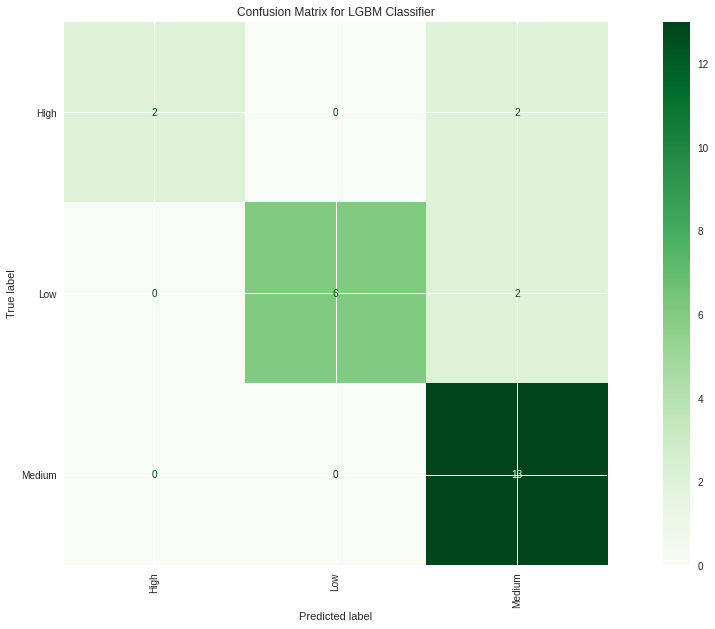

In [ ]:
#confusion matrix plot
fig1,ax1 = plt.subplots(figsize = (20,10))
ax1.set_title("Confusion Matrix for LGBM Classifier")
conf_matrix_lgbm = confusion_matrix(y_kedah_test, y_pred_lgbm_kedah)
lgbm_display = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_lgbm,display_labels = lgbm.classes_)
lgbm_display.plot(cmap = 'Greens',xticks_rotation ='vertical',ax=ax1)

In [ ]:
#model 2: Random Forest Classifier
print('=================')
print('Random Forest Classifier')
print('=================')
rfc_kedah = RandomForestClassifier(n_estimators=500)
rfc_kedah.fit(X_kedah_train, y_kedah_train)
y_pred_rfc_kedah = rfc_kedah.predict(X_kedah_test)
print(classification_report(y_kedah_test, y_pred_rfc_kedah ))
with open(path +'rfc_kedah', 'wb') as file:  
    pickle.dump(rfc, file)

Random Forest Classifier
              precision    recall  f1-score   support

        High       0.67      1.00      0.80         4
         Low       1.00      0.75      0.86         8
      Medium       0.85      0.85      0.85        13

    accuracy                           0.84        25
   macro avg       0.84      0.87      0.83        25
weighted avg       0.87      0.84      0.84        25



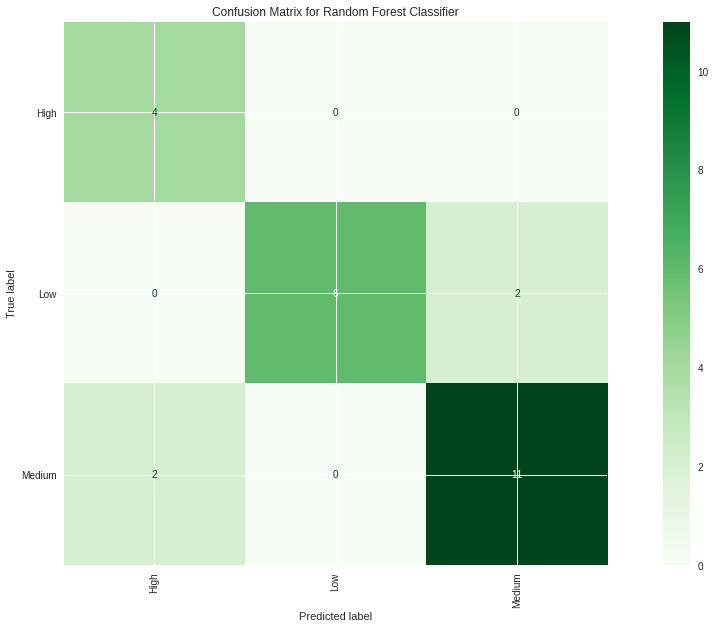

In [ ]:
#confusion matrix plot
fig2,ax2 = plt.subplots(figsize = (20,10))
ax2.set_title("Confusion Matrix for Random Forest Classifier")
conf_matrix_rfc = confusion_matrix(y_kedah_test, y_pred_rfc_kedah)
rfc_display = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_rfc,display_labels = rfc.classes_)
rfc_display.plot(cmap = 'Greens',xticks_rotation ='vertical',ax=ax2)

### 4.2.3 Performance Comparison


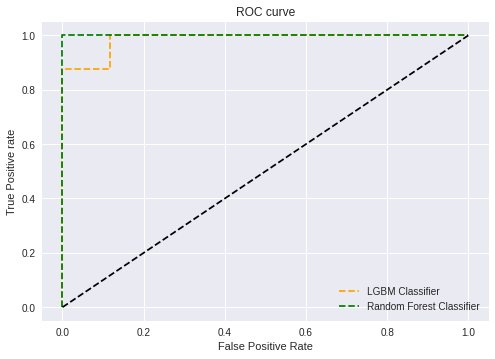

In [ ]:
#ROC curve
encoder = LabelEncoder()
y_kedah_test = encoder.fit_transform(y_kedah_test)
#predict probability
pred_prob1 = lgbm_kedah.predict_proba(X_kedah_test)[:,1]
pred_prob2 = rfc_kedah.predict_proba(X_kedah_test)[:,1]
# roc curve for models
fpr1, tpr1, thresh1 = roc_curve(y_kedah_test, pred_prob1, pos_label=1)
fpr2, tpr2, thresh2 = roc_curve(y_kedah_test, pred_prob2, pos_label=1)

# roc curve for tpr = fpr 
random_probs = [0 for i in range(len(y_kedah_test))]
p_fpr, p_tpr, _ = roc_curve(y_kedah_test, random_probs, pos_label=1)

# plot roc curves
plt.style.use('seaborn')
plt.plot(fpr1, tpr1, linestyle='--',color='orange', label='LGBM Classifier')
plt.plot(fpr2, tpr2, linestyle='--',color='green', label='Random Forest Classifier')
plt.plot(p_fpr, p_tpr, linestyle='--', color='black')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show();


In [ ]:
print('AUC for LGBM Classifier:',metrics.auc(fpr1, tpr1))
print('AUC for Random FOrest Classifier:',metrics.auc(fpr2, tpr2))

AUC for LGBM Classifier: 0.9852941176470588
AUC for Random FOrest Classifier: 1.0


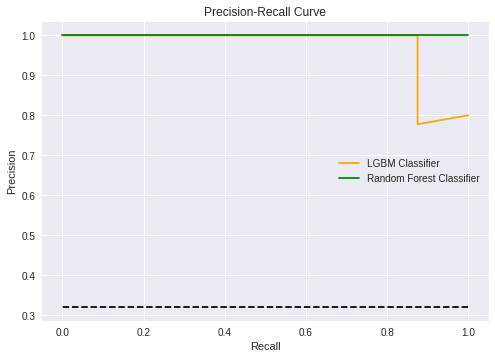

In [ ]:
#Precision-Recall Curve
prec_lgbm, rec_lgbm, threshold_lgbm = precision_recall_curve(y_kedah_test, pred_prob1,pos_label=1)
prec_rfc, rec_rfc, threshold_rfc = precision_recall_curve(y_kedah_test, pred_prob2,pos_label=1)
plt.plot(rec_lgbm, prec_lgbm, color='orange', label='LGBM Classifier') 
plt.plot(rec_rfc, prec_rfc, color='green', label='Random Forest Classifier') 
baseline2 = len(y_kedah_test[y_kedah_test==1]) / len(y_kedah_test)
plt.plot([1, 0], [baseline2,baseline2], color='black', linestyle='--')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()


We use LGBM and Random Forest Classifier to predict the daily cases and compare their performance. The first graph above shows the confusion matrix for the LGBM Classifier. This classifier has high accuracy for “low” and “medium” labels but has low accuracy for “high” labels. The second graph above shows the confusion matrix for the Random Forest Classifier. This classifier has high accuracy for “low” and “medium” labels but has low accuracy for “high” labels. This classifier has a similar accuracy with the LGBM classifier but the f1-score of this classifier is better than LGBM Classifier in overall. The ROC curve and Precision-Recall Curve also shows that the Random Forest classifier is better than LGBM Classifier. This is due to the fact that the line for Random Forest classifier is closer to the ideal line for ROC curve and Precision-Recall Curve. Therefore, the Random Forest classifier is the better performing model in predicting daily cases for Kedah. <br /><br/>

If we can choose only one type of supervised learning technique, we will prefer a regression model in this case. By using our linear regression model, we can predict the number of cases quite accurately with only errors around 86 cases instead of just predicting a label to know whether the number of cases are low, medium or high. In addition, if we are trying to predict the value beyond the range of our dataset, for instance 100k cases in a day, the model will only predict it as ‘high’, but we have no idea how high the number of cases is. Therefore, we think that regression works better in this task.


## 4.3 Johor


In [ ]:
# Johor
# After feature selection (Strong Features to daily cases for Johor)

df_johor = final_merged[final_merged['state'] == 'Johor']
X_johor  = df_johor[strong_feat.values]
y_johor  = df_johor['cases_new']

In [ ]:
scaler = StandardScaler()  
scaler.fit(X_johor)  
X_johor_norm = scaler.transform(X_johor)
X_johor_norm = pd.DataFrame(X_johor_norm, columns=X_johor.columns)
X_johor_norm

,pcr,positivity_rate,cases_recovered,hosp_pui,pkrc_admitted_total,vent_noncovid,rtk-ag,hosp_admitted_pui,vent_covid,icu_noncovid,hosp_noncovid,icu_covid,hosp_discharged_covid,hosp_covid,hosp_discharged_total,deaths_new,pkrc_covid,pkrc_admitted_covid,total_tests,pkrc_discharged_covid,hosp_admitted_total,beds_covid,hosp_discharged_pui
0,-1.506785,-1.466302,-1.056059,-0.305354,-1.751267,-2.018194,-1.427215,1.759910,-1.845267,1.023221,1.663309,-0.401360,-1.183252,-1.730062,-0.597134,-1.235504,-1.957362,-1.747302,-1.582971,-1.068882,-0.761089,-1.067854,2.022777
1,-1.219271,-0.269726,-0.700680,-1.272530,-1.649382,-2.018194,-1.502898,-0.622556,-1.722937,0.505371,1.611509,-0.401360,-1.815174,-1.696786,-1.760173,-1.344829,-1.919231,-1.645320,-1.505790,-1.624522,-1.735002,-1.045463,0.586122
2,-1.577336,-0.157884,-0.839326,-1.360455,-1.233354,-2.018194,-1.668939,0.275751,-2.089927,1.541070,1.231640,-0.687922,-1.537745,-1.709727,-1.677099,-1.235504,-1.814371,-1.228896,-1.770100,-1.474587,-1.467176,-1.045463,-0.057896
3,-1.963090,0.417391,-0.742114,-0.591111,-1.785228,-2.018194,-1.401987,-0.817840,-1.600607,-0.012478,1.608055,-0.544641,-2.030953,-1.711576,-2.657375,-1.399492,-1.963082,-1.781296,-1.766774,-0.901308,-2.441089,-1.045463,-1.395472
4,-1.595163,-1.280451,-1.266419,-0.393279,-1.105999,-2.018194,-1.252422,-0.544443,-2.579248,0.677988,1.635682,-1.189405,-1.429856,-1.733759,-1.594025,-1.180842,-1.911605,-1.101420,-1.508784,-1.307013,-1.917611,-1.045463,-0.156976
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78,-0.600624,2.922158,1.984590,-2.371593,-0.876759,0.464030,-0.014711,-1.833318,0.968323,0.677988,-0.377622,-0.687922,0.419672,0.634352,0.532676,2.590871,0.130312,-0.871961,-0.272898,-0.539701,-0.712394,1.659280,0.239343
79,-0.340420,2.423558,1.552716,-2.041874,-1.411652,0.223815,-0.069285,-1.364636,0.234343,0.160138,-0.760944,-0.759562,0.018941,0.556709,-0.547289,1.333633,0.252331,-1.407364,-0.194054,-1.765637,-1.004567,1.659280,-1.692711
80,-0.535004,0.812427,1.708892,-2.525462,-1.233354,0.624174,1.036623,-1.794261,-0.499637,0.160138,-0.170421,-0.902843,-0.073535,0.538222,-0.048844,0.787008,0.225639,-1.237395,0.435201,-0.945406,-1.028915,1.659280,0.090724
81,-0.414764,-0.490017,1.651521,-2.459518,-0.961662,0.624174,2.138670,-2.145772,-0.010317,1.023221,-0.032287,-0.687922,0.327196,0.488309,0.316683,1.278971,0.076928,-0.956946,1.200020,-0.001700,-0.943698,1.659280,-0.107436


### 4.3.1 Regression Model


In [ ]:
#train-test-split
X_johor_train, X_johor_test, y_johor_train, y_johor_test = train_test_split(X_johor_norm, y_johor, test_size=0.3, random_state=2)

In [ ]:
#Regression

#Model 1 :CatBoostRegressor
#Currently best model for Pahang
print('=================')
print('CatBoostRegressor')
print('=================')
cbr = CatBoostRegressor(iterations=4550,
                          learning_rate=0.02,
                          depth=3)
cbr.fit(X_johor_train, y_johor_train)

y_johor_predcbr =cbr.predict(X_johor_test)
cbr_mse = mse(y_johor_test, y_johor_predcbr)
cbr_rmse = mse(y_johor_test, y_johor_predcbr, squared=False)
print("r2:",cbr.score(X_johor_test,y_johor_test))
print('mae:',mean_absolute_error(y_johor_test, y_johor_predcbr))
print('mse:', cbr_mse)
print('rmse:', cbr_rmse)
print('Actual:', y_johor_test.values)
print('Predicted:', y_johor_predcbr)
print('---------------------------\n')
with open(path +'cbr_johor', 'wb') as file:  
    pickle.dump(cbr, file)

#Model 2: Regression model
print('=================')
print('Linear Regression')
print('=================')
lr = LinearRegression(fit_intercept=True, normalize=False, copy_X=True, n_jobs=None)
lr.fit(X_johor_train, y_johor_train)

y_johor_predlr =lr.predict(X_johor_test)
lr_mse = mse(y_johor_test, y_johor_predlr)
lr_rmse = mse(y_johor_test, y_johor_predlr, squared=False)
print("r2:",lr.score(X_johor_test,y_johor_test))
print('mae:',mean_absolute_error(y_johor_test, y_johor_predlr))
print('mse:', lr_mse)
print('rmse:', lr_rmse)
print('Actual:', y_johor_test.values)
print('Predicted:', y_johor_predlr)
with open(path +'lr_johor', 'wb') as file:  
    pickle.dump(lr, file)


CatBoostRegressor
0:	learn: 650.7276145	total: 519us	remaining: 2.36s
1:	learn: 642.0835381	total: 1.36ms	remaining: 3.1s
2:	learn: 634.3724139	total: 2.01ms	remaining: 3.05s
3:	learn: 626.4079269	total: 2.79ms	remaining: 3.17s
4:	learn: 618.5114910	total: 3.48ms	remaining: 3.16s
5:	learn: 610.6358899	total: 4.1ms	remaining: 3.1s
6:	learn: 603.5870496	total: 4.74ms	remaining: 3.07s
7:	learn: 597.3802023	total: 5.37ms	remaining: 3.05s
8:	learn: 590.1074045	total: 6.18ms	remaining: 3.12s
9:	learn: 582.6668075	total: 6.85ms	remaining: 3.11s
10:	learn: 576.4734894	total: 7.46ms	remaining: 3.08s
11:	learn: 569.1422563	total: 8.08ms	remaining: 3.06s
12:	learn: 562.8782058	total: 8.92ms	remaining: 3.11s
13:	learn: 556.9397440	total: 9.69ms	remaining: 3.14s
14:	learn: 550.0566000	total: 10.4ms	remaining: 3.14s
15:	learn: 542.3121142	total: 11ms	remaining: 3.11s
16:	learn: 535.8934771	total: 11.6ms	remaining: 3.09s
17:	learn: 529.5816753	total: 12.2ms	remaining: 3.07s
18:	learn: 523.1691827	tot

For regression, we choose CatBoostRegressor and Linear Regression to predict the daily case. After running these two regressors, we obtained the results and compared them side by side. We use mean squared error (MSE) and root mean squared errors (RMSE) as the indicator. The MSE and RMSE of linear regression are lower than the MSE and RMSE of the CatBoostRegressor at 22716.55, 150.72, 42365.15 and 205.83 respectively. Hence, linear regression is performing better in predicting the daily cases for Johor. Besides, we have also used Mean Absolute Error(MAE) as one of the evaluation metrics for Linear Regression and CatBoostRegressor which is at 63.28 and 69.99 respectively. MAE is a good way to evaluate the model as it calculates the absolute difference between actual and predicted values. A lower MAE is always better so Linear RegressionRegression performs better than CatBoostRegressor.

### 4.3.2 Classification Model


In [ ]:
#classification
#Binning 
y_johor_bin =pd.cut(y_johor,3,labels=['Low','Medium','High'])

In [ ]:
#train test split
X_johor_train, X_johor_test, y_johor_train, y_johor_test = train_test_split(X_johor_norm, y_johor_bin, test_size=0.3, random_state=2)

In [ ]:
#model 1: LGBM Classifier
print('=================')
print('LGBM Classifier')
print('=================')
lgbm_johor =  LGBMClassifier(boosting_type='gbdt', objective='binary', num_leaves=50,
                                learning_rate=0.52, n_estimators=15, max_depth=12,
                                bagging_fraction=0.2, feature_fraction=0.9, reg_lambda=0.2)
lgbm_johor.fit(X_johor_train, y_johor_train)

y_pred_lgbm_johor  = lgbm_johor.predict(X_johor_test)
print(classification_report(y_johor_test, y_pred_lgbm_johor ))
print('---------------------------\n')
with open(path +'lgbm_johor', 'wb') as file:  
    pickle.dump(lgbm, file)

LGBM Classifier
              precision    recall  f1-score   support

        High       0.50      0.60      0.55         5
         Low       0.90      1.00      0.95         9
      Medium       0.78      0.64      0.70        11

    accuracy                           0.76        25
   macro avg       0.73      0.75      0.73        25
weighted avg       0.77      0.76      0.76        25

---------------------------



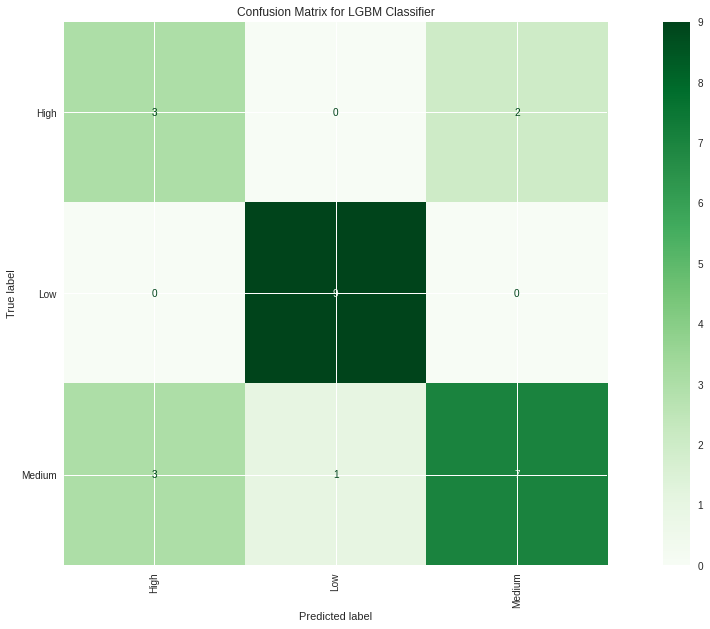

In [ ]:
#confusion matrix plot
fig1,ax1 = plt.subplots(figsize = (20,10))
ax1.set_title("Confusion Matrix for LGBM Classifier")
conf_matrix_lgbm = confusion_matrix(y_johor_test, y_pred_lgbm_johor)
lgbm_display = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_lgbm,display_labels = lgbm.classes_)
lgbm_display.plot(cmap = 'Greens',xticks_rotation ='vertical',ax=ax1)

In [ ]:
#model 2: Random Forest Classifier
print('=================')
print('Random Forest Classifier')
print('=================')
rfc_johor = RandomForestClassifier(n_estimators=500)
rfc_johor.fit(X_johor_train, y_johor_train)
y_pred_rfc_johor = rfc_johor.predict(X_johor_test)
print(classification_report(y_johor_test, y_pred_rfc_johor ))
with open(path +'rf_johor', 'wb') as file:  
    pickle.dump(rfc, file)

Random Forest Classifier
              precision    recall  f1-score   support

        High       0.67      0.80      0.73         5
         Low       0.89      0.89      0.89         9
      Medium       0.80      0.73      0.76        11

    accuracy                           0.80        25
   macro avg       0.79      0.81      0.79        25
weighted avg       0.81      0.80      0.80        25



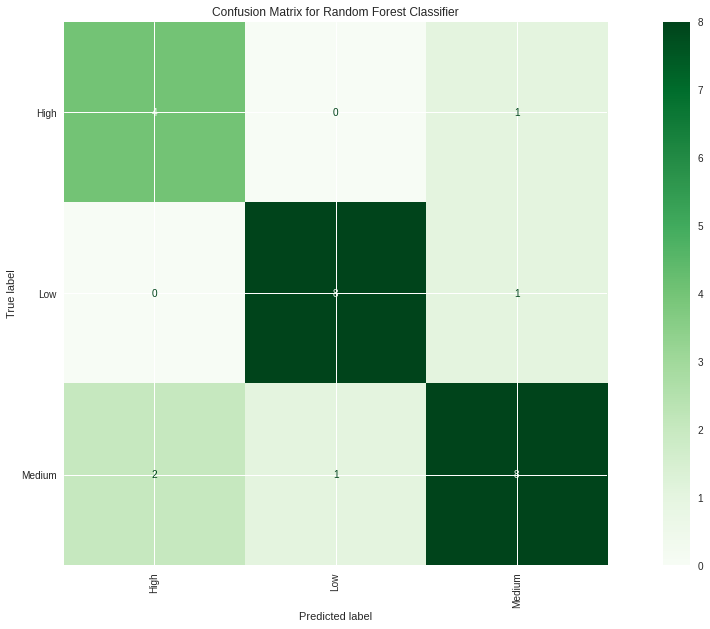

In [ ]:
#confusion matrix plot
fig2,ax2 = plt.subplots(figsize = (20,10))
ax2.set_title("Confusion Matrix for Random Forest Classifier")
conf_matrix_rfc = confusion_matrix(y_johor_test, y_pred_rfc_johor)
rfc_display = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_rfc,display_labels = rfc.classes_)
rfc_display.plot(cmap = 'Greens',xticks_rotation ='vertical',ax=ax2)

### 4.3.3 Performance Comparison


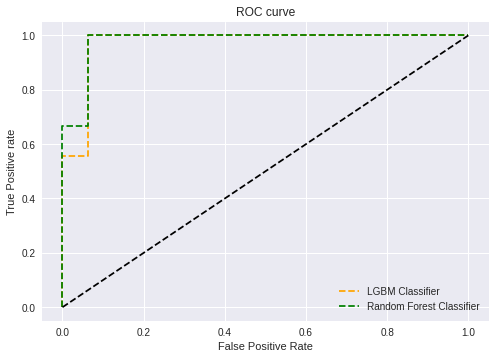

In [ ]:
#ROC curve
encoder = LabelEncoder()
y_johor_test = encoder.fit_transform(y_johor_test)
#predict probability
pred_prob1 = lgbm_johor.predict_proba(X_johor_test)[:,1]
pred_prob2 = rfc_johor.predict_proba(X_johor_test)[:,1]
# roc curve for models
fpr1, tpr1, thresh1 = roc_curve(y_johor_test, pred_prob1, pos_label=1)
fpr2, tpr2, thresh2 = roc_curve(y_johor_test, pred_prob2, pos_label=1)

# roc curve for tpr = fpr 
random_probs = [0 for i in range(len(y_johor_test))]
p_fpr, p_tpr, _ = roc_curve(y_johor_test, random_probs, pos_label=1)

# plot roc curves
plt.style.use('seaborn')
plt.plot(fpr1, tpr1, linestyle='--',color='orange', label='LGBM Classifier')
plt.plot(fpr2, tpr2, linestyle='--',color='green', label='Random Forest Classifier')
plt.plot(p_fpr, p_tpr, linestyle='--', color='black')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show();


In [ ]:
print('AUC for LGBM Classifier:',metrics.auc(fpr1, tpr1))
print('AUC for Random FOrest Classifier:',metrics.auc(fpr2, tpr2))

AUC for LGBM Classifier: 0.9722222222222222
AUC for Random FOrest Classifier: 0.9791666666666666


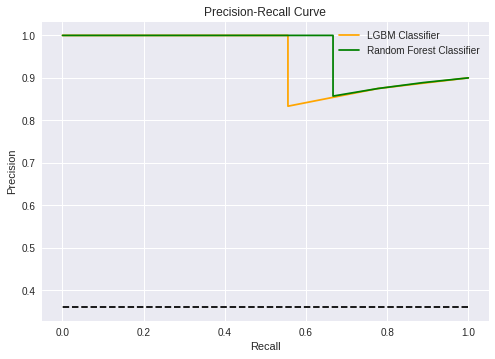

In [ ]:
#Precision-Recall Curve
prec_lgbm, rec_lgbm, threshold_lgbm = precision_recall_curve(y_johor_test, pred_prob1,pos_label=1)
prec_rfc, rec_rfc, threshold_rfc = precision_recall_curve(y_johor_test, pred_prob2,pos_label=1)
plt.plot(rec_lgbm, prec_lgbm, color='orange', label='LGBM Classifier') 
plt.plot(rec_rfc, prec_rfc, color='green', label='Random Forest Classifier') 
baseline3 = len(y_johor_test[y_johor_test==1]) / len(y_johor_test)
plt.plot([1, 0], [baseline3,baseline3], color='black', linestyle='--')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()


We use LGBM and Random Forest Classifier to predict the daily cases and compare their performance. The first graph above shows the confusion matrix for the LGBM Classifier. This classifier has high accuracy for “low” and “medium” labels but has low accuracy for “high” labels. The second graph above shows the confusion matrix for the Random Forest Classifier. This classifier has high accuracy for “low” and “medium” labels but has low accuracy for “high” labels. This classifier has a similar accuracy with the LGBM classifier but this classifier predicts more correct labels than the LGBM classifier. The ROC curve and Precision-Recall Curve also shows that the Random Forest classifier is better than LGBM Classifier. This is due to the fact that the line for Random Forest classifier is closer to the ideal line for ROC curve and Precision-Recall Curve. Therefore, the Random Forest classifier is the better performing model in predicting daily cases for Johor. <br /><br/>

If we were forced to choose only one type of supervised learning technique, we will prefer a regression model in this case. Through our experiment above, the linear regression model can predict the number of cases quite accurately with only errors of around 150 cases. The classification model can only predict a label of “low”, “medium” or “high”. We cannot know the exact number of cases for that particular day. For example, if we are trying to predict the value beyond the range of our dataset, for instance 100k cases in a day, the model will only predict it as ‘high’, but we have no idea how high the number of cases is. Therefore, we think that regression works better in this task.


## 4.4 Selangor


In [ ]:
# Selangor
# After feature selection (Strong Features to daily cases for selangor)

df_selangor = final_merged[final_merged['state'] == 'Selangor']
X_selangor  = df_selangor[strong_feat.values]
y_selangor  = df_selangor['cases_new']

In [ ]:
scaler = StandardScaler()  
scaler.fit(X_selangor)  
X_selangor_norm = scaler.transform(X_selangor)
X_selangor_norm = pd.DataFrame(X_selangor_norm, columns=X_selangor.columns)
X_selangor_norm

,pcr,positivity_rate,cases_recovered,hosp_pui,pkrc_admitted_total,vent_noncovid,rtk-ag,hosp_admitted_pui,vent_covid,icu_noncovid,hosp_noncovid,icu_covid,hosp_discharged_covid,hosp_covid,hosp_discharged_total,deaths_new,pkrc_covid,pkrc_admitted_covid,total_tests,pkrc_discharged_covid,hosp_admitted_total,beds_covid,hosp_discharged_pui
0,0.424458,-0.859441,-1.488090,0.478632,4.332452,-1.671405,-1.127665,0.715596,0.253128,1.220165,2.373703,0.595475,-0.418186,-1.190958,-0.259444,-0.740362,3.521745,4.326064,-0.692178,1.983221,-0.456470,-1.987644,0.518183
1,0.136891,-0.788825,-1.384051,1.207024,1.307184,-1.452248,-1.078028,0.848887,0.568587,1.307620,2.169787,0.747317,-0.098410,-1.068579,0.175583,-1.055490,3.175772,1.308323,-0.768314,2.265650,0.324559,-1.931982,0.829025
2,0.761857,-0.593381,-1.291516,0.726286,1.181381,-1.013933,-1.554314,1.568658,0.778893,1.045253,2.012215,0.633436,-0.244593,-0.934595,0.534954,-0.647677,2.575810,1.194559,-0.883964,3.172682,0.274857,-1.770702,2.354975
3,-0.236728,-0.617451,-1.585127,0.653446,3.727399,-1.086985,-1.927537,0.049141,0.926108,1.132709,1.894808,0.886505,-0.765372,-0.775292,-0.571529,-1.148175,2.736441,3.739281,-1.564658,2.466609,0.026348,-1.695058,0.659475
4,-0.127583,-0.853457,-1.559117,0.580607,2.469367,-1.306143,-1.215319,0.129116,1.010230,0.345608,1.987498,0.987733,-0.600916,-0.727817,-0.476958,-1.036953,2.596404,2.475901,-0.977929,2.406864,-0.484871,-1.656522,0.433408
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78,-2.187225,-0.597797,-0.630768,0.449497,-0.484014,0.958483,-0.486049,3.274782,-1.576537,0.957798,1.366479,-1.871951,-1.697292,-1.661484,-1.110585,1.502610,-0.584628,-0.469989,-1.238044,-0.243625,-1.024491,-1.146994,1.931100
79,-1.609903,-1.022780,-0.602757,1.003074,-1.107040,0.301011,-1.019676,0.742254,-1.681690,1.395076,0.714564,-1.897258,-1.139967,-1.749049,-1.138956,1.131871,-0.727411,-1.116648,-1.416338,-0.694425,-1.890723,-1.146994,0.122566
80,-1.999565,-0.946628,-0.510222,1.367270,-1.047133,0.593221,-0.883649,1.328734,-1.913027,1.832355,1.088411,-2.049100,-1.733838,-1.838723,-1.356470,1.150408,-0.901770,-1.056772,-1.467031,-0.607524,-1.727417,-1.179820,1.309416
81,-1.484472,-2.234327,-1.325029,1.673195,-1.490440,0.520169,1.594402,0.662279,-2.081272,0.782886,1.153294,-2.099714,-1.541972,-1.572865,-1.413213,0.816743,-1.095350,-1.475903,0.628059,-0.803052,-1.741617,-1.558042,0.546441


### 4.4.1 Regression Model


In [ ]:
#train-test-split
X_selangor_train, X_selangor_test, y_selangor_train, y_selangor_test = train_test_split(X_selangor_norm, y_selangor, test_size=0.3, random_state=2)

In [ ]:
#Regression

#Model 1 :CatBoostRegressor
#Currently best model for Pahang
print('=================')
print('CatBoostRegressor')
print('=================')
cbr = CatBoostRegressor(iterations=4550,
                          learning_rate=0.02,
                          depth=3)
cbr.fit(X_selangor_train, y_selangor_train)

y_selangor_predcbr =cbr.predict(X_selangor_test)
cbr_mse = mse(y_selangor_test, y_selangor_predcbr)
cbr_rmse = mse(y_selangor_test, y_selangor_predcbr, squared=False)
print("r2:",cbr.score(X_selangor_test,y_selangor_test))
print('mae:',mean_absolute_error(y_selangor_test, y_selangor_predcbr))
print('mse:', cbr_mse)
print('rmse:', cbr_rmse)
print('Actual:', y_selangor_test.values)
print('Predicted:', y_selangor_predcbr)
print('---------------------------\n')
with open(path +'cbr_selangor', 'wb') as file:  
    pickle.dump(cbr, file)

#Model 2: Regression model
print('=================')
print('Linear Regression')
print('=================')
lr = LinearRegression(fit_intercept=True, normalize=False, copy_X=True, n_jobs=None)
lr.fit(X_selangor_train, y_selangor_train)

y_selangor_predlr =lr.predict(X_selangor_test)
lr_mse = mse(y_selangor_test, y_selangor_predlr)
lr_rmse = mse(y_selangor_test, y_selangor_predlr, squared=False)
print("r2:",lr.score(X_selangor_test,y_selangor_test))
print('mae:',mean_absolute_error(y_selangor_test, y_selangor_predlr))
print('mse:', lr_mse)
print('rmse:', lr_rmse)
print('Actual:', y_selangor_test.values)
print('Predicted:', y_selangor_predlr)
with open(path +'lr_selangor', 'wb') as file:  
    pickle.dump(lr, file)


CatBoostRegressor
0:	learn: 1862.8202255	total: 695us	remaining: 3.16s
1:	learn: 1840.6722998	total: 1.7ms	remaining: 3.86s
2:	learn: 1823.0552647	total: 2.69ms	remaining: 4.07s
3:	learn: 1800.9330767	total: 3.5ms	remaining: 3.98s
4:	learn: 1786.7641908	total: 4.48ms	remaining: 4.08s
5:	learn: 1767.4258153	total: 5.19ms	remaining: 3.93s
6:	learn: 1750.6064446	total: 6.09ms	remaining: 3.95s
7:	learn: 1731.8279614	total: 6.85ms	remaining: 3.89s
8:	learn: 1712.1521866	total: 7.78ms	remaining: 3.92s
9:	learn: 1693.4592989	total: 8.47ms	remaining: 3.85s
10:	learn: 1676.3326518	total: 9.37ms	remaining: 3.86s
11:	learn: 1657.4778100	total: 10.1ms	remaining: 3.83s
12:	learn: 1643.1616623	total: 10.7ms	remaining: 3.73s
13:	learn: 1626.0752418	total: 11.5ms	remaining: 3.72s
14:	learn: 1611.1545526	total: 12.4ms	remaining: 3.75s
15:	learn: 1593.8847626	total: 13ms	remaining: 3.68s
16:	learn: 1580.0260169	total: 13.9ms	remaining: 3.72s
17:	learn: 1565.0421227	total: 14.8ms	remaining: 3.71s
18:	lea

For regression, we choose CatBoostRegressor and Linear Regression to predict the daily case. After running these two regressors, we obtained the results and compared them side by side. We use mean squared error (MSE) and root mean squared errors (RMSE) as the indicator. The MSE and RMSE of linear regression are lower than the MSE and RMSE of the CatBoostRegressor at 245300.84, 495.28, 268749.27 and 518.41 respectively. Hence, linear regression is performing better in predicting the daily cases for Johor. Besides, we have also used Mean Absolute Error(MAE) as one of the evaluation metrics for Linear Regression and CatBoostRegressor which is at 395.05 and 400.23 respectively. MAE is a good way to evaluate the model as it calculates the absolute difference between actual and predicted values. A lower MAE is always better so Linear Regression performs better than CatBoostRegressor.

### 4.4.2 Classification Model


In [ ]:
#classification
#Binning 
y_selangor_bin =pd.cut(y_selangor,3,labels=['Low','Medium','High'])

In [ ]:
#train test split
X_selangor_train, X_selangor_test, y_selangor_train, y_selangor_test = train_test_split(X_selangor_norm, y_selangor_bin, test_size=0.3, random_state=2)

In [ ]:
#model 1: LGBM Classifier
print('=================')
print('LGBM Classifier')
print('=================')
lgbm_selangor =  LGBMClassifier(boosting_type='gbdt', objective='binary', num_leaves=50,
                                learning_rate=0.52, n_estimators=15, max_depth=12,
                                bagging_fraction=0.2, feature_fraction=0.9, reg_lambda=0.2)
lgbm_selangor.fit(X_selangor_train, y_selangor_train)

y_pred_lgbm_selangor  = lgbm_selangor.predict(X_selangor_test)
print(classification_report(y_selangor_test, y_pred_lgbm_selangor ))
print('---------------------------\n')
with open(path +'lgbm_selangor', 'wb') as file:  
    pickle.dump(lgbm, file)

LGBM Classifier
              precision    recall  f1-score   support

        High       1.00      0.80      0.89        10
         Low       1.00      1.00      1.00         8
      Medium       0.78      1.00      0.88         7

    accuracy                           0.92        25
   macro avg       0.93      0.93      0.92        25
weighted avg       0.94      0.92      0.92        25

---------------------------



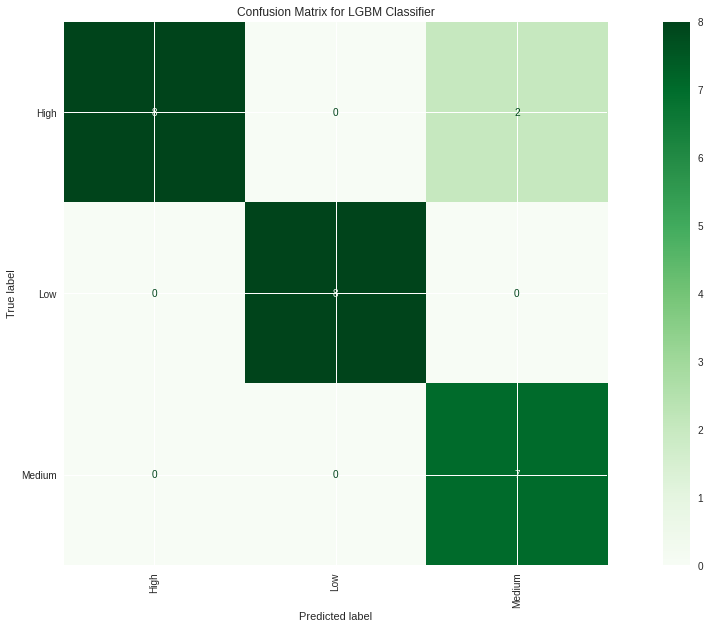

In [ ]:
#confusion matrix plot
fig1,ax1 = plt.subplots(figsize = (20,10))
ax1.set_title("Confusion Matrix for LGBM Classifier")
conf_matrix_lgbm = confusion_matrix(y_selangor_test, y_pred_lgbm_selangor)
lgbm_display = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_lgbm,display_labels = lgbm.classes_)
lgbm_display.plot(cmap = 'Greens',xticks_rotation ='vertical',ax=ax1)

In [ ]:
#model 2: Random Forest Classifier
print('=================')
print('Random Forest Classifier')
print('=================')
rfc_selangor = RandomForestClassifier(n_estimators=500)
rfc_selangor.fit(X_selangor_train, y_selangor_train)
y_pred_rfc_selangor = rfc_selangor.predict(X_selangor_test)
print(classification_report(y_selangor_test, y_pred_rfc_selangor))
with open(path +'rf_selangor', 'wb') as file:  
    pickle.dump(rfc, file)

Random Forest Classifier
              precision    recall  f1-score   support

        High       1.00      0.80      0.89        10
         Low       1.00      0.88      0.93         8
      Medium       0.70      1.00      0.82         7

    accuracy                           0.88        25
   macro avg       0.90      0.89      0.88        25
weighted avg       0.92      0.88      0.88        25



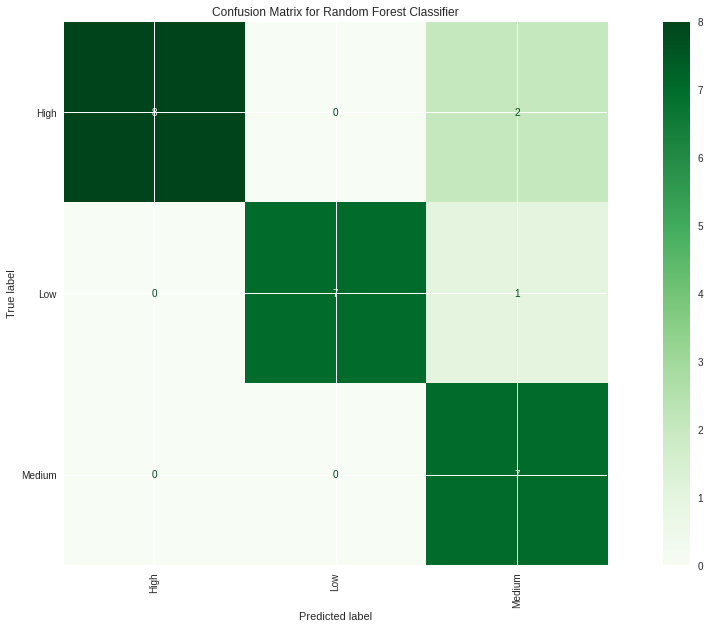

In [ ]:
#confusion matrix plot
fig2,ax2 = plt.subplots(figsize = (20,10))
ax2.set_title("Confusion Matrix for Random Forest Classifier")
conf_matrix_rfc = confusion_matrix(y_selangor_test, y_pred_rfc_selangor)
rfc_display = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_rfc,display_labels = rfc.classes_)
rfc_display.plot(cmap = 'Greens',xticks_rotation ='vertical',ax=ax2)

### 4.4.3 Performance Comparison


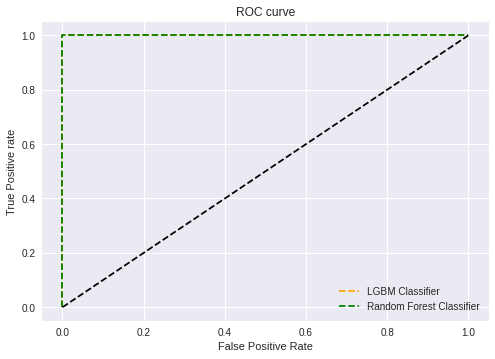

In [ ]:
#ROC curve
encoder = LabelEncoder()
y_selangor_test = encoder.fit_transform(y_selangor_test)
#predict probability
pred_prob1 = lgbm_selangor.predict_proba(X_selangor_test)[:,1]
pred_prob2 = rfc_selangor.predict_proba(X_selangor_test)[:,1]
# roc curve for models
fpr1, tpr1, thresh1 = roc_curve(y_selangor_test, pred_prob1, pos_label=1)
fpr2, tpr2, thresh2 = roc_curve(y_selangor_test, pred_prob2, pos_label=1)

# roc curve for tpr = fpr 
random_probs = [0 for i in range(len(y_selangor_test))]
p_fpr, p_tpr, _ = roc_curve(y_selangor_test, random_probs, pos_label=1)

# plot roc curves
plt.style.use('seaborn')
plt.plot(fpr1, tpr1, linestyle='--',color='orange', label='LGBM Classifier')
plt.plot(fpr2, tpr2, linestyle='--',color='green', label='Random Forest Classifier')
plt.plot(p_fpr, p_tpr, linestyle='--', color='black')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show();


In [ ]:
print('AUC for LGBM Classifier:',metrics.auc(fpr1, tpr1))
print('AUC for Random FOrest Classifier:',metrics.auc(fpr2, tpr2))

AUC for LGBM Classifier: 1.0
AUC for Random FOrest Classifier: 1.0


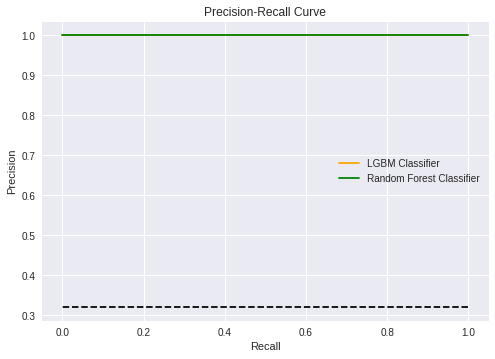

In [ ]:
#Precision-Recall Curve
prec_lgbm, rec_lgbm, threshold_lgbm = precision_recall_curve(y_selangor_test, pred_prob1,pos_label=1)
prec_rfc, rec_rfc, threshold_rfc = precision_recall_curve(y_selangor_test, pred_prob2,pos_label=1)
plt.plot(rec_lgbm, prec_lgbm, color='orange', label='LGBM Classifier') 
plt.plot(rec_rfc, prec_rfc, color='green', label='Random Forest Classifier') 
baseline4 = len(y_selangor_test[y_selangor_test==1]) / len(y_selangor_test)
plt.plot([1, 0], [baseline4,baseline4], color='black', linestyle='--')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()


We use LGBM and Random Forest Classifier to predict the daily cases and compare their performance. The first graph above shows the confusion matrix for the LGBM Classifier. This classifier has high accuracy across all labels. The second graph above shows the confusion matrix for the Random Forest Classifier. This classifier also has high accuracy across the labels. This classifier has a similar accuracy with the LGBM classifier but this classifier predicts less correct labels than the LGBM classifier. The ROC curve and Precision-Recall Curve also shows that both classifiers are perfect classifiers. This happens probably because the data used for training is too little. If we use more data to train these models, we might not be able to replicate the excellent performance. <br/><br/>

If we were forced to choose only one type of supervised learning technique, we will prefer a regression model in this case. Through our experiment above, the linear regression model can predict the number of cases quite accurately with only errors of around 495 cases. The classification model can only predict a label of “low”, “medium” or “high”. We cannot know the exact number of cases for that particular day. For example, if we are trying to predict the value beyond the range of our dataset, for instance 100k cases in a day, the model will only predict it as ‘high’, but we have no idea how high the number of cases is. Therefore, we think that regression works better in this task
